In [28]:
import pandas as pd
import sys
import os

sys.path.append(os.path.abspath(os.path.join(os.getcwd(), '..')))

In [29]:
import pandas as pd
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline


C:\Users\albin\AppData\Local\Temp\ipykernel_17040\92519664.py:17: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'Not Available' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  df.fillna("Not Available", inplace=True)
C:\Users\albin\AppData\Local\Temp\ipykernel_17040\92519664.py:17: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'Not Available' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  df.fillna("Not Available", inplace=True)
C:\Users\albin\AppData\Local\Temp\ipykernel_17040\92519664.py:17: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'Not Available' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  df.fillna("Not 

silhouette_score: 0.2597191588001664
davies_bouldin_score: 1.3942770679942253


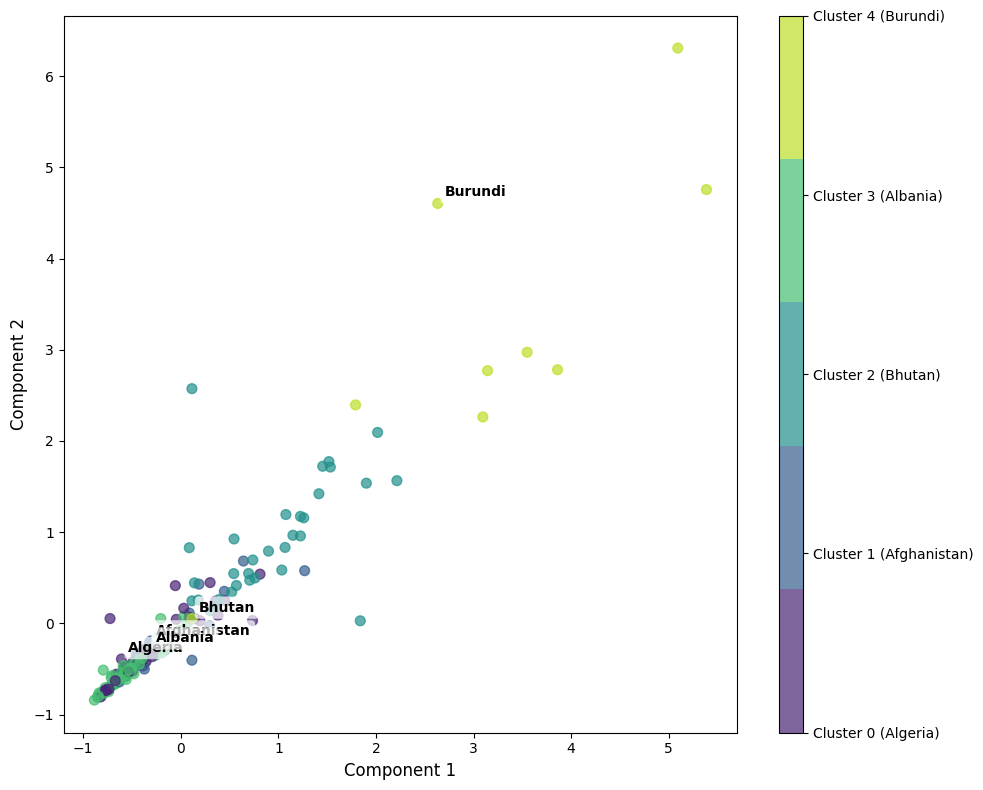

In [30]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.cluster import KMeans
from sklearn.metrics import davies_bouldin_score
from sklearn.metrics import silhouette_score
from utils.functions import plot_clusters_2d
from utils.functions import evaluate_clusters


# Function to process and pivot each dataframe
def process_and_pivot(df, prefix):
    df.fillna(df.mean(numeric_only=True), inplace=True)
    df.fillna("Not Available", inplace=True)
    
    df_filtered = df[['Location', 'Period', 'Value']]
    df_pivoted = df_filtered.pivot(index='Location', columns='Period', values='Value')
    df_pivoted = df_pivoted.rename(columns=lambda x: f"{prefix}_{x}")
    
    return df_pivoted.reset_index()

# Load the datasets
advertisingBan = pd.read_csv('../data/advertising_ban_internet.csv')
affordability = pd.read_csv('../data/affordability.csv')
gdp2000Cigs = pd.read_csv('../data/gdp_for_2000_cigs.csv')
healthWarningPhoto = pd.read_csv('../data/health_warning_photo.csv')
requiredHealthWarnings = pd.read_csv('../data/required_health_warning.csv')

# Process and pivot each dataframe
advertisingBan_pivoted = process_and_pivot(advertisingBan, 'advertisingBan')
affordability_pivoted = process_and_pivot(affordability, 'affordability')
#ageStandardized_pivoted = process_and_pivot(ageStandardized, 'ageStandardized')
gdp2000Cigs_pivoted = process_and_pivot(gdp2000Cigs, 'gdp2000Cigs')
healthWarningPhoto_pivoted = process_and_pivot(healthWarningPhoto, 'healthWarningPhoto')
requiredHealthWarnings_pivoted = process_and_pivot(requiredHealthWarnings, 'requiredHealthWarnings')

# Merge the pivoted dataframes on 'Location'
combined_df = advertisingBan_pivoted.merge(affordability_pivoted, on='Location', how='outer')
combined_df = combined_df.merge(gdp2000Cigs_pivoted, on='Location', how='outer')
combined_df = combined_df.merge(healthWarningPhoto_pivoted, on='Location', how='outer')
combined_df = combined_df.merge(requiredHealthWarnings_pivoted, on='Location', how='outer')

# Drop 'Location' for clustering
data_for_clustering = combined_df.drop(columns=['Location'])

# Preprocessing pipeline: imputing, encoding, and scaling
numeric_features = data_for_clustering.select_dtypes(include=['float64', 'int64']).columns
categorical_features = data_for_clustering.select_dtypes(include=['object']).columns

numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())])

categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('encoder', OneHotEncoder(handle_unknown='ignore'))])

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)])

# Prepare the final data for clustering
clustering_data = preprocessor.fit_transform(data_for_clustering)

# Apply K-means clustering
kmeans = KMeans(n_clusters=5, random_state=42)
kmeans.fit(clustering_data)

mask = kmeans.labels_ != -1
data = clustering_data[mask]
labels = kmeans.labels_[mask]

evaluate_clusters(silhouette_score, data, labels)
evaluate_clusters(davies_bouldin_score, data, labels)

plot_clusters_2d(kmeans, clustering_data, combined_df)


# Find good clusters on KMeans

In [31]:
result = pd.DataFrame(columns=['k', 'silhouette' ,'davies_bouldin'])
import numpy as np
K = np.arange(2, 31, 2)
from sklearn.manifold import TSNE

clustering_data = TSNE(n_components=2).fit_transform(clustering_data)
for k in K:
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(clustering_data)
    mask = kmeans.labels_ != -1
    data = clustering_data[mask]
    labels = kmeans.labels_[mask]

    silhouette = evaluate_clusters(silhouette_score, data, labels)
    davies_bouldin = evaluate_clusters(davies_bouldin_score, data, labels)
    
    result.loc[len(result)] = [k, silhouette, davies_bouldin]
    


silhouette_score: 0.5148636102676392
davies_bouldin_score: 0.7272106576937089
silhouette_score: 0.4607584774494171
davies_bouldin_score: 0.7260299189095551
silhouette_score: 0.5232154130935669
davies_bouldin_score: 0.6440274426785059
silhouette_score: 0.494353711605072
davies_bouldin_score: 0.74027436098908
silhouette_score: 0.512212336063385
davies_bouldin_score: 0.6670613222988052
silhouette_score: 0.5113762021064758
davies_bouldin_score: 0.6579261292984674
silhouette_score: 0.5275759100914001
davies_bouldin_score: 0.619007887390468
silhouette_score: 0.4808719754219055
davies_bouldin_score: 0.7075527869677343
silhouette_score: 0.4778918921947479
davies_bouldin_score: 0.6647356843104323
silhouette_score: 0.4539330005645752
davies_bouldin_score: 0.731777892198064
silhouette_score: 0.46568790078163147
davies_bouldin_score: 0.6802245981491362
silhouette_score: 0.42910125851631165
davies_bouldin_score: 0.6836733645361172
silhouette_score: 0.45438218116760254
davies_bouldin_score: 0.689247

# Plotting silhouette + davies-bouldin metrics
- high silhouette is good
- low davies-bouldin is good

Text(0, 0.5, 'score')

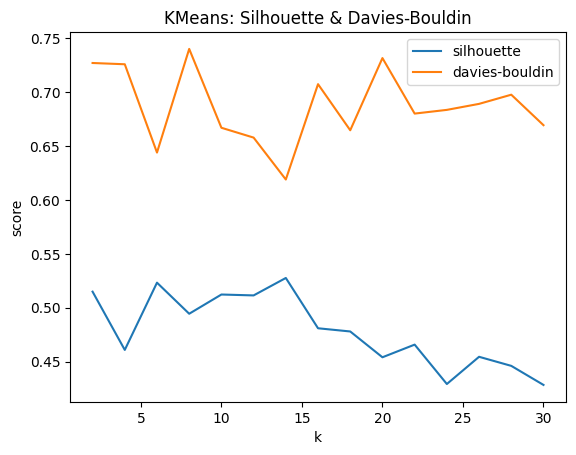

In [32]:
import matplotlib.pyplot as plt
k_sort = result.sort_values('k', ascending=True)
plt.plot(k_sort['k'], k_sort['silhouette'])
plt.plot(k_sort['k'], k_sort['davies_bouldin'])
plt.legend(['silhouette', 'davies-bouldin'])
plt.title('KMeans: Silhouette & Davies-Bouldin')
plt.xlabel('k')
plt.ylabel('score')


For n_clusters = 2 The average silhouette_score is : 0.5148636
For n_clusters = 4 The average silhouette_score is : 0.46075848
For n_clusters = 6 The average silhouette_score is : 0.5246042
For n_clusters = 8 The average silhouette_score is : 0.48929355
For n_clusters = 10 The average silhouette_score is : 0.52117896
For n_clusters = 12 The average silhouette_score is : 0.5055861
For n_clusters = 14 The average silhouette_score is : 0.50545466
For n_clusters = 16 The average silhouette_score is : 0.46237317
For n_clusters = 18 The average silhouette_score is : 0.47384384
For n_clusters = 20 The average silhouette_score is : 0.43921512
For n_clusters = 22 The average silhouette_score is : 0.4552322
For n_clusters = 24 The average silhouette_score is : 0.4234635
For n_clusters = 26 The average silhouette_score is : 0.44164222
For n_clusters = 28 The average silhouette_score is : 0.44880328
For n_clusters = 30 The average silhouette_score is : 0.43668464


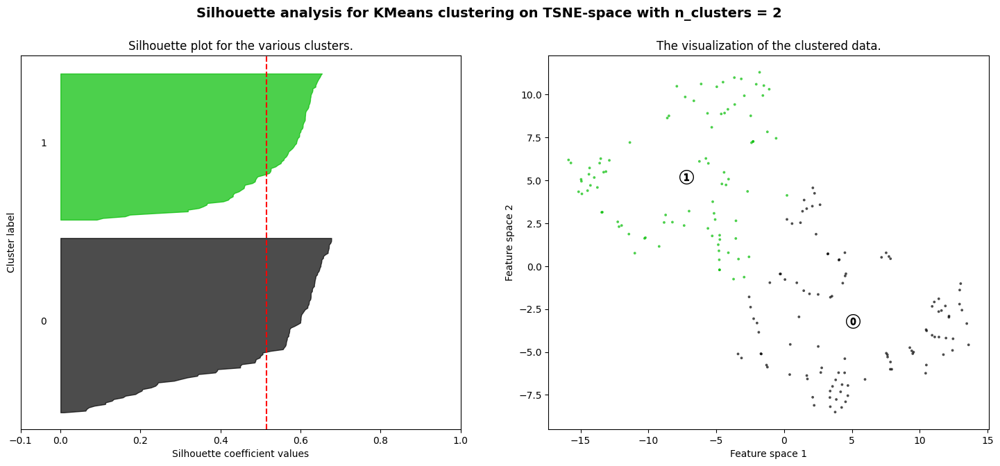

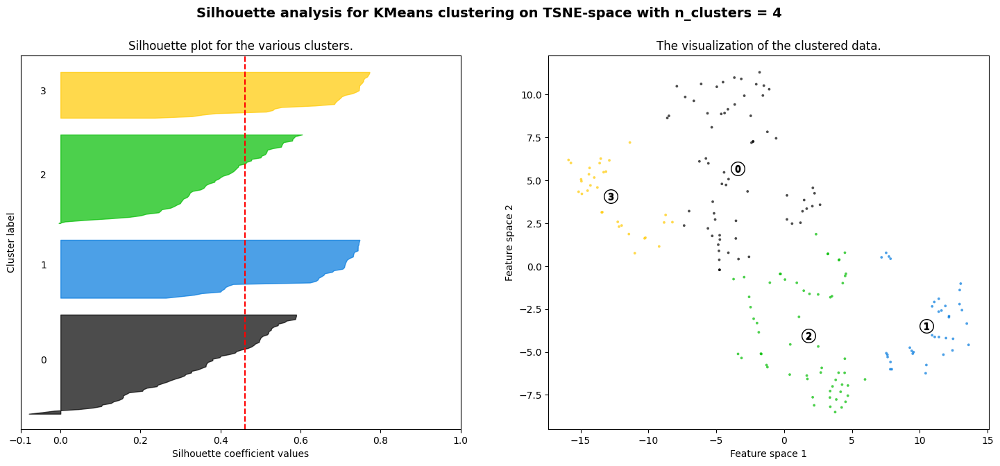

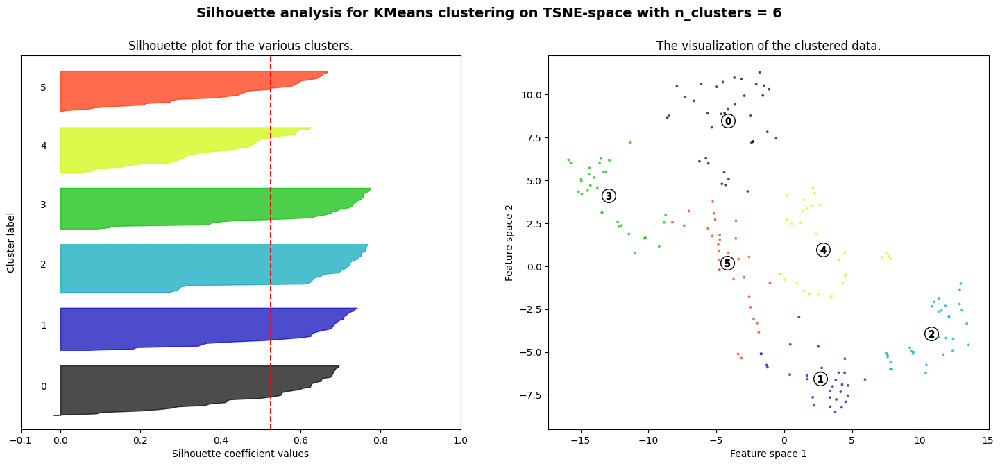

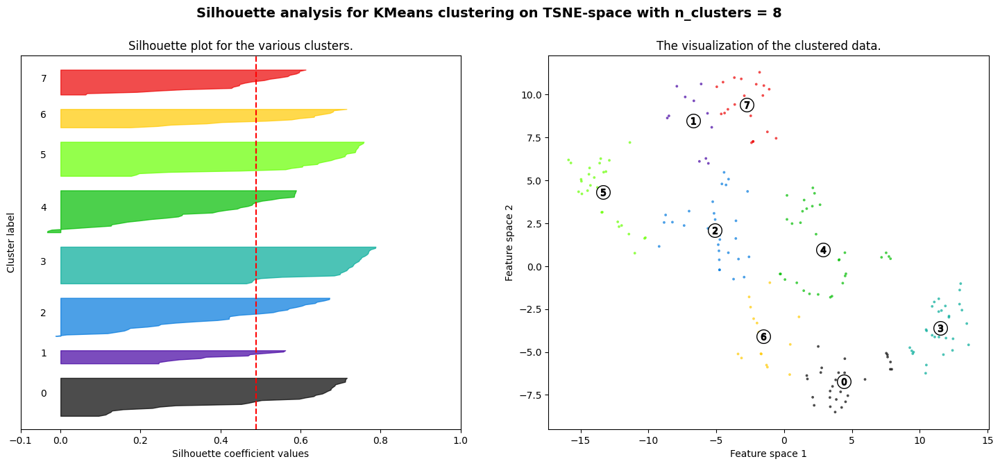

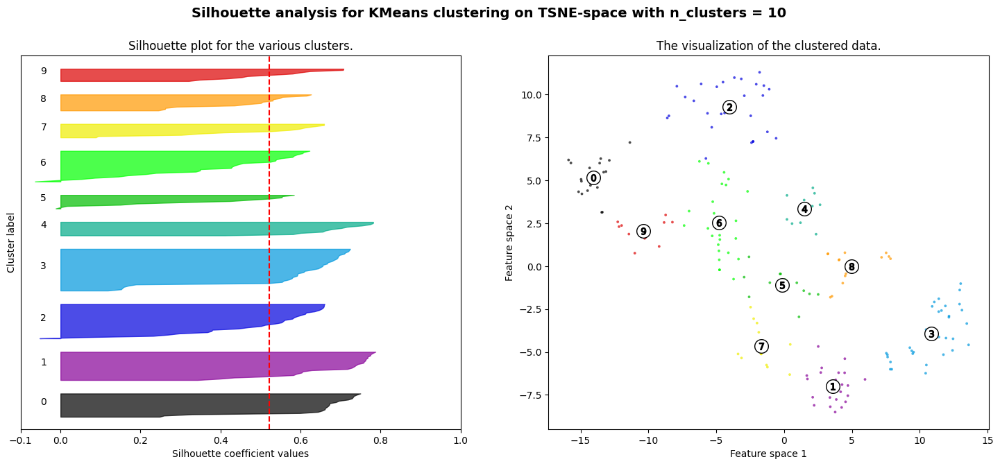

...

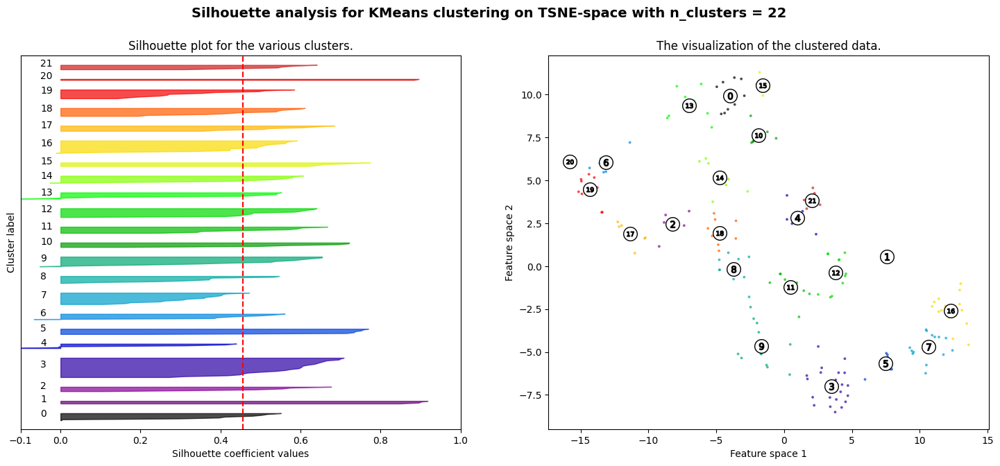

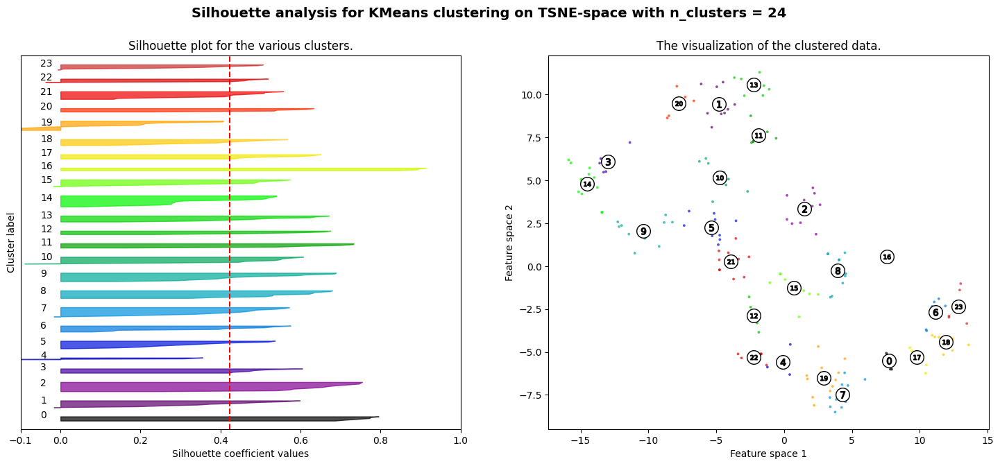

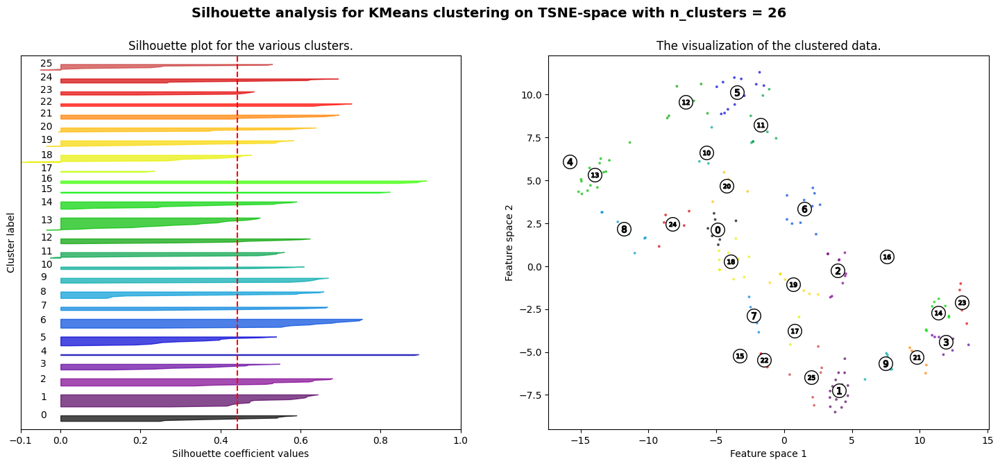

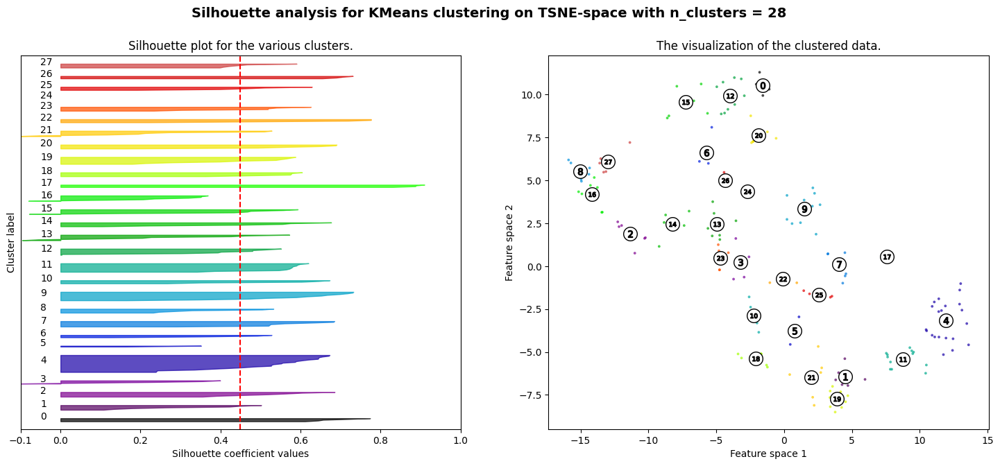

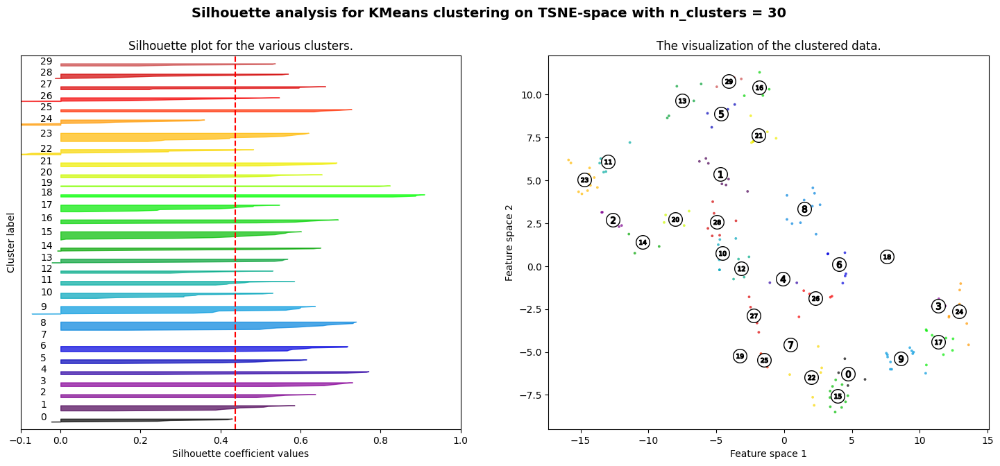

In [33]:
from sklearn.metrics import silhouette_samples
import matplotlib.cm as cm
import matplotlib.pyplot as plt



for n_clusters in K:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(clustering_data) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters)
    cluster_labels = clusterer.fit_predict(clustering_data)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(clustering_data, cluster_labels)
    print(
        "For n_clusters =",
        n_clusters,
        "The average silhouette_score is :",
        silhouette_avg,
    )

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(clustering_data, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("Silhouette plot for the various clusters.")
    ax1.set_xlabel("Silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(
        clustering_data[:, 0], clustering_data[:, 1], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
    )

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(
        centers[:, 0],
        centers[:, 1],
        marker="o",
        c="white",
        alpha=1,
        s=200,
        edgecolor="k",
    )

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space 1")
    ax2.set_ylabel("Feature space 2")

    plt.suptitle(
        "Silhouette analysis for KMeans clustering on TSNE-space with n_clusters = %d"
        % n_clusters,
        fontsize=14,
        fontweight="bold",
    )

plt.show()

#### Increasing k makes better cohesion in clusters, but separation is unchanged. Too many clusters

# Try with DBSCAN

silhouette_score: 0.492623895406723
davies_bouldin_score: 0.5135201424028467
-----------------------
Epsilon: 1.0
Min Samples: 2
silhouette_score: 0.492623895406723
davies_bouldin_score: 0.5135201424028467
Number of clusters:  35
Number of points in cluster 0: 4
['Afghanistan' 'Antigua and Barbuda' 'Mauritania' 'Niue']

Number of points in cluster 1: 2
['Algeria' 'Israel']

Number of points in cluster 2: 15
['Andorra' 'Angola' 'Bosnia and Herzegovina' 'Dominica'
 'Equatorial Guinea' 'Grenada' 'Guinea-Bissau' 'Haiti'
 'Micronesia (Federated States of)' 'Monaco' 'Saint Kitts and Nevis'
 'Saint Vincent and the Grenadines' 'San Marino' 'Sierra Leone' 'Somalia']

Number of points in cluster 3: 8
['Argentina' 'Costa Rica' 'Denmark' 'Montenegro' 'Oman'
 'Russian Federation' 'Saudi Arabia' 'United Arab Emirates']

Number of points in cluster 4: 16
['Armenia' 'Austria' 'Belarus' 'Bulgaria' 'Czechia' 'Finland' 'Germany'
 'Greece' 'Italy' 'Lithuania' 'Myanmar' 'Netherlands (Kingdom of the)'
 'Pol

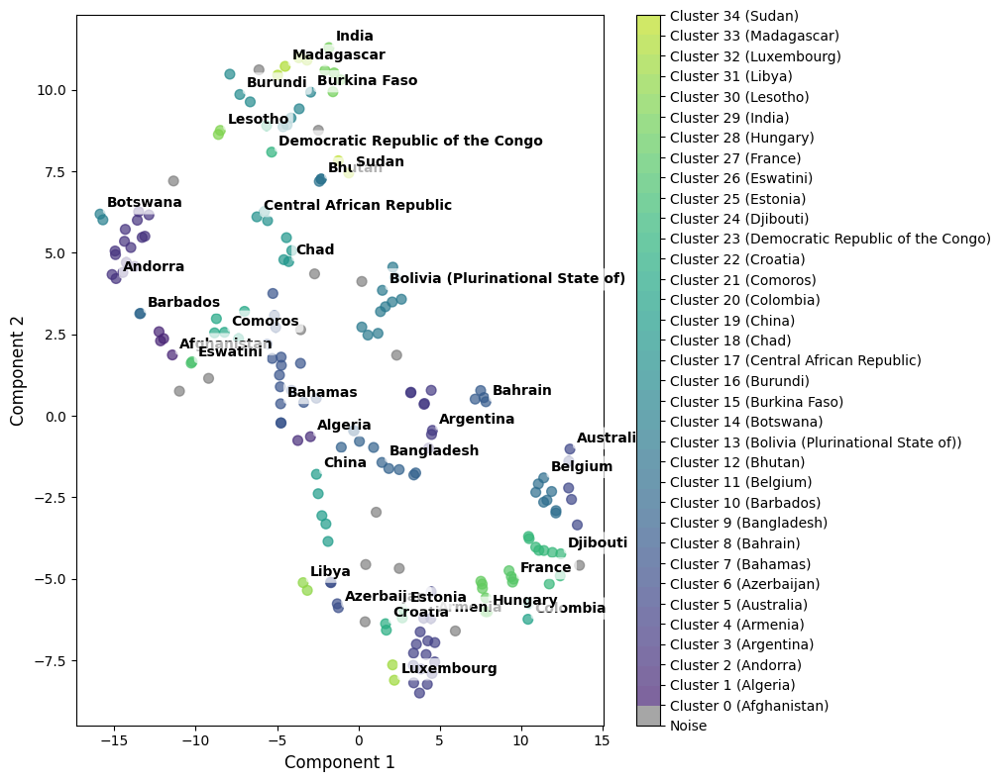

silhouette_score: 0.6518741846084595
davies_bouldin_score: 0.4100820110106518
-----------------------
Epsilon: 1.0
Min Samples: 4
silhouette_score: 0.6518741846084595
davies_bouldin_score: 0.4100820110106518
Number of clusters:  18
Number of points in cluster 0: 15
['Andorra' 'Angola' 'Bosnia and Herzegovina' 'Dominica'
 'Equatorial Guinea' 'Grenada' 'Guinea-Bissau' 'Haiti'
 'Micronesia (Federated States of)' 'Monaco' 'Saint Kitts and Nevis'
 'Saint Vincent and the Grenadines' 'San Marino' 'Sierra Leone' 'Somalia']

Number of points in cluster 1: 4
['Afghanistan' 'Antigua and Barbuda' 'Mauritania' 'Niue']

Number of points in cluster 2: 8
['Argentina' 'Costa Rica' 'Denmark' 'Montenegro' 'Oman'
 'Russian Federation' 'Saudi Arabia' 'United Arab Emirates']

Number of points in cluster 3: 16
['Armenia' 'Austria' 'Belarus' 'Bulgaria' 'Czechia' 'Finland' 'Germany'
 'Greece' 'Italy' 'Lithuania' 'Myanmar' 'Netherlands (Kingdom of the)'
 'Poland' 'Portugal' 'Republic of Korea' 'Slovakia']

Numb

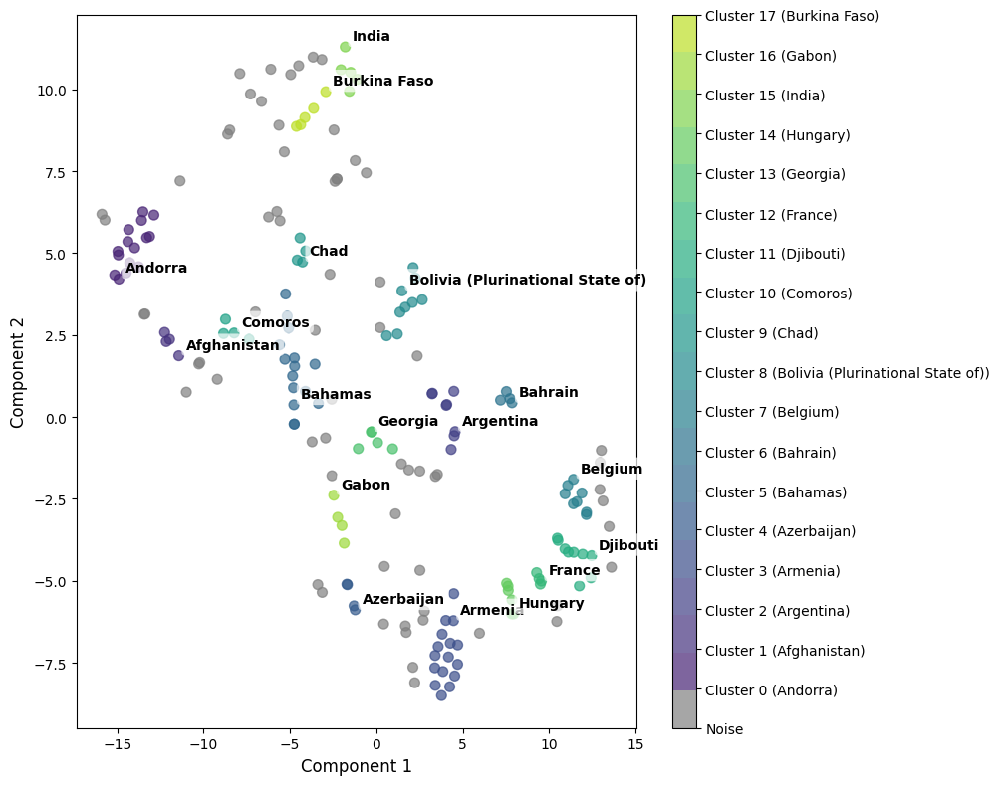

silhouette_score: 0.732491672039032
davies_bouldin_score: 0.38010976371882277
-----------------------
Epsilon: 1.0
Min Samples: 6
silhouette_score: 0.732491672039032
davies_bouldin_score: 0.38010976371882277
Number of clusters:  8
Number of points in cluster 0: 15
['Andorra' 'Angola' 'Bosnia and Herzegovina' 'Dominica'
 'Equatorial Guinea' 'Grenada' 'Guinea-Bissau' 'Haiti'
 'Micronesia (Federated States of)' 'Monaco' 'Saint Kitts and Nevis'
 'Saint Vincent and the Grenadines' 'San Marino' 'Sierra Leone' 'Somalia']

Number of points in cluster 1: 16
['Armenia' 'Austria' 'Belarus' 'Bulgaria' 'Czechia' 'Finland' 'Germany'
 'Greece' 'Italy' 'Lithuania' 'Myanmar' 'Netherlands (Kingdom of the)'
 'Poland' 'Portugal' 'Republic of Korea' 'Slovakia']

Number of points in cluster 2: 13
['Bahamas' 'Belize' "Cote d'Ivoire" 'Cuba' 'Dominican Republic'
 'Guatemala' 'Japan' 'Marshall Islands' 'Morocco' 'Tunisia'
 'United States of America' 'Uzbekistan' 'Zimbabwe']

Number of points in cluster 3: 8
['B

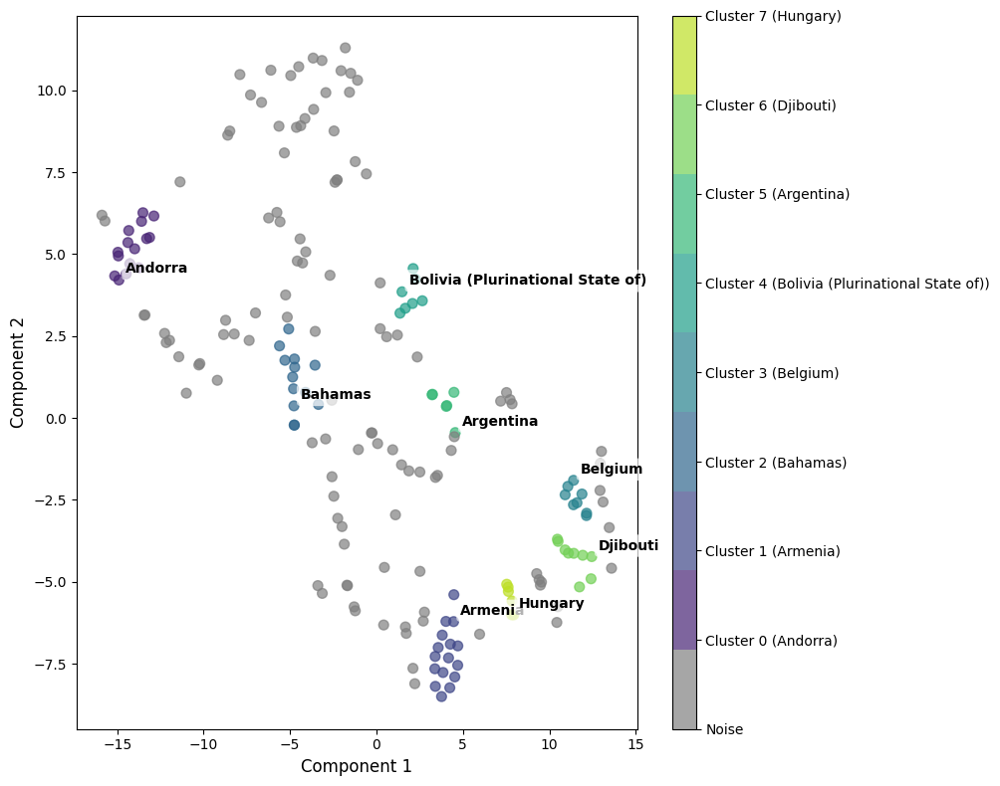

silhouette_score: 0.9117480516433716
davies_bouldin_score: 0.11825494789680256
-----------------------
Epsilon: 1.0
Min Samples: 8
silhouette_score: 0.9117480516433716
davies_bouldin_score: 0.11825494789680256
Number of clusters:  3
Number of points in cluster 0: 13
['Andorra' 'Angola' 'Bosnia and Herzegovina' 'Dominica'
 'Equatorial Guinea' 'Grenada' 'Guinea-Bissau' 'Haiti'
 'Micronesia (Federated States of)' 'Monaco' 'Saint Kitts and Nevis'
 'Saint Vincent and the Grenadines' 'San Marino']

Number of points in cluster 1: 8
['Belgium' 'Brazil' 'Chile' 'New Zealand' 'Romania' 'Singapore' 'Thailand'
 'United Kingdom of Great Britain and Northern Ireland']

Number of points in cluster 2: 15
['Armenia' 'Austria' 'Belarus' 'Bulgaria' 'Czechia' 'Finland' 'Germany'
 'Greece' 'Italy' 'Lithuania' 'Netherlands (Kingdom of the)' 'Poland'
 'Portugal' 'Republic of Korea' 'Slovakia']



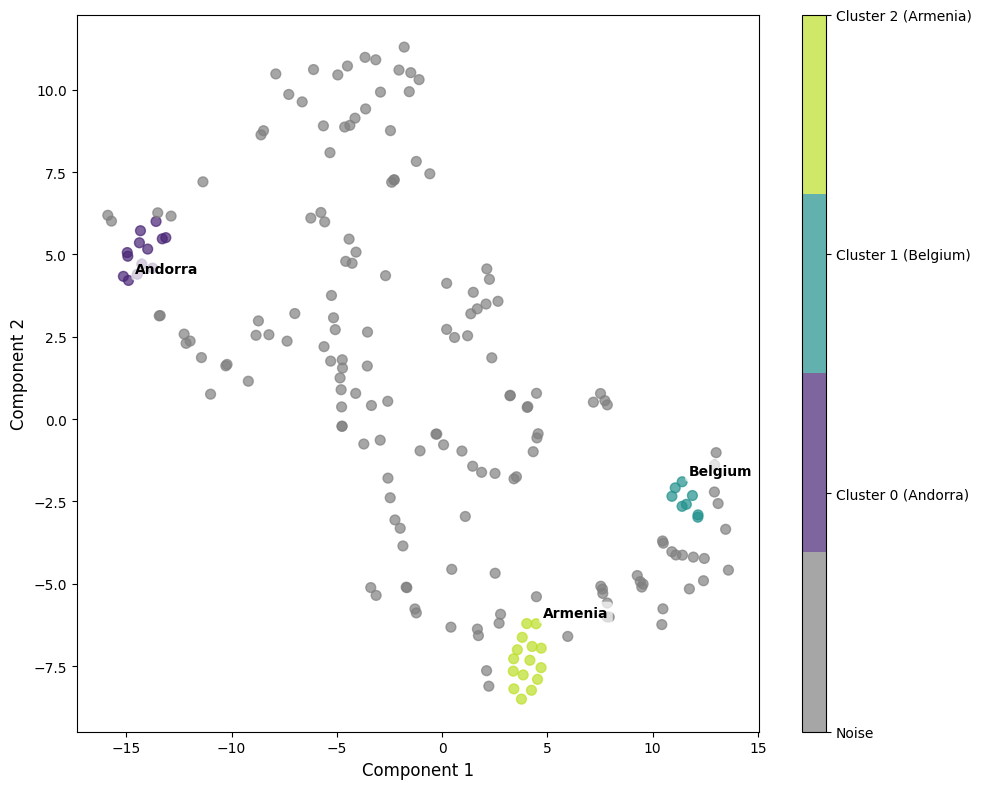

silhouette_score: 0.9515526294708252
davies_bouldin_score: 0.06653225653744874
-----------------------
Epsilon: 1.0
Min Samples: 10
silhouette_score: 0.9515526294708252
davies_bouldin_score: 0.06653225653744874
Number of clusters:  2
Number of points in cluster 0: 11
['Angola' 'Bosnia and Herzegovina' 'Dominica' 'Grenada' 'Guinea-Bissau'
 'Haiti' 'Micronesia (Federated States of)' 'Monaco'
 'Saint Kitts and Nevis' 'Saint Vincent and the Grenadines' 'San Marino']

Number of points in cluster 1: 15
['Armenia' 'Austria' 'Belarus' 'Bulgaria' 'Czechia' 'Finland' 'Germany'
 'Greece' 'Italy' 'Lithuania' 'Netherlands (Kingdom of the)' 'Poland'
 'Portugal' 'Republic of Korea' 'Slovakia']



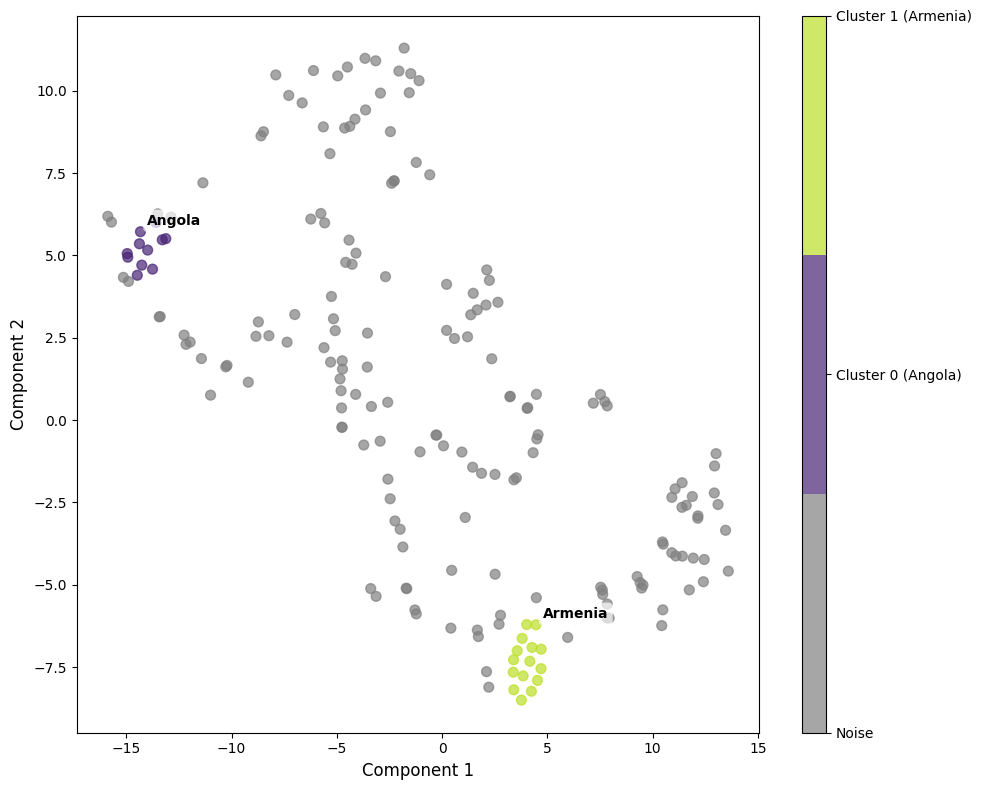

Score cannot be calculated, only one cluster found.
Score cannot be calculated, only one cluster found.
-----------------------
Epsilon: 1.0
Min Samples: 12
Score cannot be calculated, only one cluster found.
Score cannot be calculated, only one cluster found.
Number of clusters:  0


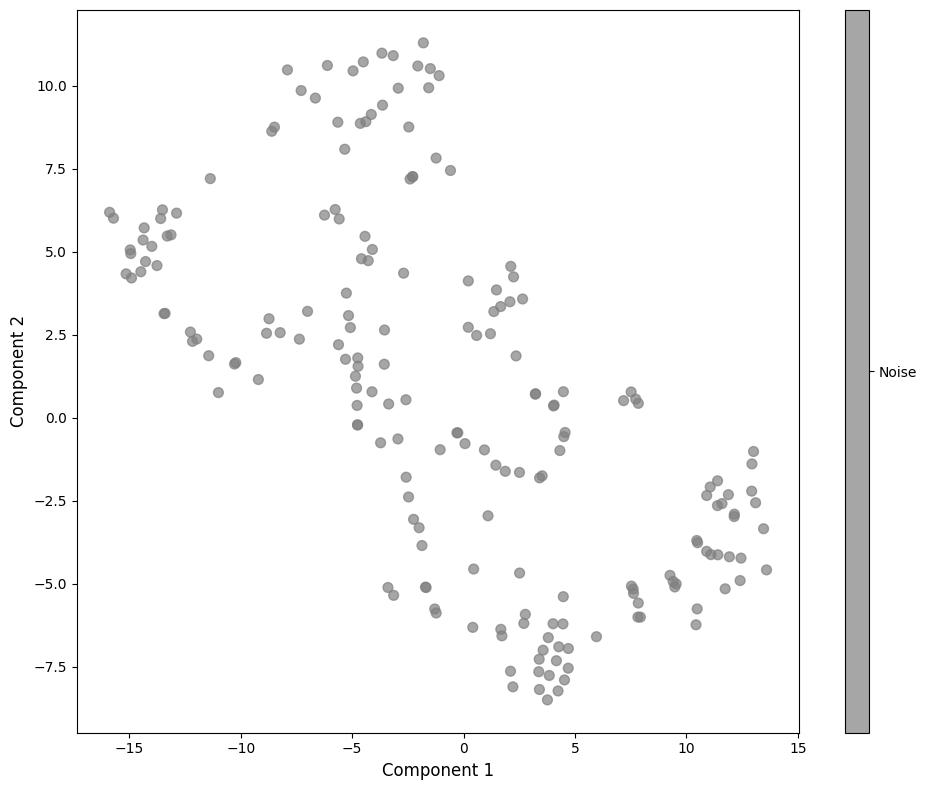

Score cannot be calculated, only one cluster found.
Score cannot be calculated, only one cluster found.
-----------------------
Epsilon: 1.0
Min Samples: 14
Score cannot be calculated, only one cluster found.
Score cannot be calculated, only one cluster found.
Number of clusters:  0


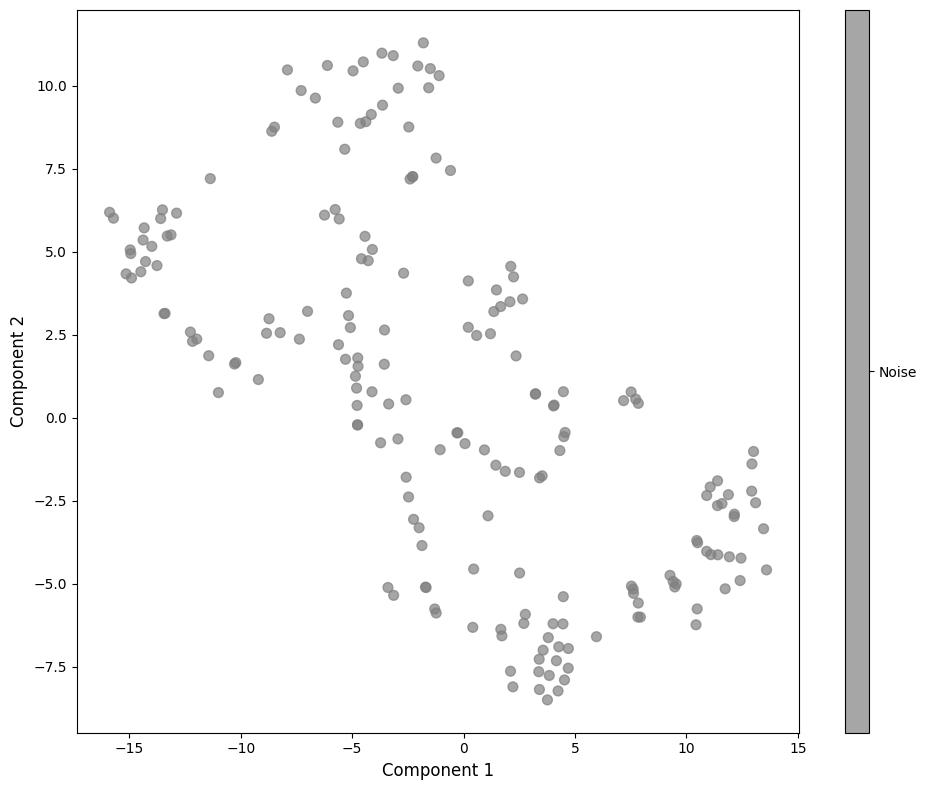

Score cannot be calculated, only one cluster found.
Score cannot be calculated, only one cluster found.
-----------------------
Epsilon: 1.0
Min Samples: 16
Score cannot be calculated, only one cluster found.
Score cannot be calculated, only one cluster found.
Number of clusters:  0


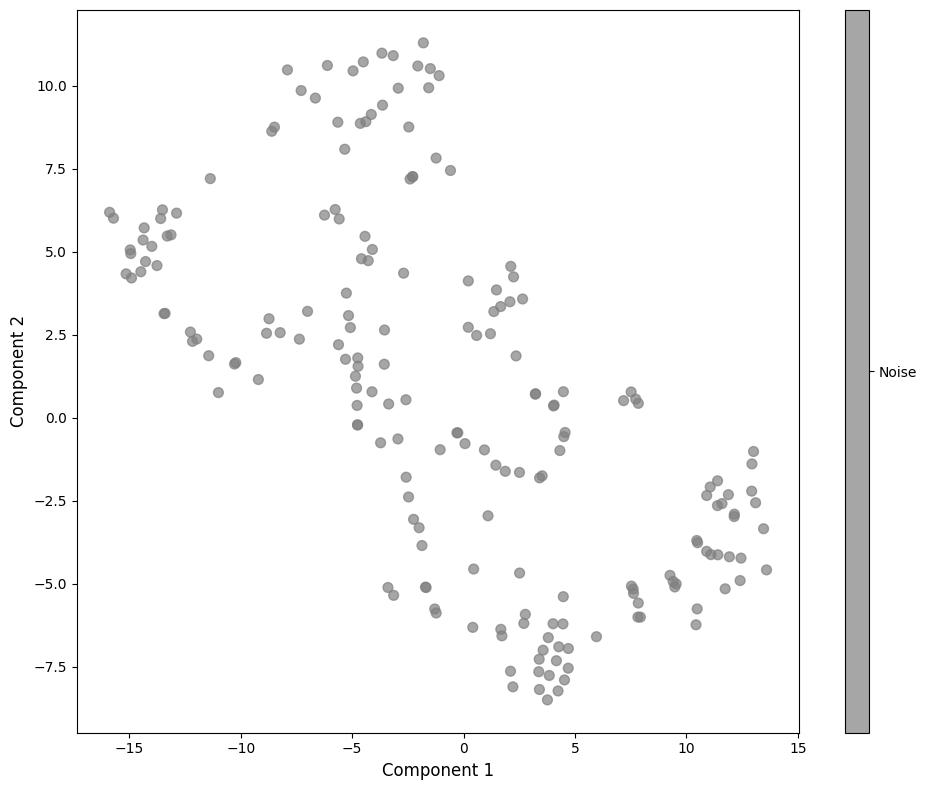

Score cannot be calculated, only one cluster found.
Score cannot be calculated, only one cluster found.
-----------------------
Epsilon: 1.0
Min Samples: 18
Score cannot be calculated, only one cluster found.
Score cannot be calculated, only one cluster found.
Number of clusters:  0


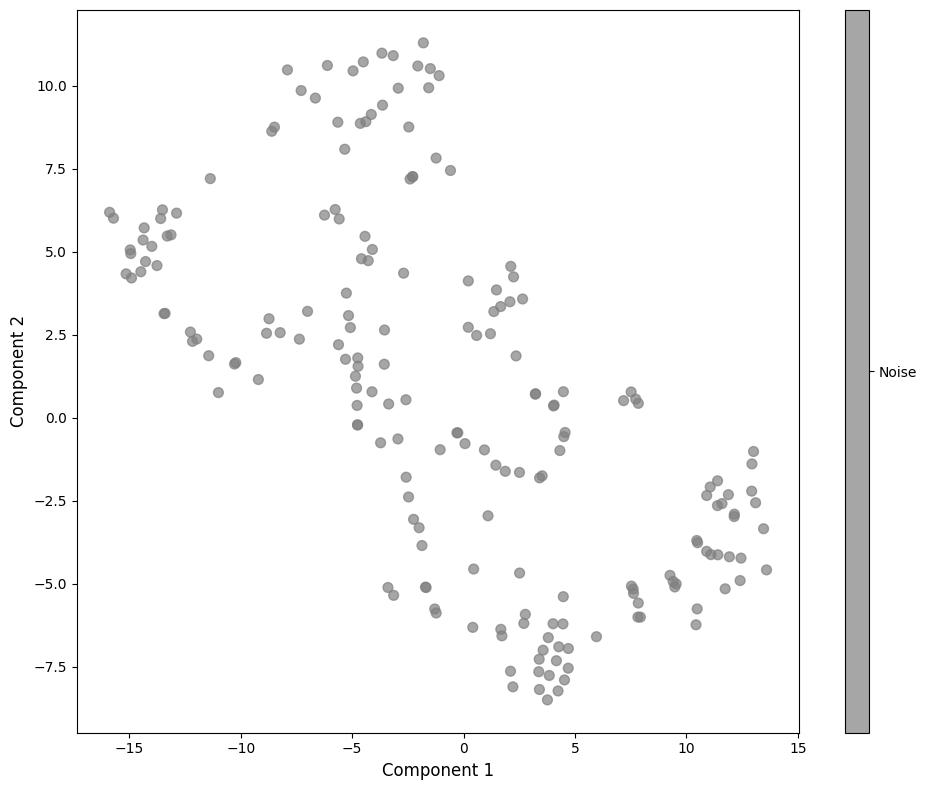

silhouette_score: 0.3595656454563141
davies_bouldin_score: 0.6230570650801802
-----------------------
Epsilon: 1.4285714285714286
Min Samples: 2
silhouette_score: 0.3595656454563141
davies_bouldin_score: 0.6230570650801802
Number of clusters:  14
Number of points in cluster 0: 10
['Afghanistan' 'Antigua and Barbuda' 'Barbados' 'Congo' 'Eswatini'
 'Ethiopia' 'Mauritania' 'Niue' 'Saint Lucia' 'Suriname']

Number of points in cluster 1: 25
['Albania' 'Armenia' 'Austria' 'Belarus' 'Bulgaria' 'Croatia' 'Cyprus'
 'Czechia' 'Estonia' 'Finland' 'Germany' 'Greece' 'Italy'
 "Lao People's Democratic Republic" 'Lithuania' 'Luxembourg' 'Myanmar'
 'Netherlands (Kingdom of the)' 'Philippines' 'Poland' 'Portugal'
 'Republic of Korea' 'Slovakia' 'Slovenia' 'Sweden']

Number of points in cluster 2: 35
['Algeria' 'Azerbaijan' 'Bahamas' 'Belize' 'Benin' 'Cabo Verde' 'Cameroon'
 'Central African Republic' 'Chad' 'China' 'Cook Islands' "Cote d'Ivoire"
 'Cuba' 'Dominican Republic' 'Fiji' 'Gabon' 'Guatemala' 

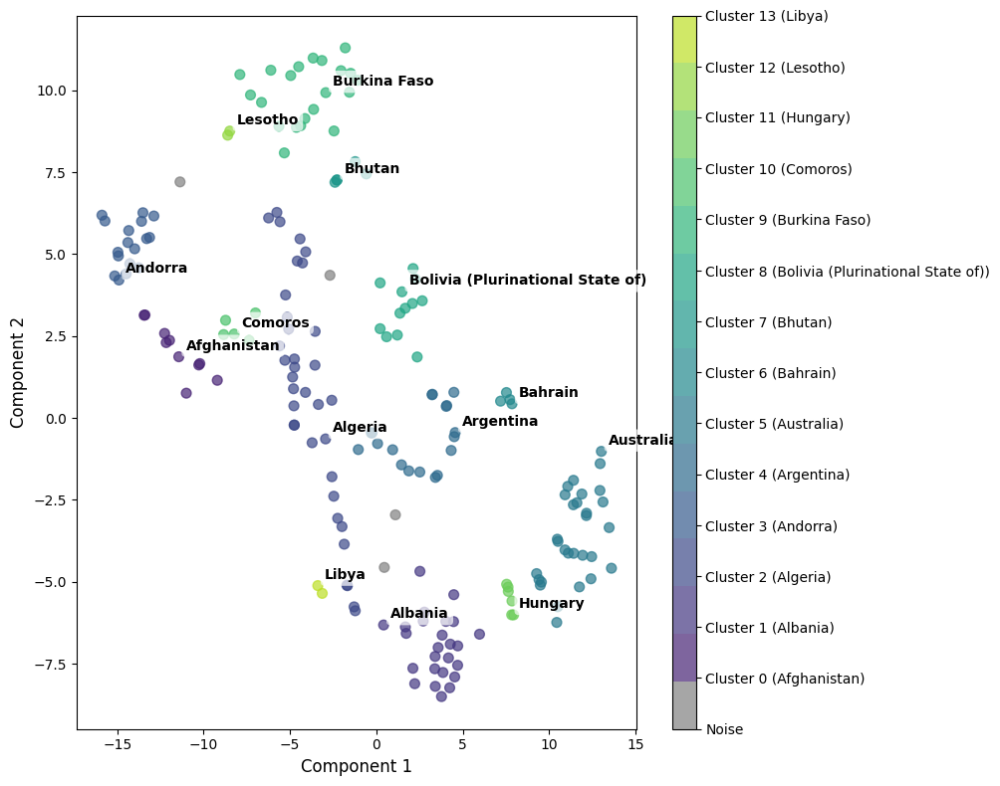

silhouette_score: 0.39530742168426514
davies_bouldin_score: 0.6451461972093364
-----------------------
Epsilon: 1.4285714285714286
Min Samples: 4
silhouette_score: 0.39530742168426514
davies_bouldin_score: 0.6451461972093364
Number of clusters:  12
Number of points in cluster 0: 10
['Afghanistan' 'Antigua and Barbuda' 'Barbados' 'Congo' 'Eswatini'
 'Ethiopia' 'Mauritania' 'Niue' 'Saint Lucia' 'Suriname']

Number of points in cluster 1: 35
['Algeria' 'Azerbaijan' 'Bahamas' 'Belize' 'Benin' 'Cabo Verde' 'Cameroon'
 'Central African Republic' 'Chad' 'China' 'Cook Islands' "Cote d'Ivoire"
 'Cuba' 'Dominican Republic' 'Fiji' 'Gabon' 'Guatemala' 'Guinea' 'Israel'
 'Jamaica' 'Japan' 'Lebanon' 'Marshall Islands' 'Morocco' 'Mozambique'
 'Nicaragua' 'Serbia' 'South Africa' 'Timor-Leste' 'Tonga' 'Tunisia'
 'United States of America' 'Uzbekistan' 'Zambia' 'Zimbabwe']

Number of points in cluster 2: 17
['Andorra' 'Angola' 'Bosnia and Herzegovina' 'Botswana' 'Dominica'
 'Equatorial Guinea' 'Grenada'

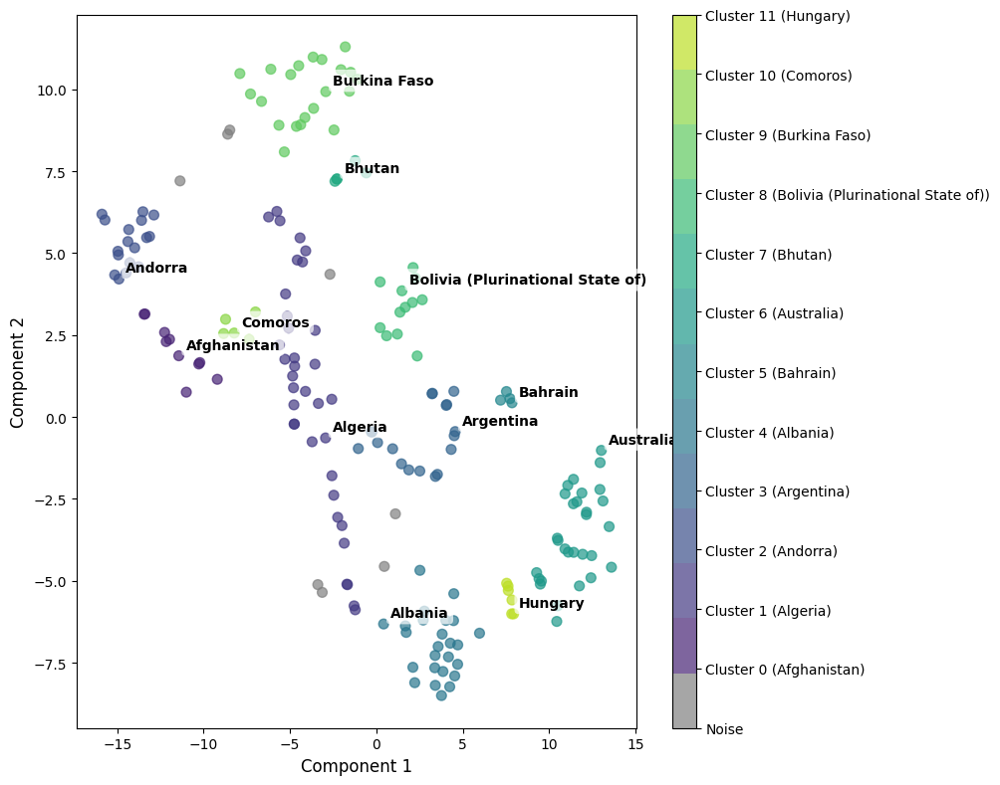

silhouette_score: 0.5873286724090576
davies_bouldin_score: 0.47138050317699276
-----------------------
Epsilon: 1.4285714285714286
Min Samples: 6
silhouette_score: 0.5873286724090576
davies_bouldin_score: 0.47138050317699276
Number of clusters:  10
Number of points in cluster 0: 9
['Afghanistan' 'Antigua and Barbuda' 'Barbados' 'Eswatini' 'Ethiopia'
 'Mauritania' 'Niue' 'Saint Lucia' 'Suriname']

Number of points in cluster 1: 16
['Andorra' 'Angola' 'Bosnia and Herzegovina' 'Dominica'
 'Equatorial Guinea' 'Grenada' 'Guinea-Bissau' 'Haiti'
 'Micronesia (Federated States of)' 'Monaco' 'Palau'
 'Saint Kitts and Nevis' 'Saint Vincent and the Grenadines' 'San Marino'
 'Sierra Leone' 'Somalia']

Number of points in cluster 2: 10
['Argentina' 'Costa Rica' 'Denmark' 'Ecuador' 'El Salvador' 'Montenegro'
 'Oman' 'Russian Federation' 'Saudi Arabia' 'United Arab Emirates']

Number of points in cluster 3: 25
['Albania' 'Armenia' 'Austria' 'Belarus' 'Bulgaria' 'Croatia' 'Cyprus'
 'Czechia' 'Estonia'

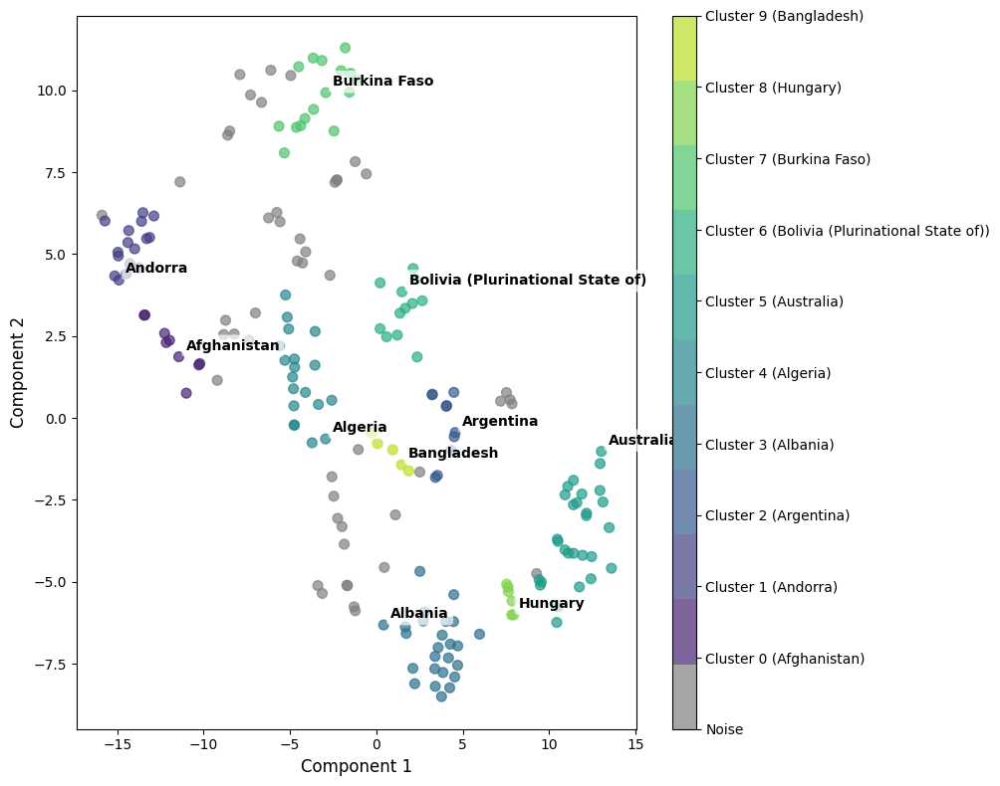

silhouette_score: 0.7567107677459717
davies_bouldin_score: 0.3230683746027743
-----------------------
Epsilon: 1.4285714285714286
Min Samples: 8
silhouette_score: 0.7567107677459717
davies_bouldin_score: 0.3230683746027743
Number of clusters:  6
Number of points in cluster 0: 16
['Andorra' 'Angola' 'Bosnia and Herzegovina' 'Dominica'
 'Equatorial Guinea' 'Grenada' 'Guinea-Bissau' 'Haiti'
 'Micronesia (Federated States of)' 'Monaco' 'Palau'
 'Saint Kitts and Nevis' 'Saint Vincent and the Grenadines' 'San Marino'
 'Sierra Leone' 'Somalia']

Number of points in cluster 1: 24
['Armenia' 'Austria' 'Belarus' 'Bulgaria' 'Croatia' 'Cyprus' 'Czechia'
 'Estonia' 'Finland' 'Germany' 'Greece' 'Italy'
 "Lao People's Democratic Republic" 'Lithuania' 'Luxembourg' 'Myanmar'
 'Netherlands (Kingdom of the)' 'Philippines' 'Poland' 'Portugal'
 'Republic of Korea' 'Slovakia' 'Slovenia' 'Sweden']

Number of points in cluster 2: 14
['Bahamas' 'Belize' "Cote d'Ivoire" 'Cuba' 'Dominican Republic'
 'Guatemala' 

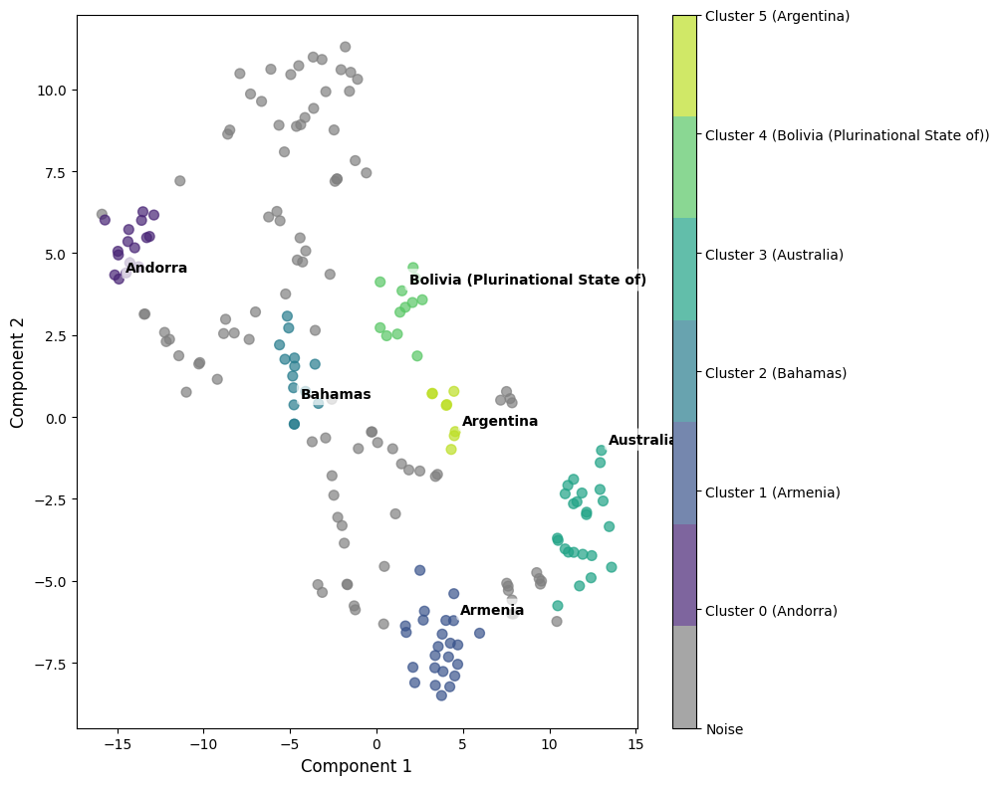

silhouette_score: 0.831468403339386
davies_bouldin_score: 0.22733913696056018
-----------------------
Epsilon: 1.4285714285714286
Min Samples: 10
silhouette_score: 0.831468403339386
davies_bouldin_score: 0.22733913696056018
Number of clusters:  4
Number of points in cluster 0: 16
['Andorra' 'Angola' 'Bosnia and Herzegovina' 'Dominica'
 'Equatorial Guinea' 'Grenada' 'Guinea-Bissau' 'Haiti'
 'Micronesia (Federated States of)' 'Monaco' 'Palau'
 'Saint Kitts and Nevis' 'Saint Vincent and the Grenadines' 'San Marino'
 'Sierra Leone' 'Somalia']

Number of points in cluster 1: 21
['Armenia' 'Austria' 'Belarus' 'Bulgaria' 'Czechia' 'Estonia' 'Finland'
 'Germany' 'Greece' 'Italy' 'Lithuania' 'Luxembourg' 'Myanmar'
 'Netherlands (Kingdom of the)' 'Philippines' 'Poland' 'Portugal'
 'Republic of Korea' 'Slovakia' 'Slovenia' 'Sweden']

Number of points in cluster 2: 22
['Belgium' 'Brazil' 'Canada' 'Chile' 'Djibouti' 'Egypt'
 'Iran (Islamic Republic of)' 'Jordan' 'Kyrgyzstan' 'Latvia' 'Malaysia'
 'M

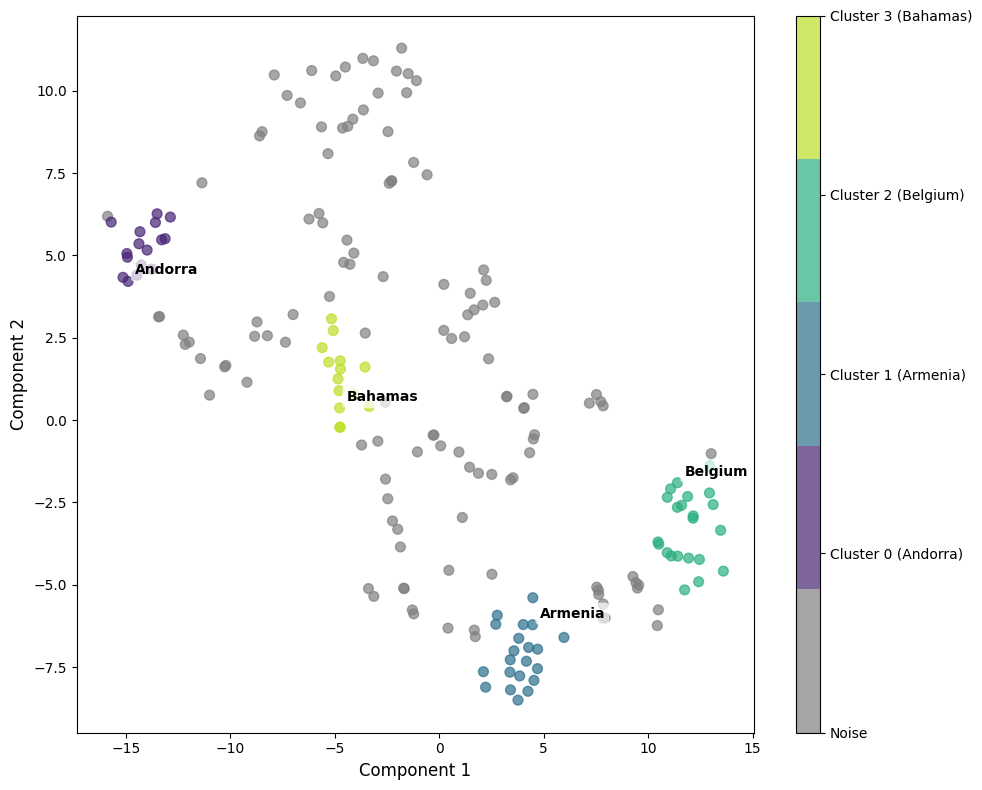

silhouette_score: 0.8664436936378479
davies_bouldin_score: 0.1792091848019578
-----------------------
Epsilon: 1.4285714285714286
Min Samples: 12
silhouette_score: 0.8664436936378479
davies_bouldin_score: 0.1792091848019578
Number of clusters:  3
Number of points in cluster 0: 15
['Andorra' 'Angola' 'Bosnia and Herzegovina' 'Dominica'
 'Equatorial Guinea' 'Grenada' 'Guinea-Bissau' 'Haiti'
 'Micronesia (Federated States of)' 'Monaco' 'Palau'
 'Saint Kitts and Nevis' 'Saint Vincent and the Grenadines' 'San Marino'
 'Somalia']

Number of points in cluster 1: 21
['Armenia' 'Austria' 'Belarus' 'Bulgaria' 'Czechia' 'Estonia' 'Finland'
 'Germany' 'Greece' 'Italy' 'Lithuania' 'Luxembourg' 'Myanmar'
 'Netherlands (Kingdom of the)' 'Philippines' 'Poland' 'Portugal'
 'Republic of Korea' 'Slovakia' 'Slovenia' 'Sweden']

Number of points in cluster 2: 14
['Belgium' 'Brazil' 'Chile' 'Djibouti' 'Jordan' 'Malaysia' 'New Zealand'
 'Panama' 'Peru' 'Romania' 'Singapore' 'Thailand'
 'United Kingdom of Gre

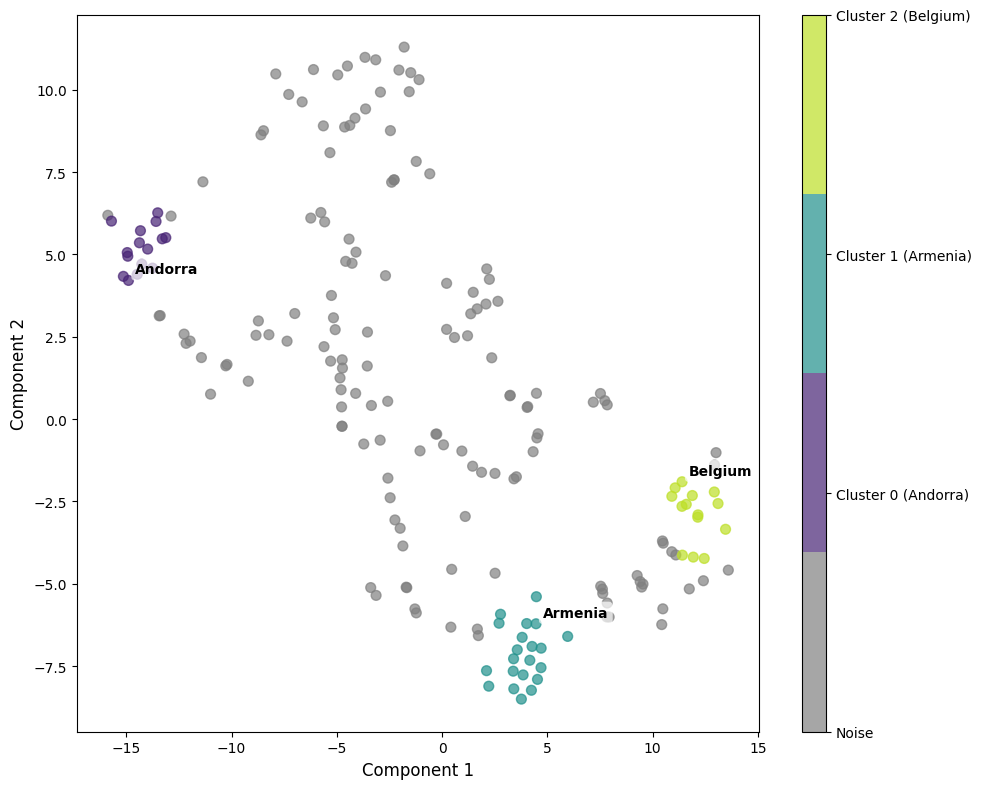

silhouette_score: 0.8730127215385437
davies_bouldin_score: 0.17202397662394794
-----------------------
Epsilon: 1.4285714285714286
Min Samples: 14
silhouette_score: 0.8730127215385437
davies_bouldin_score: 0.17202397662394794
Number of clusters:  3
Number of points in cluster 0: 14
['Andorra' 'Angola' 'Bosnia and Herzegovina' 'Dominica'
 'Equatorial Guinea' 'Grenada' 'Guinea-Bissau' 'Haiti'
 'Micronesia (Federated States of)' 'Monaco' 'Saint Kitts and Nevis'
 'Saint Vincent and the Grenadines' 'San Marino' 'Somalia']

Number of points in cluster 1: 20
['Armenia' 'Austria' 'Belarus' 'Bulgaria' 'Czechia' 'Estonia' 'Finland'
 'Germany' 'Greece' 'Italy' 'Lithuania' 'Luxembourg' 'Myanmar'
 'Netherlands (Kingdom of the)' 'Poland' 'Portugal' 'Republic of Korea'
 'Slovakia' 'Slovenia' 'Sweden']

Number of points in cluster 2: 14
['Belgium' 'Brazil' 'Chile' 'Djibouti' 'Jordan' 'Malaysia' 'New Zealand'
 'Panama' 'Peru' 'Romania' 'Singapore' 'Thailand'
 'United Kingdom of Great Britain and Northe

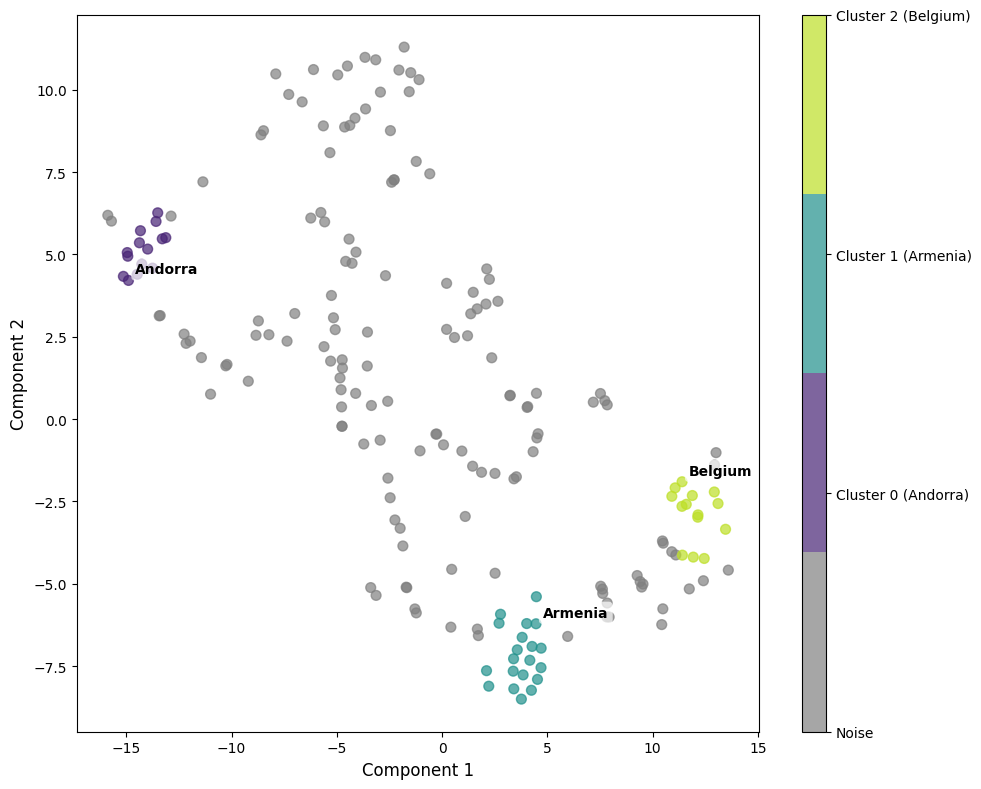

Score cannot be calculated, only one cluster found.
Score cannot be calculated, only one cluster found.
-----------------------
Epsilon: 1.4285714285714286
Min Samples: 16
Score cannot be calculated, only one cluster found.
Score cannot be calculated, only one cluster found.
Number of clusters:  1
Number of points in cluster 0: 18
['Armenia' 'Austria' 'Belarus' 'Bulgaria' 'Czechia' 'Estonia' 'Finland'
 'Germany' 'Greece' 'Italy' 'Lithuania' 'Netherlands (Kingdom of the)'
 'Poland' 'Portugal' 'Republic of Korea' 'Slovakia' 'Slovenia' 'Sweden']



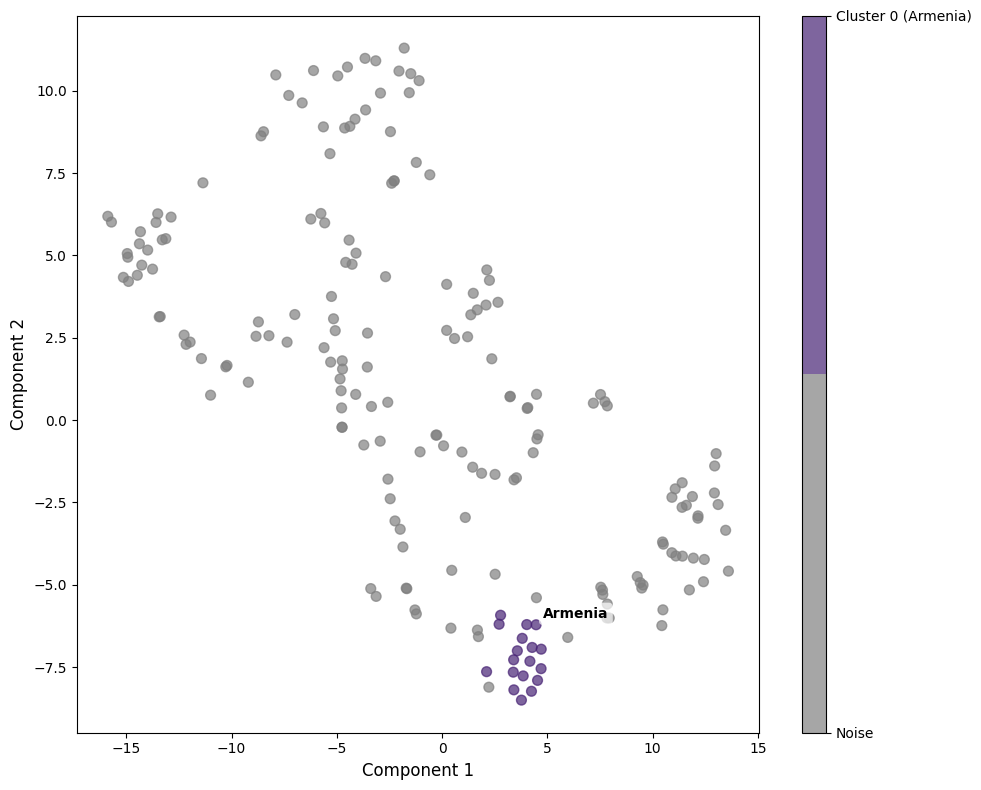

Score cannot be calculated, only one cluster found.
Score cannot be calculated, only one cluster found.
-----------------------
Epsilon: 1.4285714285714286
Min Samples: 18
Score cannot be calculated, only one cluster found.
Score cannot be calculated, only one cluster found.
Number of clusters:  0


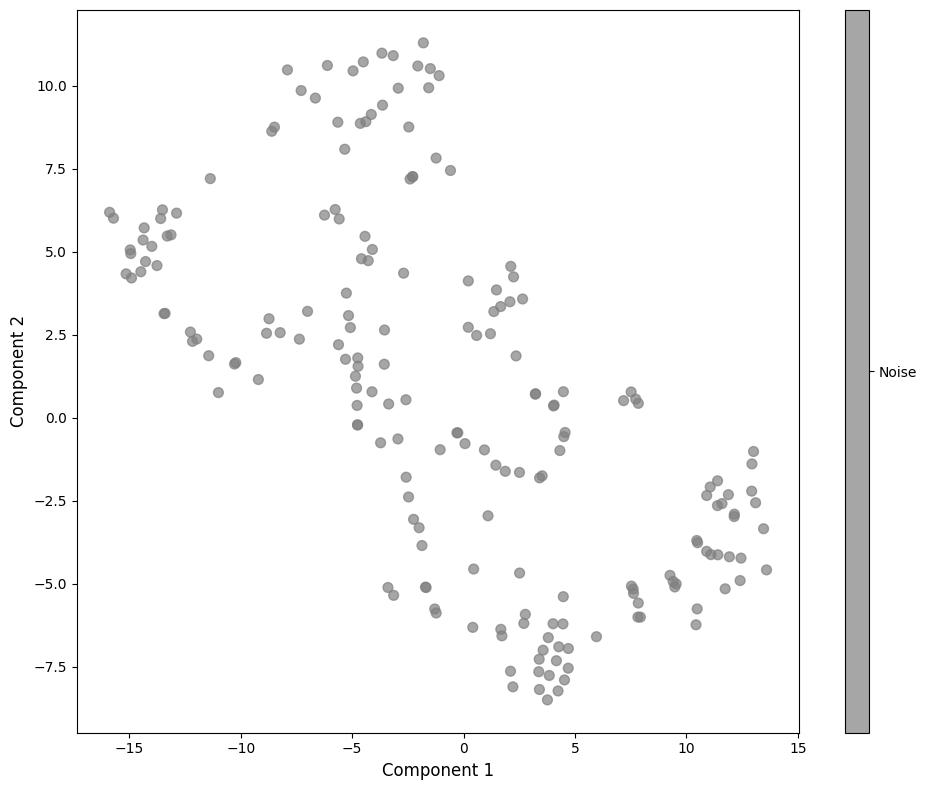

silhouette_score: 0.13095176219940186
davies_bouldin_score: 0.8178943125562432
-----------------------
Epsilon: 1.8571428571428572
Min Samples: 2
silhouette_score: 0.13095176219940186
davies_bouldin_score: 0.8178943125562432
Number of clusters:  4
Number of points in cluster 0: 128
['Afghanistan' 'Albania' 'Algeria' 'Andorra' 'Angola'
 'Antigua and Barbuda' 'Argentina' 'Armenia' 'Austria' 'Azerbaijan'
 'Bahamas' 'Bangladesh' 'Barbados' 'Belarus' 'Belize' 'Benin'
 'Bolivia (Plurinational State of)' 'Bosnia and Herzegovina' 'Botswana'
 'Brunei Darussalam' 'Bulgaria' 'Cabo Verde' 'Cameroon'
 'Central African Republic' 'Chad' 'China' 'Comoros' 'Congo'
 'Cook Islands' 'Costa Rica' "Cote d'Ivoire" 'Croatia' 'Cuba' 'Cyprus'
 'Czechia' "Democratic People's Republic of Korea" 'Denmark' 'Dominica'
 'Dominican Republic' 'Ecuador' 'El Salvador' 'Equatorial Guinea'
 'Estonia' 'Eswatini' 'Ethiopia' 'Fiji' 'Finland' 'Gabon' 'Georgia'
 'Germany' 'Ghana' 'Greece' 'Grenada' 'Guatemala' 'Guinea' 'Guinea-

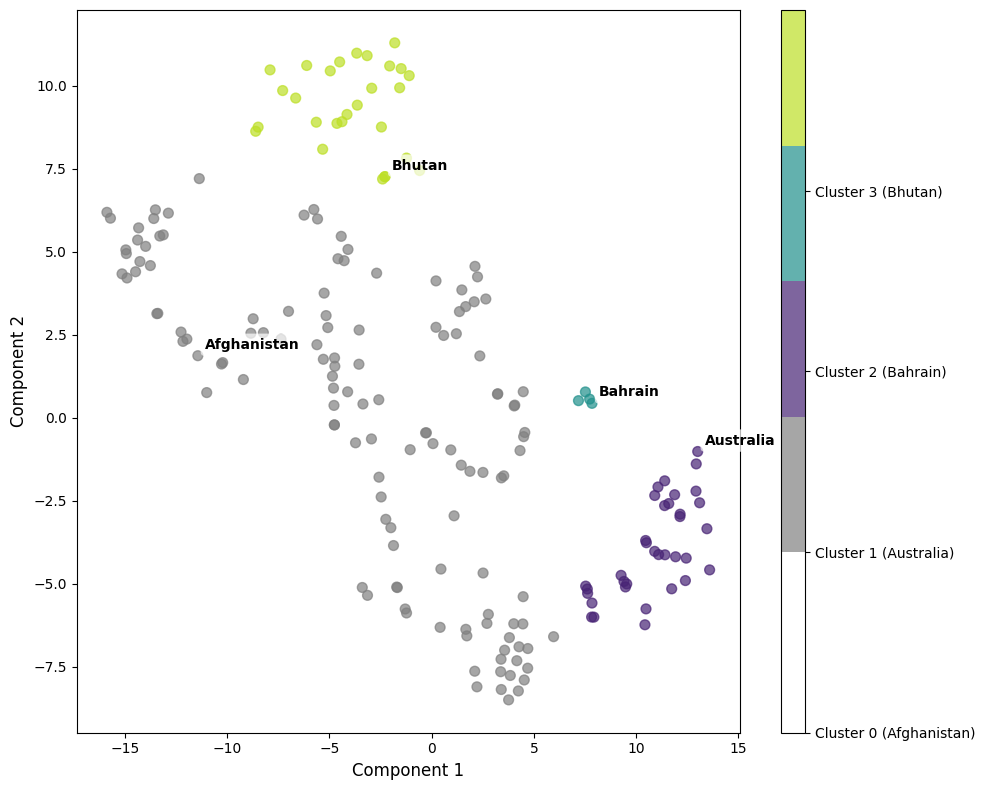

silhouette_score: 0.13095176219940186
davies_bouldin_score: 0.8178943125562432
-----------------------
Epsilon: 1.8571428571428572
Min Samples: 4
silhouette_score: 0.13095176219940186
davies_bouldin_score: 0.8178943125562432
Number of clusters:  4
Number of points in cluster 0: 128
['Afghanistan' 'Albania' 'Algeria' 'Andorra' 'Angola'
 'Antigua and Barbuda' 'Argentina' 'Armenia' 'Austria' 'Azerbaijan'
 'Bahamas' 'Bangladesh' 'Barbados' 'Belarus' 'Belize' 'Benin'
 'Bolivia (Plurinational State of)' 'Bosnia and Herzegovina' 'Botswana'
 'Brunei Darussalam' 'Bulgaria' 'Cabo Verde' 'Cameroon'
 'Central African Republic' 'Chad' 'China' 'Comoros' 'Congo'
 'Cook Islands' 'Costa Rica' "Cote d'Ivoire" 'Croatia' 'Cuba' 'Cyprus'
 'Czechia' "Democratic People's Republic of Korea" 'Denmark' 'Dominica'
 'Dominican Republic' 'Ecuador' 'El Salvador' 'Equatorial Guinea'
 'Estonia' 'Eswatini' 'Ethiopia' 'Fiji' 'Finland' 'Gabon' 'Georgia'
 'Germany' 'Ghana' 'Greece' 'Grenada' 'Guatemala' 'Guinea' 'Guinea-

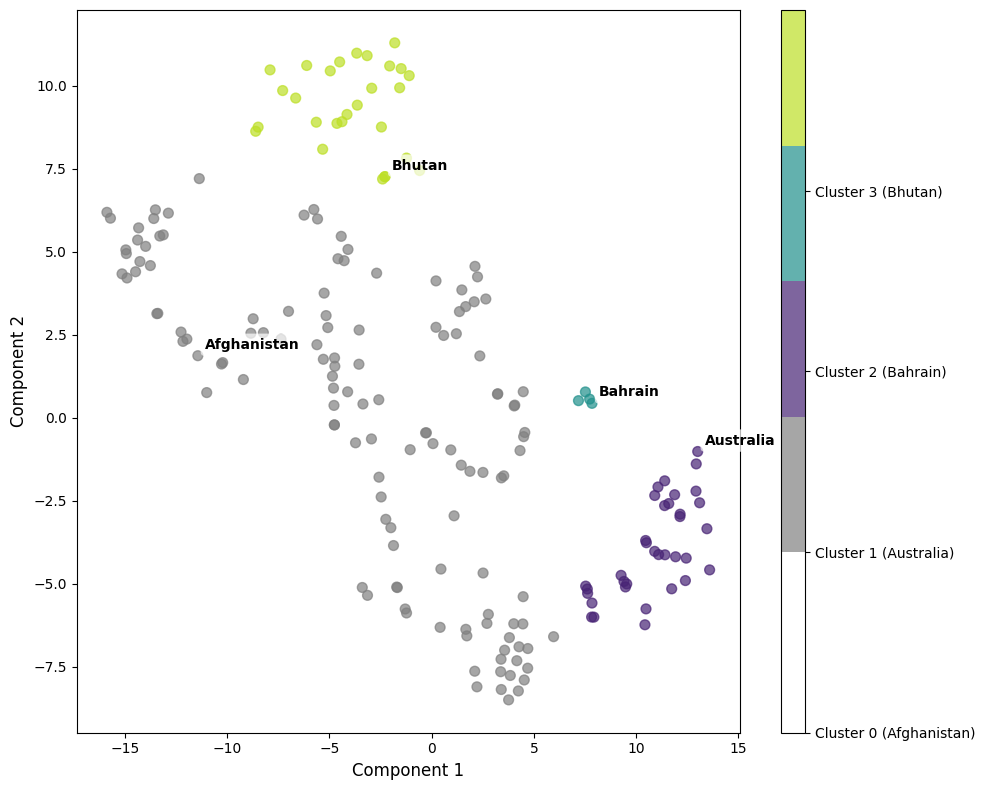

silhouette_score: 0.41340190172195435
davies_bouldin_score: 0.724881509496756
-----------------------
Epsilon: 1.8571428571428572
Min Samples: 6
silhouette_score: 0.41340190172195435
davies_bouldin_score: 0.724881509496756
Number of clusters:  5
Number of points in cluster 0: 72
['Afghanistan' 'Algeria' 'Andorra' 'Angola' 'Antigua and Barbuda'
 'Azerbaijan' 'Bahamas' 'Barbados' 'Belize' 'Benin'
 'Bosnia and Herzegovina' 'Botswana' 'Cabo Verde' 'Cameroon'
 'Central African Republic' 'Chad' 'China' 'Comoros' 'Congo'
 'Cook Islands' "Cote d'Ivoire" 'Cuba'
 "Democratic People's Republic of Korea" 'Dominica' 'Dominican Republic'
 'Equatorial Guinea' 'Eswatini' 'Ethiopia' 'Fiji' 'Gabon' 'Grenada'
 'Guatemala' 'Guinea' 'Guinea-Bissau' 'Haiti' 'Israel' 'Jamaica' 'Japan'
 'Lebanon' 'Liberia' 'Libya' 'Marshall Islands' 'Mauritania'
 'Micronesia (Federated States of)' 'Monaco' 'Morocco' 'Mozambique'
 'Nicaragua' 'Nigeria' 'Niue' 'Palau' 'Rwanda' 'Saint Kitts and Nevis'
 'Saint Lucia' 'Saint Vince

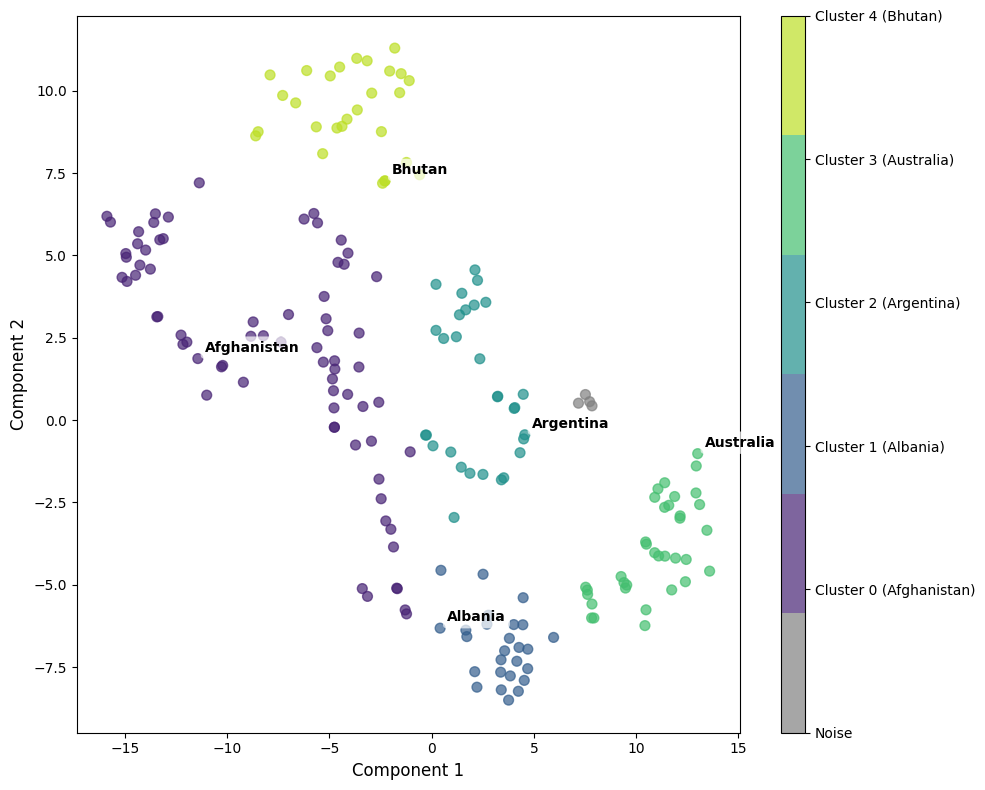

silhouette_score: 0.6257380247116089
davies_bouldin_score: 0.4630588771392904
-----------------------
Epsilon: 1.8571428571428572
Min Samples: 8
silhouette_score: 0.6257380247116089
davies_bouldin_score: 0.4630588771392904
Number of clusters:  7
Number of points in cluster 0: 23
['Andorra' 'Angola' 'Antigua and Barbuda' 'Barbados'
 'Bosnia and Herzegovina' 'Botswana' 'Dominica' 'Equatorial Guinea'
 'Grenada' 'Guinea-Bissau' 'Haiti' 'Liberia' 'Mauritania'
 'Micronesia (Federated States of)' 'Monaco' 'Niue' 'Palau'
 'Saint Kitts and Nevis' 'Saint Lucia' 'Saint Vincent and the Grenadines'
 'San Marino' 'Sierra Leone' 'Somalia']

Number of points in cluster 1: 22
['Argentina' 'Bolivia (Plurinational State of)' 'Brunei Darussalam'
 'Costa Rica' 'Denmark' 'Ecuador' 'El Salvador' 'Honduras' 'Indonesia'
 'Iraq' 'Ireland' 'Mexico' 'Montenegro' 'Oman' 'Pakistan'
 'Russian Federation' 'Saudi Arabia' 'Switzerland' 'Trinidad and Tobago'
 'Ukraine' 'United Arab Emirates' 'Venezuela (Bolivarian Repub

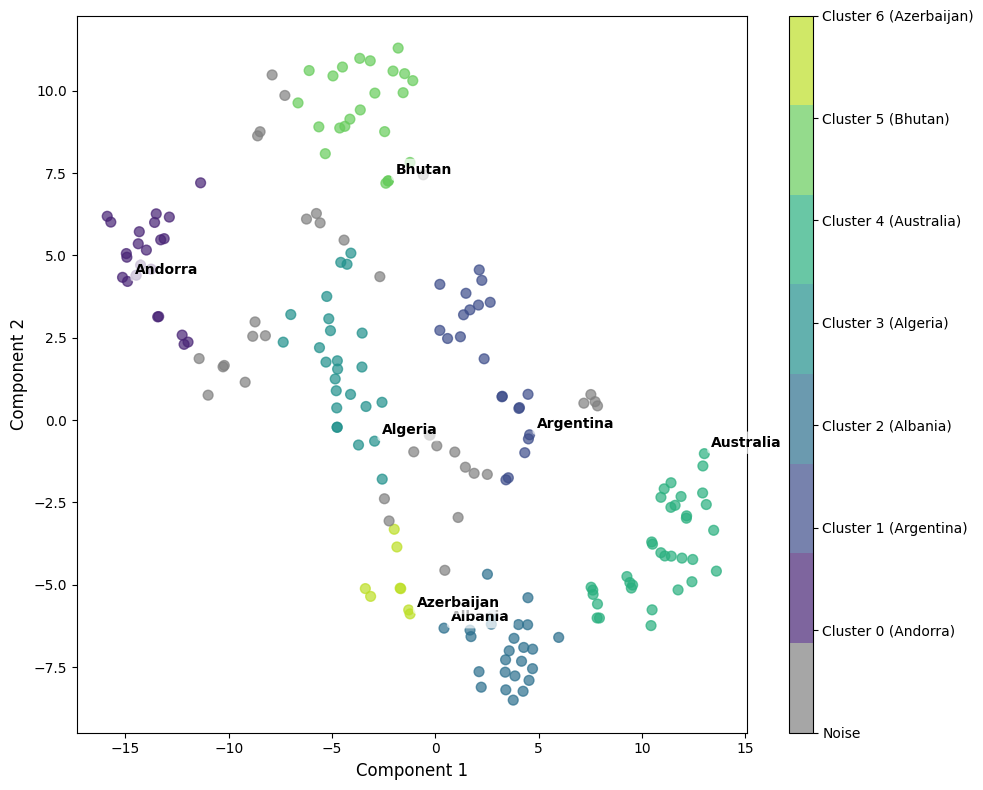

silhouette_score: 0.6749410629272461
davies_bouldin_score: 0.4038991624435678
-----------------------
Epsilon: 1.8571428571428572
Min Samples: 10
silhouette_score: 0.6749410629272461
davies_bouldin_score: 0.4038991624435678
Number of clusters:  7
Number of points in cluster 0: 20
['Andorra' 'Angola' 'Barbados' 'Bosnia and Herzegovina' 'Botswana'
 'Dominica' 'Equatorial Guinea' 'Grenada' 'Guinea-Bissau' 'Haiti'
 'Liberia' 'Micronesia (Federated States of)' 'Monaco' 'Palau'
 'Saint Kitts and Nevis' 'Saint Lucia' 'Saint Vincent and the Grenadines'
 'San Marino' 'Sierra Leone' 'Somalia']

Number of points in cluster 1: 10
['Argentina' 'Costa Rica' 'Denmark' 'Ecuador' 'El Salvador' 'Montenegro'
 'Oman' 'Russian Federation' 'Saudi Arabia' 'United Arab Emirates']

Number of points in cluster 2: 24
['Armenia' 'Austria' 'Belarus' 'Bulgaria' 'Croatia' 'Cyprus' 'Czechia'
 'Estonia' 'Finland' 'Germany' 'Greece' 'Italy'
 "Lao People's Democratic Republic" 'Lithuania' 'Luxembourg' 'Myanmar'
 'Nether

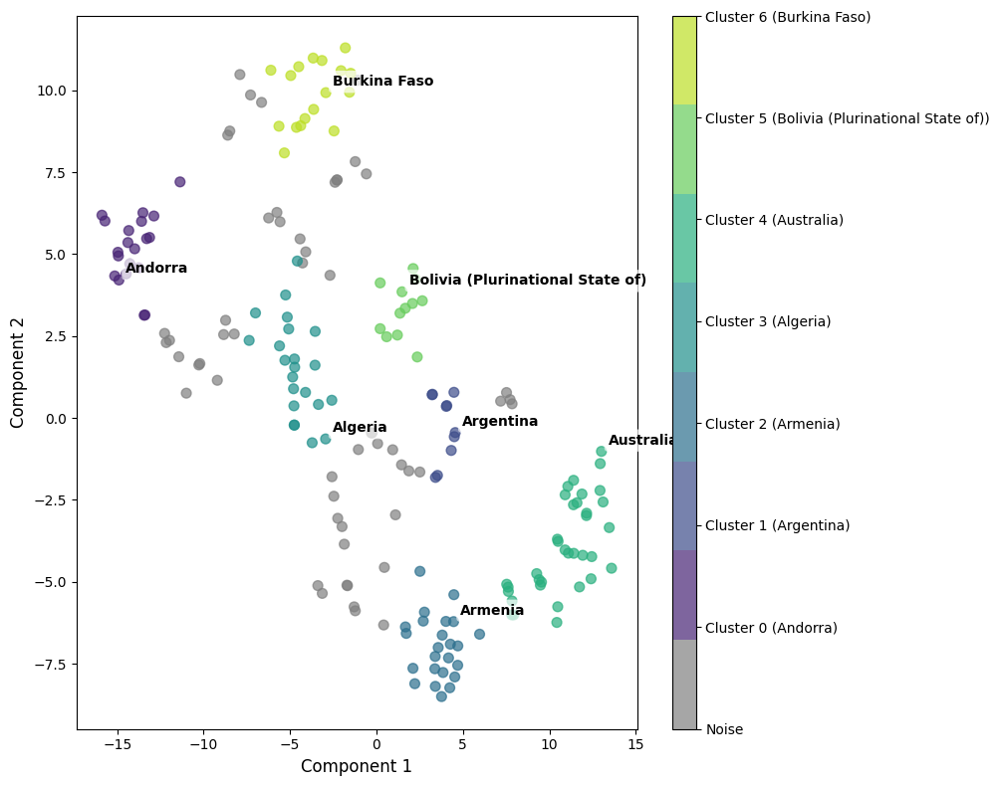

silhouette_score: 0.7274382710456848
davies_bouldin_score: 0.34112314094686463
-----------------------
Epsilon: 1.8571428571428572
Min Samples: 12
silhouette_score: 0.7274382710456848
davies_bouldin_score: 0.34112314094686463
Number of clusters:  6
Number of points in cluster 0: 19
['Andorra' 'Angola' 'Barbados' 'Bosnia and Herzegovina' 'Botswana'
 'Dominica' 'Equatorial Guinea' 'Grenada' 'Guinea-Bissau' 'Haiti'
 'Micronesia (Federated States of)' 'Monaco' 'Palau'
 'Saint Kitts and Nevis' 'Saint Lucia' 'Saint Vincent and the Grenadines'
 'San Marino' 'Sierra Leone' 'Somalia']

Number of points in cluster 1: 24
['Armenia' 'Austria' 'Belarus' 'Bulgaria' 'Croatia' 'Cyprus' 'Czechia'
 'Estonia' 'Finland' 'Germany' 'Greece' 'Italy'
 "Lao People's Democratic Republic" 'Lithuania' 'Luxembourg' 'Myanmar'
 'Netherlands (Kingdom of the)' 'Philippines' 'Poland' 'Portugal'
 'Republic of Korea' 'Slovakia' 'Slovenia' 'Sweden']

Number of points in cluster 2: 18
['Algeria' 'Bahamas' 'Belize' 'Benin' 

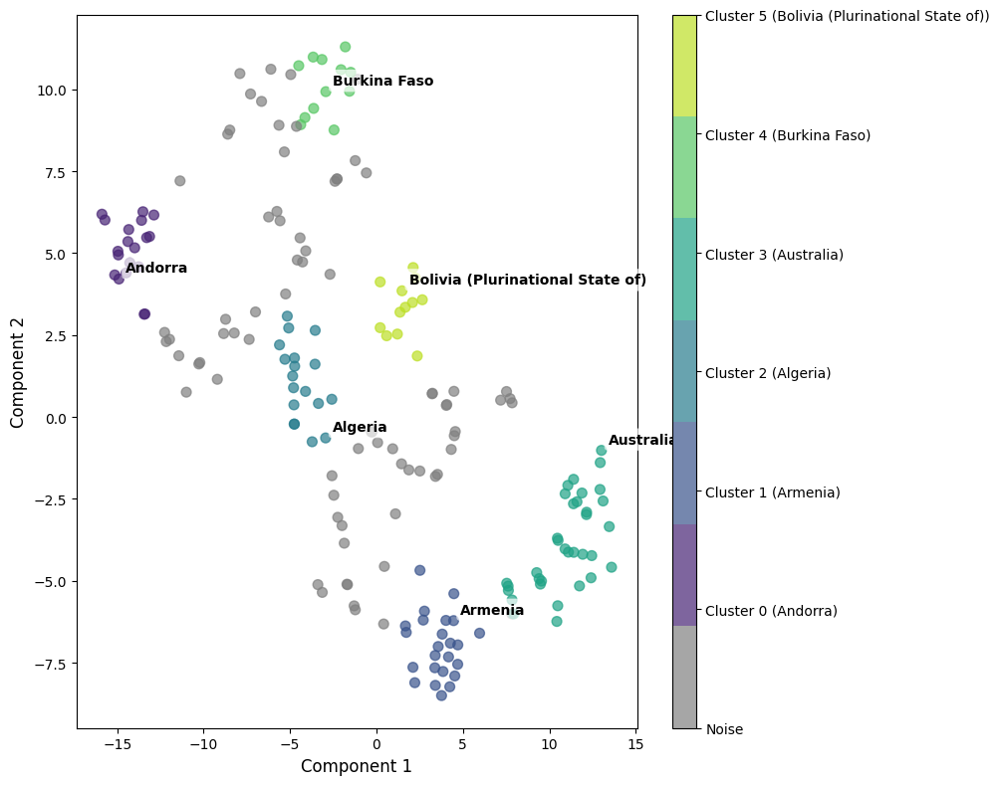

silhouette_score: 0.7908152937889099
davies_bouldin_score: 0.276743033925655
-----------------------
Epsilon: 1.8571428571428572
Min Samples: 14
silhouette_score: 0.7908152937889099
davies_bouldin_score: 0.276743033925655
Number of clusters:  4
Number of points in cluster 0: 19
['Andorra' 'Angola' 'Barbados' 'Bosnia and Herzegovina' 'Botswana'
 'Dominica' 'Equatorial Guinea' 'Grenada' 'Guinea-Bissau' 'Haiti'
 'Micronesia (Federated States of)' 'Monaco' 'Palau'
 'Saint Kitts and Nevis' 'Saint Lucia' 'Saint Vincent and the Grenadines'
 'San Marino' 'Sierra Leone' 'Somalia']

Number of points in cluster 1: 24
['Armenia' 'Austria' 'Belarus' 'Bulgaria' 'Croatia' 'Cyprus' 'Czechia'
 'Estonia' 'Finland' 'Germany' 'Greece' 'Italy'
 "Lao People's Democratic Republic" 'Lithuania' 'Luxembourg' 'Myanmar'
 'Netherlands (Kingdom of the)' 'Philippines' 'Poland' 'Portugal'
 'Republic of Korea' 'Slovakia' 'Slovenia' 'Sweden']

Number of points in cluster 2: 27
['Belgium' 'Brazil' 'Canada' 'Chile' 'Djib

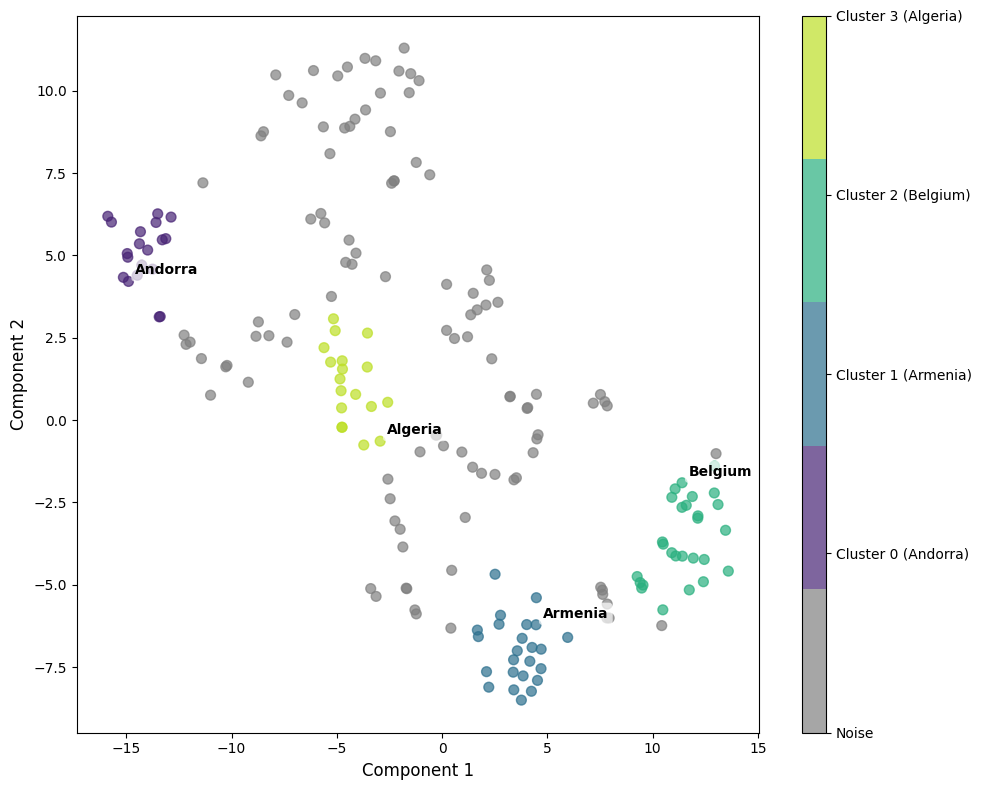

silhouette_score: 0.8125470876693726
davies_bouldin_score: 0.24528221223094704
-----------------------
Epsilon: 1.8571428571428572
Min Samples: 16
silhouette_score: 0.8125470876693726
davies_bouldin_score: 0.24528221223094704
Number of clusters:  3
Number of points in cluster 0: 19
['Andorra' 'Angola' 'Barbados' 'Bosnia and Herzegovina' 'Botswana'
 'Dominica' 'Equatorial Guinea' 'Grenada' 'Guinea-Bissau' 'Haiti'
 'Micronesia (Federated States of)' 'Monaco' 'Palau'
 'Saint Kitts and Nevis' 'Saint Lucia' 'Saint Vincent and the Grenadines'
 'San Marino' 'Sierra Leone' 'Somalia']

Number of points in cluster 1: 22
['Armenia' 'Austria' 'Belarus' 'Bulgaria' 'Cyprus' 'Czechia' 'Estonia'
 'Finland' 'Germany' 'Greece' 'Italy' 'Lithuania' 'Luxembourg' 'Myanmar'
 'Netherlands (Kingdom of the)' 'Philippines' 'Poland' 'Portugal'
 'Republic of Korea' 'Slovakia' 'Slovenia' 'Sweden']

Number of points in cluster 2: 26
['Belgium' 'Brazil' 'Canada' 'Chile' 'Djibouti' 'Egypt' 'France'
 'Iran (Islamic Rep

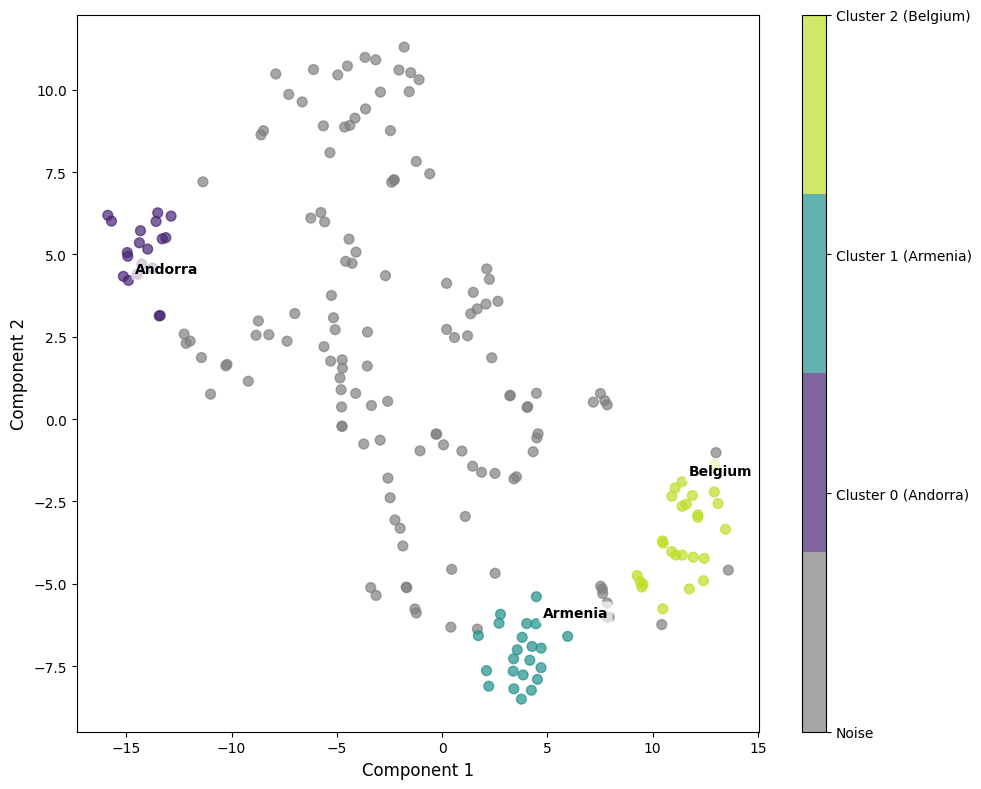

silhouette_score: 0.7680891156196594
davies_bouldin_score: 0.3160141875185631
-----------------------
Epsilon: 1.8571428571428572
Min Samples: 18
silhouette_score: 0.7680891156196594
davies_bouldin_score: 0.3160141875185631
Number of clusters:  2
Number of points in cluster 0: 22
['Armenia' 'Austria' 'Belarus' 'Bulgaria' 'Cyprus' 'Czechia' 'Estonia'
 'Finland' 'Germany' 'Greece' 'Italy' 'Lithuania' 'Luxembourg' 'Myanmar'
 'Netherlands (Kingdom of the)' 'Philippines' 'Poland' 'Portugal'
 'Republic of Korea' 'Slovakia' 'Slovenia' 'Sweden']

Number of points in cluster 1: 26
['Belgium' 'Brazil' 'Canada' 'Chile' 'Djibouti' 'Egypt' 'France'
 'Iran (Islamic Republic of)' 'Jordan' 'Latvia' 'Malaysia' 'Malta'
 'Mauritius' 'Mongolia' 'New Zealand' 'North Macedonia' 'Norway' 'Panama'
 'Peru' 'Romania' 'Singapore' 'Spain' 'Thailand' 'Türkiye'
 'United Kingdom of Great Britain and Northern Ireland' 'Uruguay']



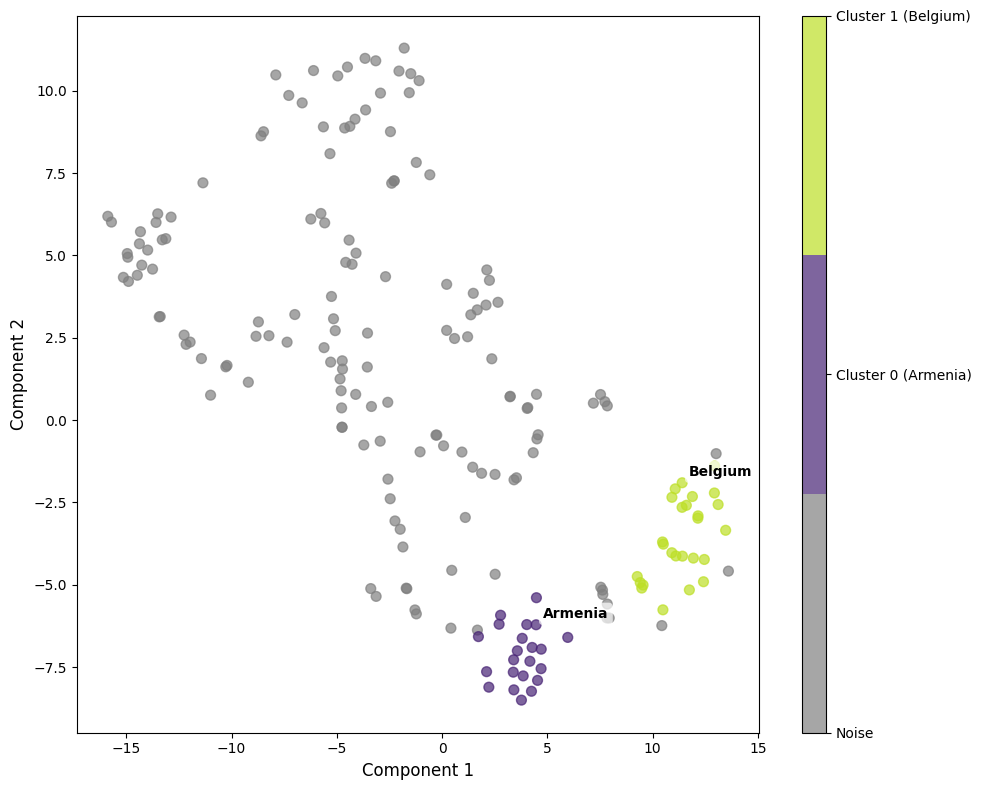

silhouette_score: -0.051347095519304276
davies_bouldin_score: 1.0636523586590203
-----------------------
Epsilon: 2.2857142857142856
Min Samples: 2
silhouette_score: -0.051347095519304276
davies_bouldin_score: 1.0636523586590203
Number of clusters:  2
Number of points in cluster 0: 191
['Afghanistan' 'Albania' 'Algeria' 'Andorra' 'Angola'
 'Antigua and Barbuda' 'Argentina' 'Armenia' 'Australia' 'Austria'
 'Azerbaijan' 'Bahamas' 'Bangladesh' 'Barbados' 'Belarus' 'Belgium'
 'Belize' 'Benin' 'Bhutan' 'Bolivia (Plurinational State of)'
 'Bosnia and Herzegovina' 'Botswana' 'Brazil' 'Brunei Darussalam'
 'Bulgaria' 'Burkina Faso' 'Burundi' 'Cabo Verde' 'Cameroon' 'Canada'
 'Central African Republic' 'Chad' 'Chile' 'China' 'Colombia' 'Comoros'
 'Congo' 'Cook Islands' 'Costa Rica' "Cote d'Ivoire" 'Croatia' 'Cuba'
 'Cyprus' 'Czechia' "Democratic People's Republic of Korea"
 'Democratic Republic of the Congo' 'Denmark' 'Djibouti' 'Dominica'
 'Dominican Republic' 'Ecuador' 'Egypt' 'El Salvador' 'E

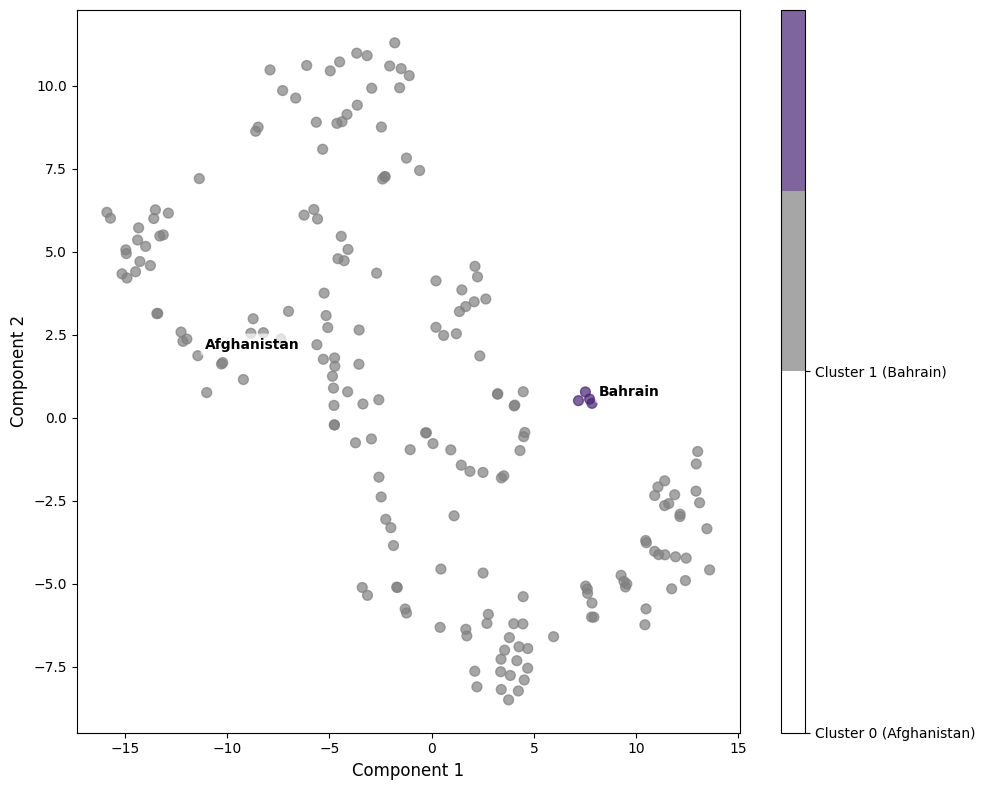

silhouette_score: -0.051347095519304276
davies_bouldin_score: 1.0636523586590203
-----------------------
Epsilon: 2.2857142857142856
Min Samples: 4
silhouette_score: -0.051347095519304276
davies_bouldin_score: 1.0636523586590203
Number of clusters:  2
Number of points in cluster 0: 191
['Afghanistan' 'Albania' 'Algeria' 'Andorra' 'Angola'
 'Antigua and Barbuda' 'Argentina' 'Armenia' 'Australia' 'Austria'
 'Azerbaijan' 'Bahamas' 'Bangladesh' 'Barbados' 'Belarus' 'Belgium'
 'Belize' 'Benin' 'Bhutan' 'Bolivia (Plurinational State of)'
 'Bosnia and Herzegovina' 'Botswana' 'Brazil' 'Brunei Darussalam'
 'Bulgaria' 'Burkina Faso' 'Burundi' 'Cabo Verde' 'Cameroon' 'Canada'
 'Central African Republic' 'Chad' 'Chile' 'China' 'Colombia' 'Comoros'
 'Congo' 'Cook Islands' 'Costa Rica' "Cote d'Ivoire" 'Croatia' 'Cuba'
 'Cyprus' 'Czechia' "Democratic People's Republic of Korea"
 'Democratic Republic of the Congo' 'Denmark' 'Djibouti' 'Dominica'
 'Dominican Republic' 'Ecuador' 'Egypt' 'El Salvador' 'E

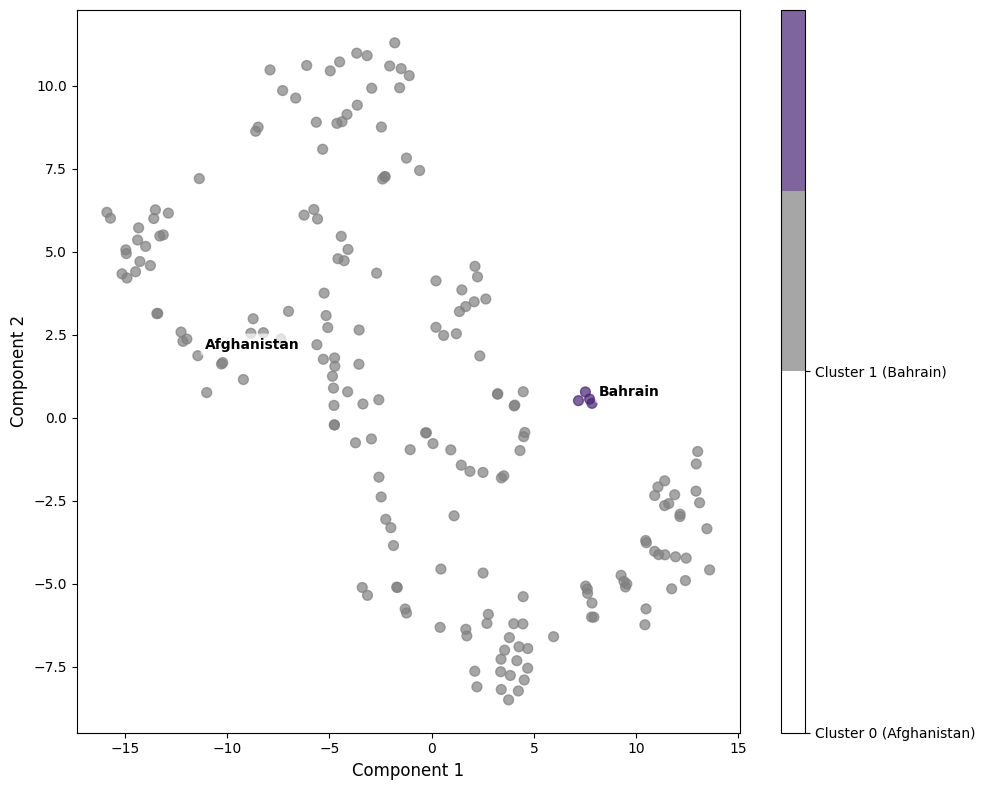

Score cannot be calculated, only one cluster found.
Score cannot be calculated, only one cluster found.
-----------------------
Epsilon: 2.2857142857142856
Min Samples: 6
Score cannot be calculated, only one cluster found.
Score cannot be calculated, only one cluster found.
Number of clusters:  1
Number of points in cluster 0: 191
['Afghanistan' 'Albania' 'Algeria' 'Andorra' 'Angola'
 'Antigua and Barbuda' 'Argentina' 'Armenia' 'Australia' 'Austria'
 'Azerbaijan' 'Bahamas' 'Bangladesh' 'Barbados' 'Belarus' 'Belgium'
 'Belize' 'Benin' 'Bhutan' 'Bolivia (Plurinational State of)'
 'Bosnia and Herzegovina' 'Botswana' 'Brazil' 'Brunei Darussalam'
 'Bulgaria' 'Burkina Faso' 'Burundi' 'Cabo Verde' 'Cameroon' 'Canada'
 'Central African Republic' 'Chad' 'Chile' 'China' 'Colombia' 'Comoros'
 'Congo' 'Cook Islands' 'Costa Rica' "Cote d'Ivoire" 'Croatia' 'Cuba'
 'Cyprus' 'Czechia' "Democratic People's Republic of Korea"
 'Democratic Republic of the Congo' 'Denmark' 'Djibouti' 'Dominica'
 'Dominica

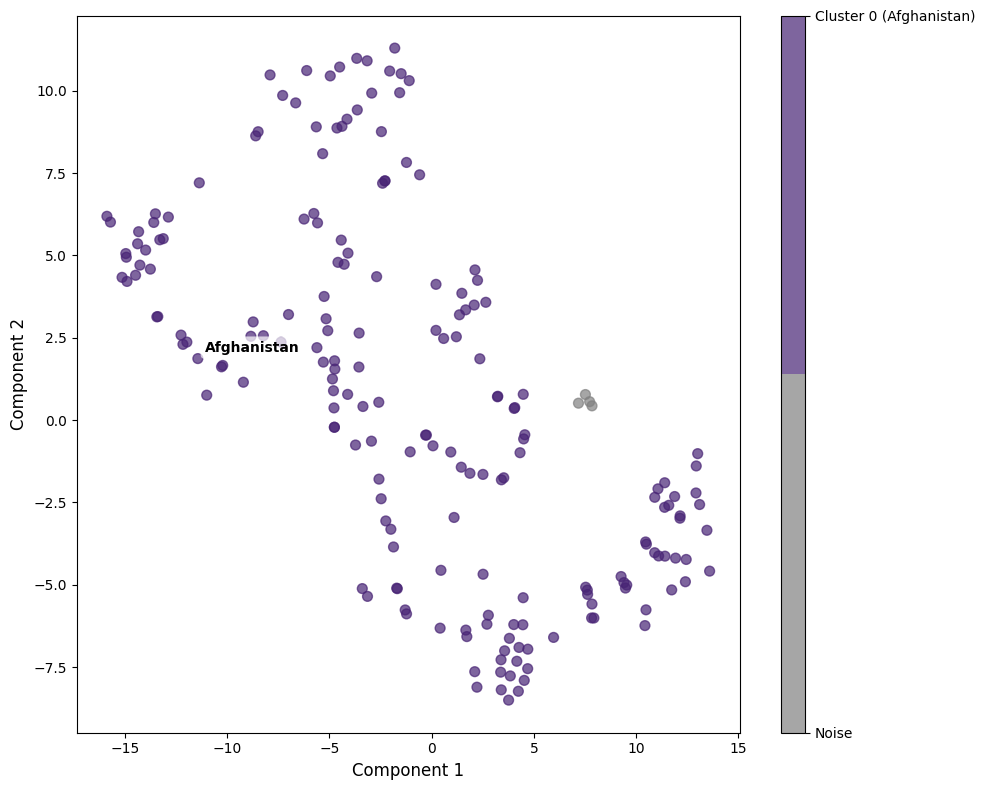

Score cannot be calculated, only one cluster found.
Score cannot be calculated, only one cluster found.
-----------------------
Epsilon: 2.2857142857142856
Min Samples: 8
Score cannot be calculated, only one cluster found.
Score cannot be calculated, only one cluster found.
Number of clusters:  1
Number of points in cluster 0: 191
['Afghanistan' 'Albania' 'Algeria' 'Andorra' 'Angola'
 'Antigua and Barbuda' 'Argentina' 'Armenia' 'Australia' 'Austria'
 'Azerbaijan' 'Bahamas' 'Bangladesh' 'Barbados' 'Belarus' 'Belgium'
 'Belize' 'Benin' 'Bhutan' 'Bolivia (Plurinational State of)'
 'Bosnia and Herzegovina' 'Botswana' 'Brazil' 'Brunei Darussalam'
 'Bulgaria' 'Burkina Faso' 'Burundi' 'Cabo Verde' 'Cameroon' 'Canada'
 'Central African Republic' 'Chad' 'Chile' 'China' 'Colombia' 'Comoros'
 'Congo' 'Cook Islands' 'Costa Rica' "Cote d'Ivoire" 'Croatia' 'Cuba'
 'Cyprus' 'Czechia' "Democratic People's Republic of Korea"
 'Democratic Republic of the Congo' 'Denmark' 'Djibouti' 'Dominica'
 'Dominica

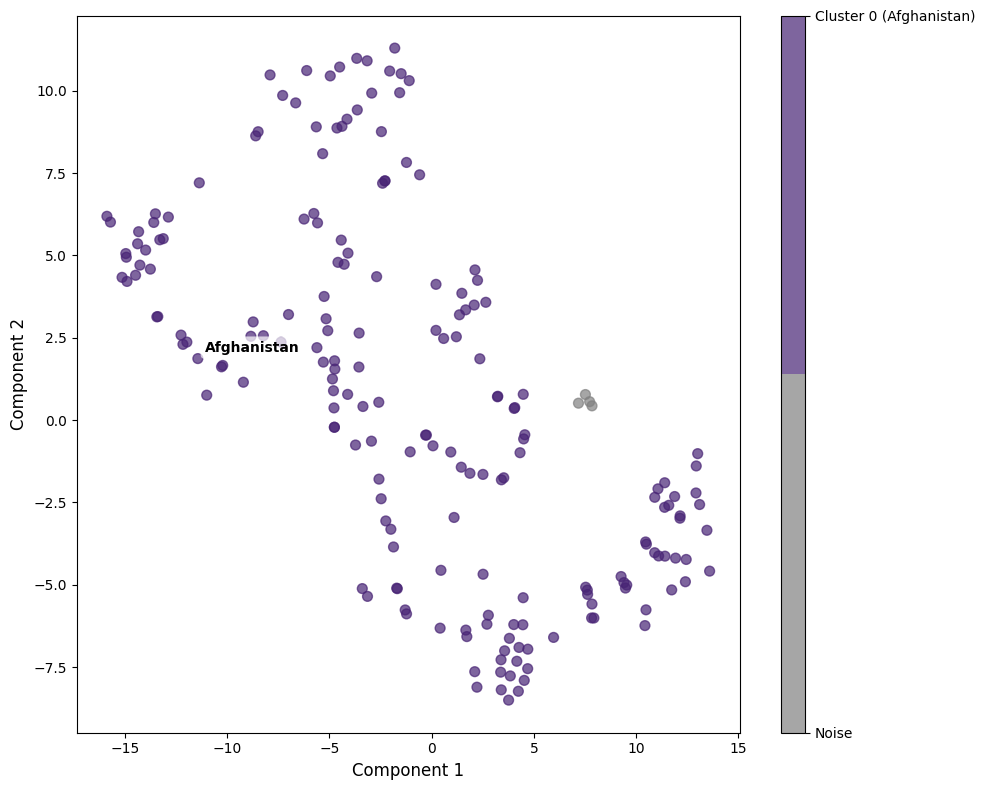

silhouette_score: 0.3991106450557709
davies_bouldin_score: 0.6572356708175213
-----------------------
Epsilon: 2.2857142857142856
Min Samples: 10
silhouette_score: 0.3991106450557709
davies_bouldin_score: 0.6572356708175213
Number of clusters:  7
Number of points in cluster 0: 35
['Algeria' 'Bahamas' 'Belize' 'Benin' 'Cameroon'
 'Central African Republic' 'Chad' 'China' 'Comoros' "Cote d'Ivoire"
 'Cuba' "Democratic People's Republic of Korea" 'Dominican Republic'
 'Fiji' 'Gabon' 'Guatemala' 'Israel' 'Jamaica' 'Japan' 'Marshall Islands'
 'Morocco' 'Mozambique' 'Nicaragua' 'Nigeria' 'Rwanda'
 'Sao Tome and Principe' 'Tajikistan' 'Timor-Leste' 'Tonga' 'Tunisia'
 'Uganda' 'United States of America' 'Uzbekistan' 'Zambia' 'Zimbabwe']

Number of points in cluster 1: 23
['Andorra' 'Angola' 'Antigua and Barbuda' 'Barbados'
 'Bosnia and Herzegovina' 'Botswana' 'Dominica' 'Equatorial Guinea'
 'Grenada' 'Guinea-Bissau' 'Haiti' 'Liberia' 'Mauritania'
 'Micronesia (Federated States of)' 'Monaco' 'Ni

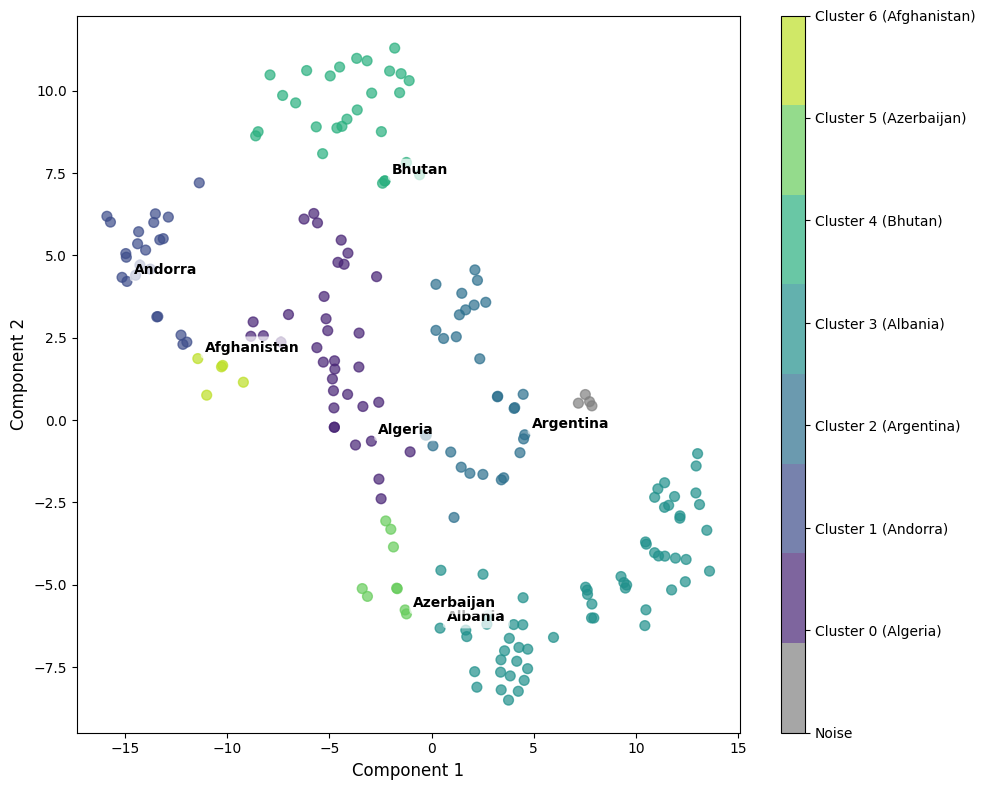

silhouette_score: 0.6417958736419678
davies_bouldin_score: 0.47903544235832357
-----------------------
Epsilon: 2.2857142857142856
Min Samples: 12
silhouette_score: 0.6417958736419678
davies_bouldin_score: 0.47903544235832357
Number of clusters:  6
Number of points in cluster 0: 19
['Andorra' 'Angola' 'Barbados' 'Bosnia and Herzegovina' 'Botswana'
 'Dominica' 'Equatorial Guinea' 'Grenada' 'Guinea-Bissau' 'Haiti'
 'Micronesia (Federated States of)' 'Monaco' 'Palau'
 'Saint Kitts and Nevis' 'Saint Lucia' 'Saint Vincent and the Grenadines'
 'San Marino' 'Sierra Leone' 'Somalia']

Number of points in cluster 1: 32
['Albania' 'Armenia' 'Austria' 'Belarus' 'Bulgaria' 'Croatia' 'Cyprus'
 'Czechia' 'Estonia' 'Finland' 'Germany' 'Greece' 'Hungary' 'Iceland'
 'Italy' 'Kazakhstan' 'Kuwait' "Lao People's Democratic Republic"
 'Lithuania' 'Luxembourg' 'Maldives' 'Myanmar'
 'Netherlands (Kingdom of the)' 'Philippines' 'Poland' 'Portugal' 'Qatar'
 'Republic of Korea' 'Slovakia' 'Slovenia' 'Sweden' 'V

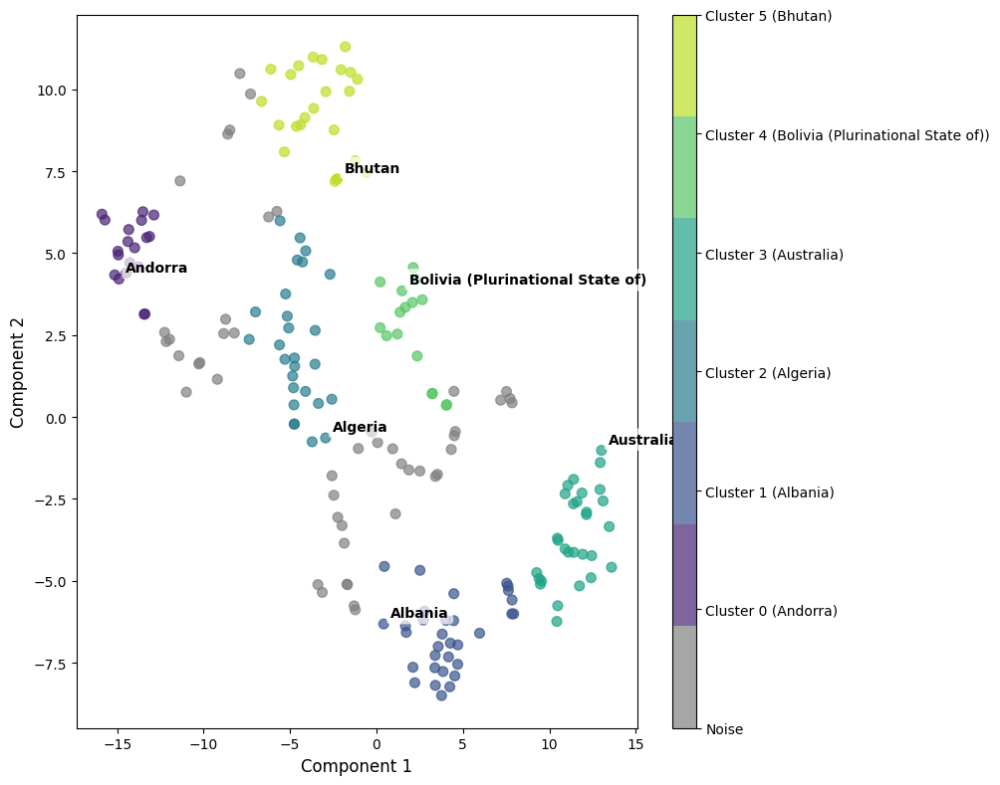

silhouette_score: 0.6612861156463623
davies_bouldin_score: 0.45636244481130445
-----------------------
Epsilon: 2.2857142857142856
Min Samples: 14
silhouette_score: 0.6612861156463623
davies_bouldin_score: 0.45636244481130445
Number of clusters:  5
Number of points in cluster 0: 19
['Andorra' 'Angola' 'Barbados' 'Bosnia and Herzegovina' 'Botswana'
 'Dominica' 'Equatorial Guinea' 'Grenada' 'Guinea-Bissau' 'Haiti'
 'Micronesia (Federated States of)' 'Monaco' 'Palau'
 'Saint Kitts and Nevis' 'Saint Lucia' 'Saint Vincent and the Grenadines'
 'San Marino' 'Sierra Leone' 'Somalia']

Number of points in cluster 1: 31
['Albania' 'Armenia' 'Austria' 'Belarus' 'Bulgaria' 'Croatia' 'Cyprus'
 'Czechia' 'Estonia' 'Finland' 'Germany' 'Greece' 'Hungary' 'Iceland'
 'Italy' 'Kazakhstan' 'Kuwait' "Lao People's Democratic Republic"
 'Lithuania' 'Luxembourg' 'Myanmar' 'Netherlands (Kingdom of the)'
 'Philippines' 'Poland' 'Portugal' 'Qatar' 'Republic of Korea' 'Slovakia'
 'Slovenia' 'Sweden' 'Viet Nam']



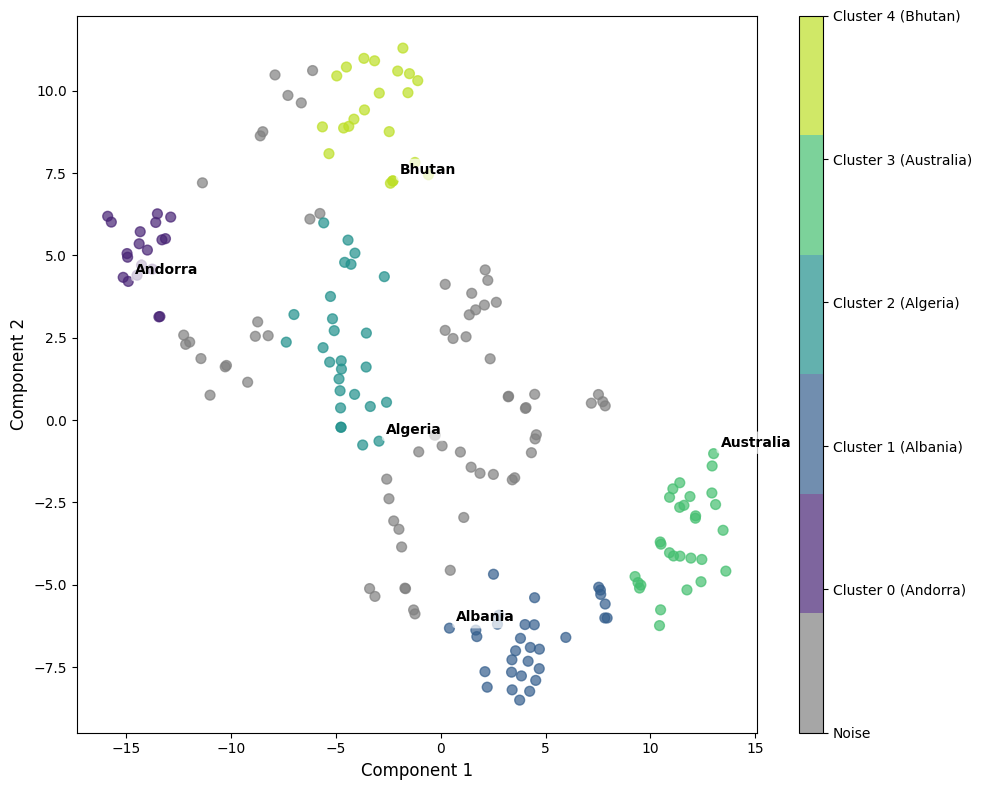

silhouette_score: 0.6991232633590698
davies_bouldin_score: 0.3926598170096874
-----------------------
Epsilon: 2.2857142857142856
Min Samples: 16
silhouette_score: 0.6991232633590698
davies_bouldin_score: 0.3926598170096874
Number of clusters:  5
Number of points in cluster 0: 19
['Andorra' 'Angola' 'Barbados' 'Bosnia and Herzegovina' 'Botswana'
 'Dominica' 'Equatorial Guinea' 'Grenada' 'Guinea-Bissau' 'Haiti'
 'Micronesia (Federated States of)' 'Monaco' 'Palau'
 'Saint Kitts and Nevis' 'Saint Lucia' 'Saint Vincent and the Grenadines'
 'San Marino' 'Sierra Leone' 'Somalia']

Number of points in cluster 1: 31
['Albania' 'Armenia' 'Austria' 'Belarus' 'Bulgaria' 'Croatia' 'Cyprus'
 'Czechia' 'Estonia' 'Finland' 'Germany' 'Greece' 'Hungary' 'Iceland'
 'Italy' 'Kazakhstan' 'Kuwait' "Lao People's Democratic Republic"
 'Lithuania' 'Luxembourg' 'Myanmar' 'Netherlands (Kingdom of the)'
 'Philippines' 'Poland' 'Portugal' 'Qatar' 'Republic of Korea' 'Slovakia'
 'Slovenia' 'Sweden' 'Viet Nam']

Nu

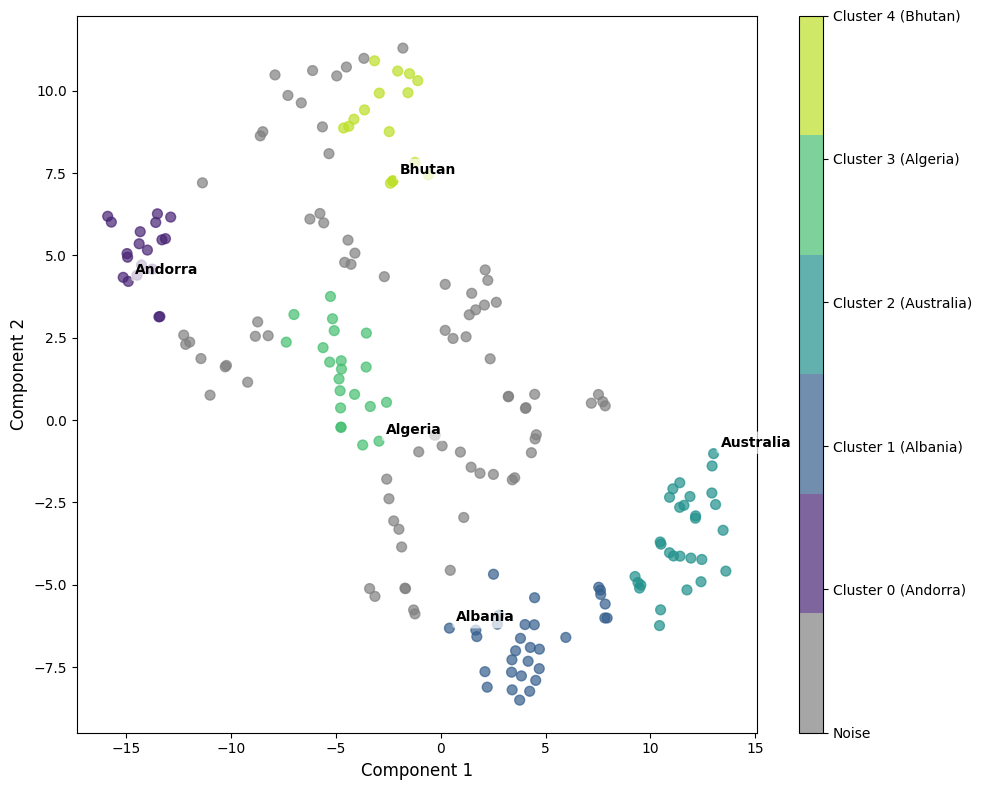

silhouette_score: 0.7289091944694519
davies_bouldin_score: 0.3201138778113404
-----------------------
Epsilon: 2.2857142857142856
Min Samples: 18
silhouette_score: 0.7289091944694519
davies_bouldin_score: 0.3201138778113404
Number of clusters:  3
Number of points in cluster 0: 24
['Armenia' 'Austria' 'Belarus' 'Bulgaria' 'Croatia' 'Cyprus' 'Czechia'
 'Estonia' 'Finland' 'Germany' 'Greece' 'Italy'
 "Lao People's Democratic Republic" 'Lithuania' 'Luxembourg' 'Myanmar'
 'Netherlands (Kingdom of the)' 'Philippines' 'Poland' 'Portugal'
 'Republic of Korea' 'Slovakia' 'Slovenia' 'Sweden']

Number of points in cluster 1: 19
['Andorra' 'Angola' 'Barbados' 'Bosnia and Herzegovina' 'Botswana'
 'Dominica' 'Equatorial Guinea' 'Grenada' 'Guinea-Bissau' 'Haiti'
 'Micronesia (Federated States of)' 'Monaco' 'Palau'
 'Saint Kitts and Nevis' 'Saint Lucia' 'Saint Vincent and the Grenadines'
 'San Marino' 'Sierra Leone' 'Somalia']

Number of points in cluster 2: 35
['Australia' 'Belgium' 'Brazil' 'Canada'

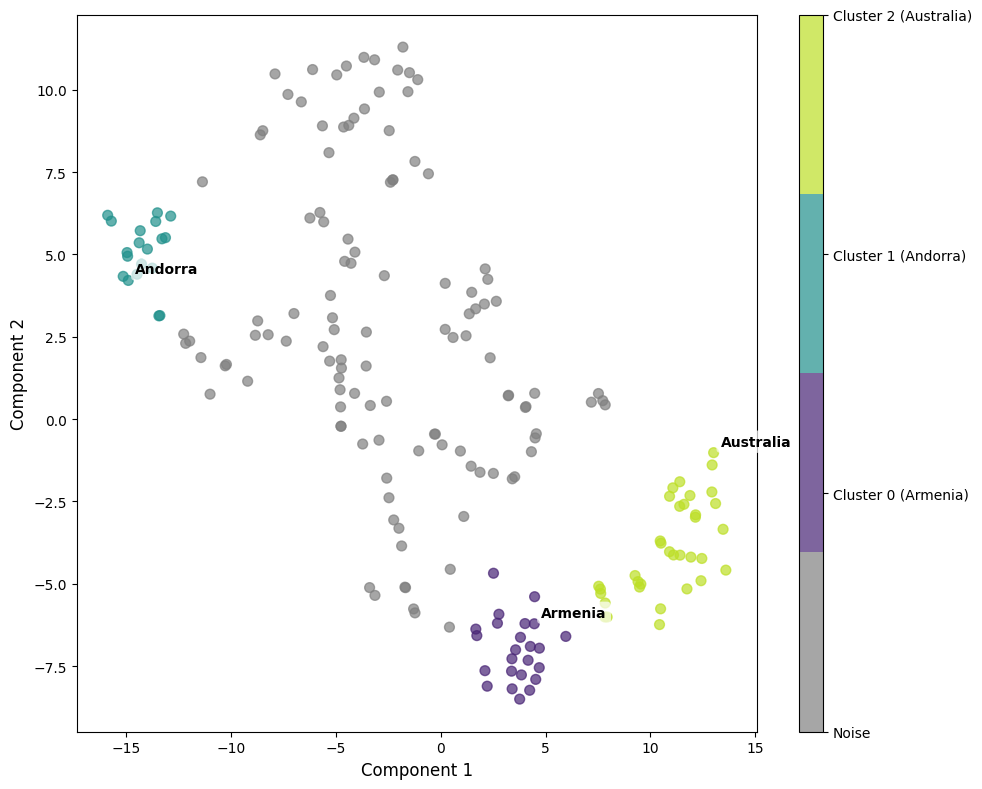

silhouette_score: -0.051347095519304276
davies_bouldin_score: 1.0636523586590203
-----------------------
Epsilon: 2.7142857142857144
Min Samples: 2
silhouette_score: -0.051347095519304276
davies_bouldin_score: 1.0636523586590203
Number of clusters:  2
Number of points in cluster 0: 191
['Afghanistan' 'Albania' 'Algeria' 'Andorra' 'Angola'
 'Antigua and Barbuda' 'Argentina' 'Armenia' 'Australia' 'Austria'
 'Azerbaijan' 'Bahamas' 'Bangladesh' 'Barbados' 'Belarus' 'Belgium'
 'Belize' 'Benin' 'Bhutan' 'Bolivia (Plurinational State of)'
 'Bosnia and Herzegovina' 'Botswana' 'Brazil' 'Brunei Darussalam'
 'Bulgaria' 'Burkina Faso' 'Burundi' 'Cabo Verde' 'Cameroon' 'Canada'
 'Central African Republic' 'Chad' 'Chile' 'China' 'Colombia' 'Comoros'
 'Congo' 'Cook Islands' 'Costa Rica' "Cote d'Ivoire" 'Croatia' 'Cuba'
 'Cyprus' 'Czechia' "Democratic People's Republic of Korea"
 'Democratic Republic of the Congo' 'Denmark' 'Djibouti' 'Dominica'
 'Dominican Republic' 'Ecuador' 'Egypt' 'El Salvador' 'E

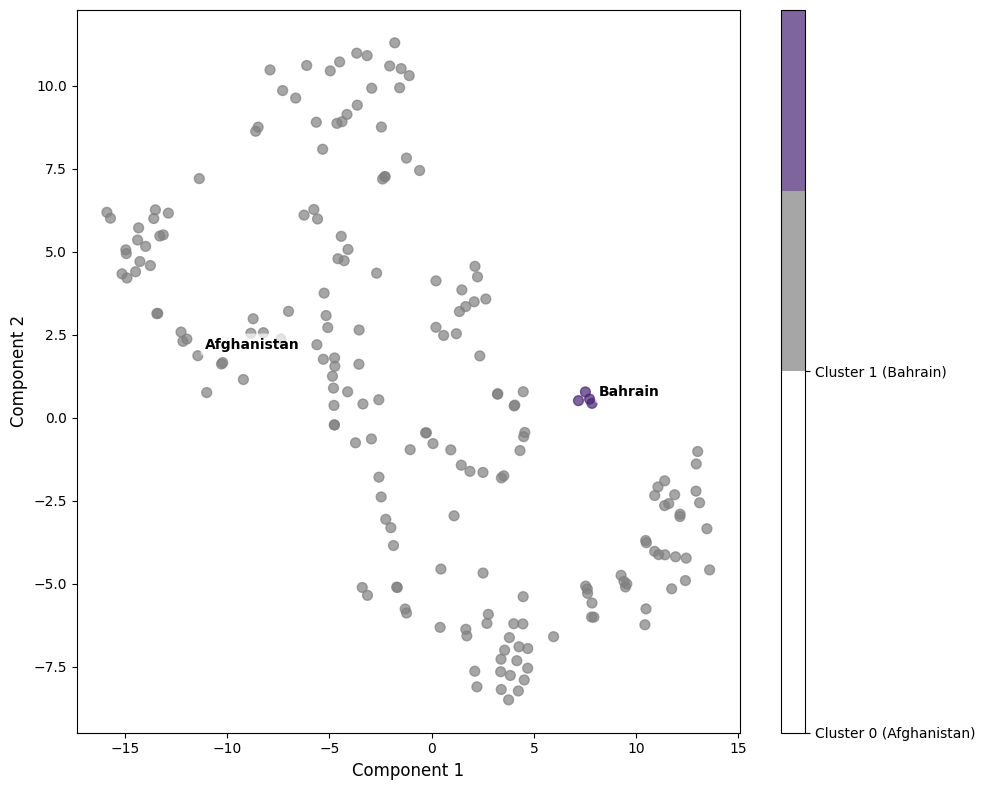

silhouette_score: -0.051347095519304276
davies_bouldin_score: 1.0636523586590203
-----------------------
Epsilon: 2.7142857142857144
Min Samples: 4
silhouette_score: -0.051347095519304276
davies_bouldin_score: 1.0636523586590203
Number of clusters:  2
Number of points in cluster 0: 191
['Afghanistan' 'Albania' 'Algeria' 'Andorra' 'Angola'
 'Antigua and Barbuda' 'Argentina' 'Armenia' 'Australia' 'Austria'
 'Azerbaijan' 'Bahamas' 'Bangladesh' 'Barbados' 'Belarus' 'Belgium'
 'Belize' 'Benin' 'Bhutan' 'Bolivia (Plurinational State of)'
 'Bosnia and Herzegovina' 'Botswana' 'Brazil' 'Brunei Darussalam'
 'Bulgaria' 'Burkina Faso' 'Burundi' 'Cabo Verde' 'Cameroon' 'Canada'
 'Central African Republic' 'Chad' 'Chile' 'China' 'Colombia' 'Comoros'
 'Congo' 'Cook Islands' 'Costa Rica' "Cote d'Ivoire" 'Croatia' 'Cuba'
 'Cyprus' 'Czechia' "Democratic People's Republic of Korea"
 'Democratic Republic of the Congo' 'Denmark' 'Djibouti' 'Dominica'
 'Dominican Republic' 'Ecuador' 'Egypt' 'El Salvador' 'E

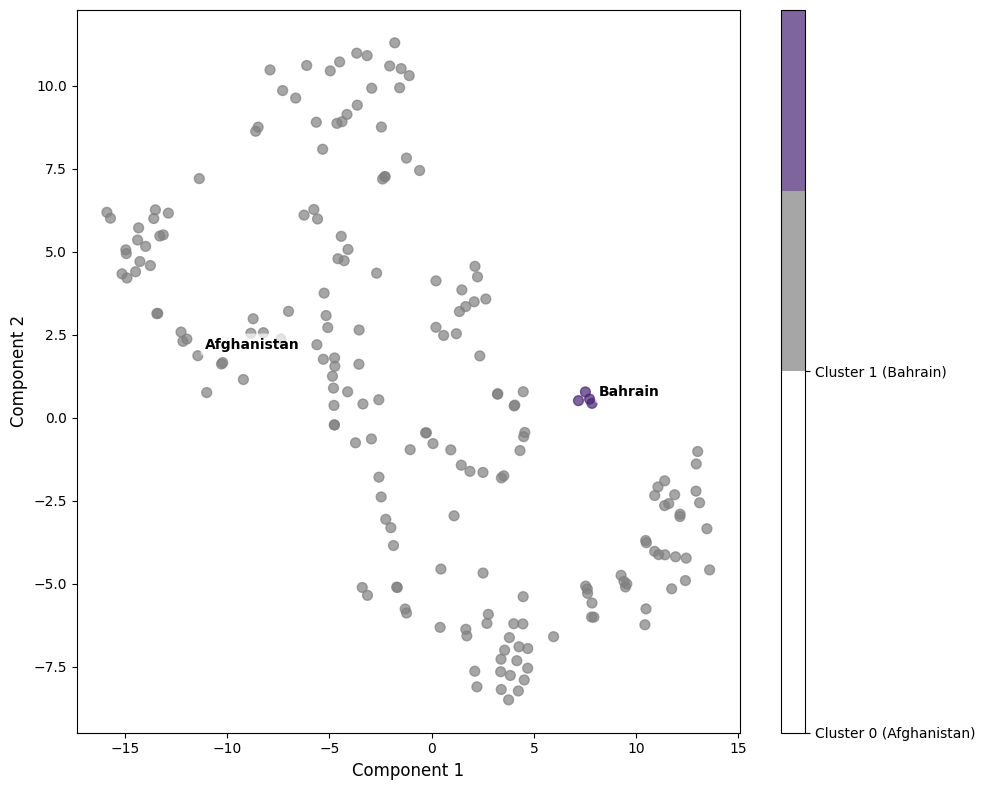

Score cannot be calculated, only one cluster found.
Score cannot be calculated, only one cluster found.
-----------------------
Epsilon: 2.7142857142857144
Min Samples: 6
Score cannot be calculated, only one cluster found.
Score cannot be calculated, only one cluster found.
Number of clusters:  1
Number of points in cluster 0: 191
['Afghanistan' 'Albania' 'Algeria' 'Andorra' 'Angola'
 'Antigua and Barbuda' 'Argentina' 'Armenia' 'Australia' 'Austria'
 'Azerbaijan' 'Bahamas' 'Bangladesh' 'Barbados' 'Belarus' 'Belgium'
 'Belize' 'Benin' 'Bhutan' 'Bolivia (Plurinational State of)'
 'Bosnia and Herzegovina' 'Botswana' 'Brazil' 'Brunei Darussalam'
 'Bulgaria' 'Burkina Faso' 'Burundi' 'Cabo Verde' 'Cameroon' 'Canada'
 'Central African Republic' 'Chad' 'Chile' 'China' 'Colombia' 'Comoros'
 'Congo' 'Cook Islands' 'Costa Rica' "Cote d'Ivoire" 'Croatia' 'Cuba'
 'Cyprus' 'Czechia' "Democratic People's Republic of Korea"
 'Democratic Republic of the Congo' 'Denmark' 'Djibouti' 'Dominica'
 'Dominica

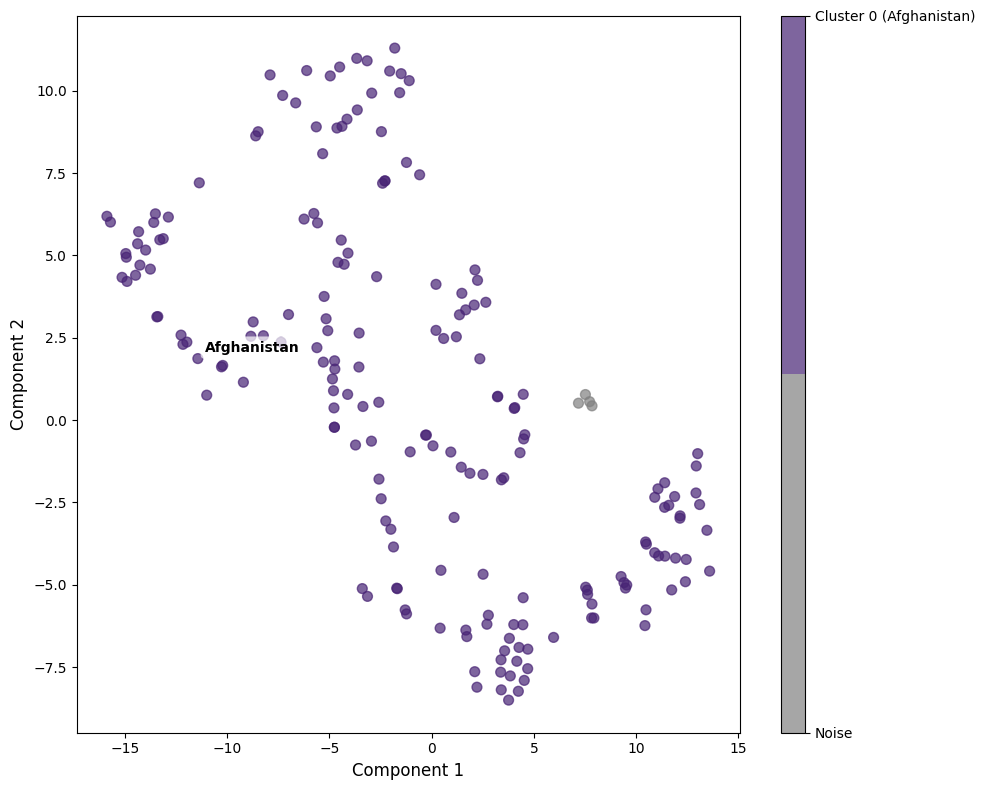

Score cannot be calculated, only one cluster found.
Score cannot be calculated, only one cluster found.
-----------------------
Epsilon: 2.7142857142857144
Min Samples: 8
Score cannot be calculated, only one cluster found.
Score cannot be calculated, only one cluster found.
Number of clusters:  1
Number of points in cluster 0: 191
['Afghanistan' 'Albania' 'Algeria' 'Andorra' 'Angola'
 'Antigua and Barbuda' 'Argentina' 'Armenia' 'Australia' 'Austria'
 'Azerbaijan' 'Bahamas' 'Bangladesh' 'Barbados' 'Belarus' 'Belgium'
 'Belize' 'Benin' 'Bhutan' 'Bolivia (Plurinational State of)'
 'Bosnia and Herzegovina' 'Botswana' 'Brazil' 'Brunei Darussalam'
 'Bulgaria' 'Burkina Faso' 'Burundi' 'Cabo Verde' 'Cameroon' 'Canada'
 'Central African Republic' 'Chad' 'Chile' 'China' 'Colombia' 'Comoros'
 'Congo' 'Cook Islands' 'Costa Rica' "Cote d'Ivoire" 'Croatia' 'Cuba'
 'Cyprus' 'Czechia' "Democratic People's Republic of Korea"
 'Democratic Republic of the Congo' 'Denmark' 'Djibouti' 'Dominica'
 'Dominica

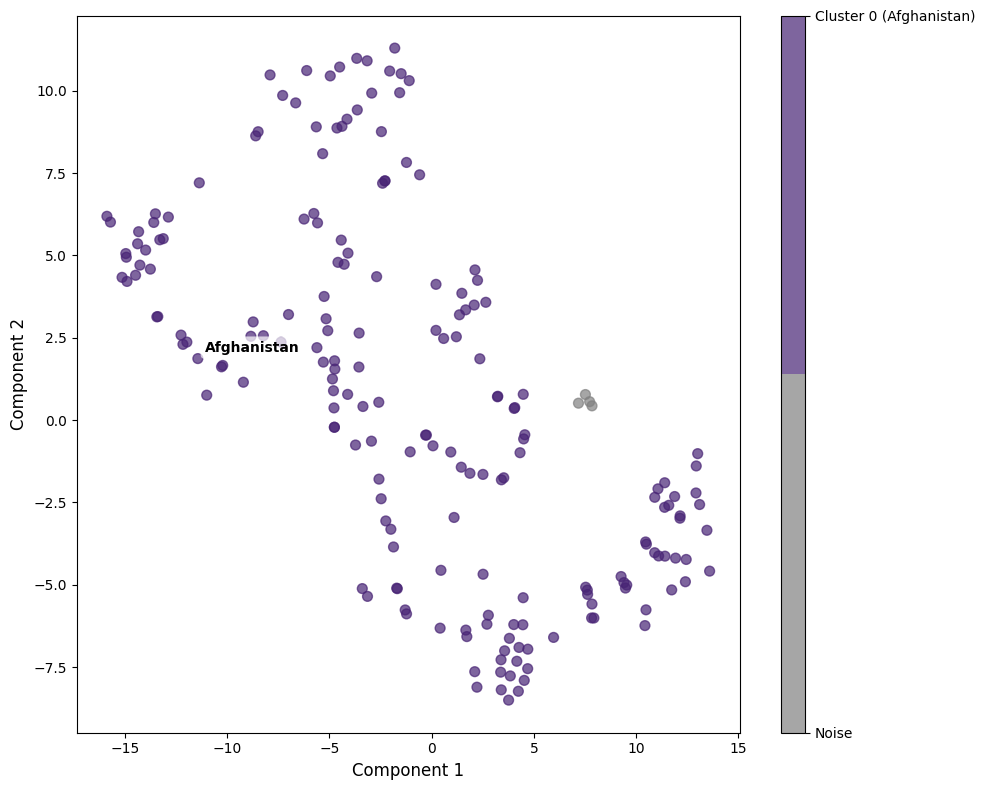

silhouette_score: 0.35846590995788574
davies_bouldin_score: 0.673969138658531
-----------------------
Epsilon: 2.7142857142857144
Min Samples: 10
silhouette_score: 0.35846590995788574
davies_bouldin_score: 0.673969138658531
Number of clusters:  2
Number of points in cluster 0: 31
['Afghanistan' 'Andorra' 'Angola' 'Antigua and Barbuda' 'Barbados'
 'Bosnia and Herzegovina' 'Botswana' 'Comoros' 'Congo' 'Dominica'
 'Equatorial Guinea' 'Eswatini' 'Ethiopia' 'Grenada' 'Guinea-Bissau'
 'Haiti' 'Liberia' 'Mauritania' 'Micronesia (Federated States of)'
 'Monaco' 'Niue' 'Palau' 'Rwanda' 'Saint Kitts and Nevis' 'Saint Lucia'
 'Saint Vincent and the Grenadines' 'San Marino' 'Sao Tome and Principe'
 'Sierra Leone' 'Somalia' 'Suriname']

Number of points in cluster 1: 160
['Albania' 'Algeria' 'Argentina' 'Armenia' 'Australia' 'Austria'
 'Azerbaijan' 'Bahamas' 'Bangladesh' 'Belarus' 'Belgium' 'Belize' 'Benin'
 'Bhutan' 'Bolivia (Plurinational State of)' 'Brazil' 'Brunei Darussalam'
 'Bulgaria' 'Burki

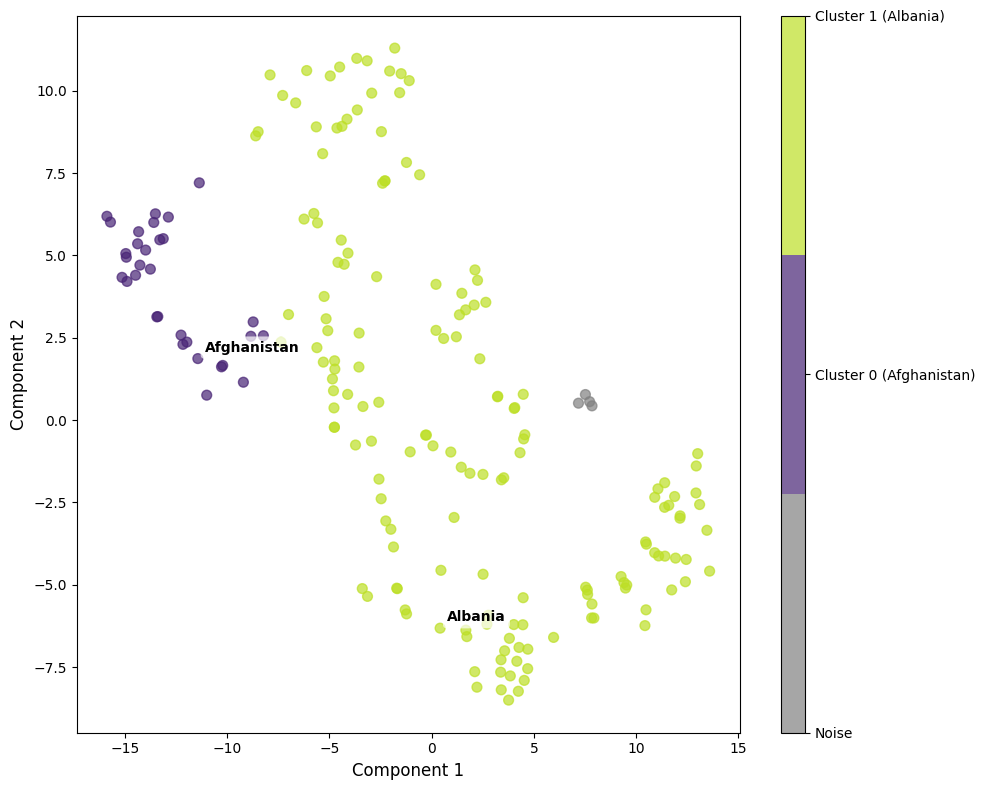

silhouette_score: 0.19620996713638306
davies_bouldin_score: 1.4882967980876747
-----------------------
Epsilon: 2.7142857142857144
Min Samples: 12
silhouette_score: 0.19620996713638306
davies_bouldin_score: 1.4882967980876747
Number of clusters:  4
Number of points in cluster 0: 112
['Albania' 'Algeria' 'Armenia' 'Australia' 'Austria' 'Azerbaijan'
 'Bahamas' 'Bangladesh' 'Belarus' 'Belgium' 'Belize' 'Benin' 'Brazil'
 'Bulgaria' 'Cabo Verde' 'Cameroon' 'Canada' 'Central African Republic'
 'Chad' 'Chile' 'China' 'Colombia' 'Comoros' 'Congo' 'Cook Islands'
 "Cote d'Ivoire" 'Croatia' 'Cuba' 'Cyprus' 'Czechia'
 "Democratic People's Republic of Korea" 'Djibouti' 'Dominican Republic'
 'Egypt' 'Estonia' 'Fiji' 'Finland' 'France' 'Gabon' 'Georgia' 'Germany'
 'Ghana' 'Greece' 'Guatemala' 'Guinea' 'Guyana' 'Hungary' 'Iceland'
 'Iran (Islamic Republic of)' 'Israel' 'Italy' 'Jamaica' 'Japan' 'Jordan'
 'Kazakhstan' 'Kuwait' 'Kyrgyzstan' "Lao People's Democratic Republic"
 'Latvia' 'Lebanon' 'Libya' 

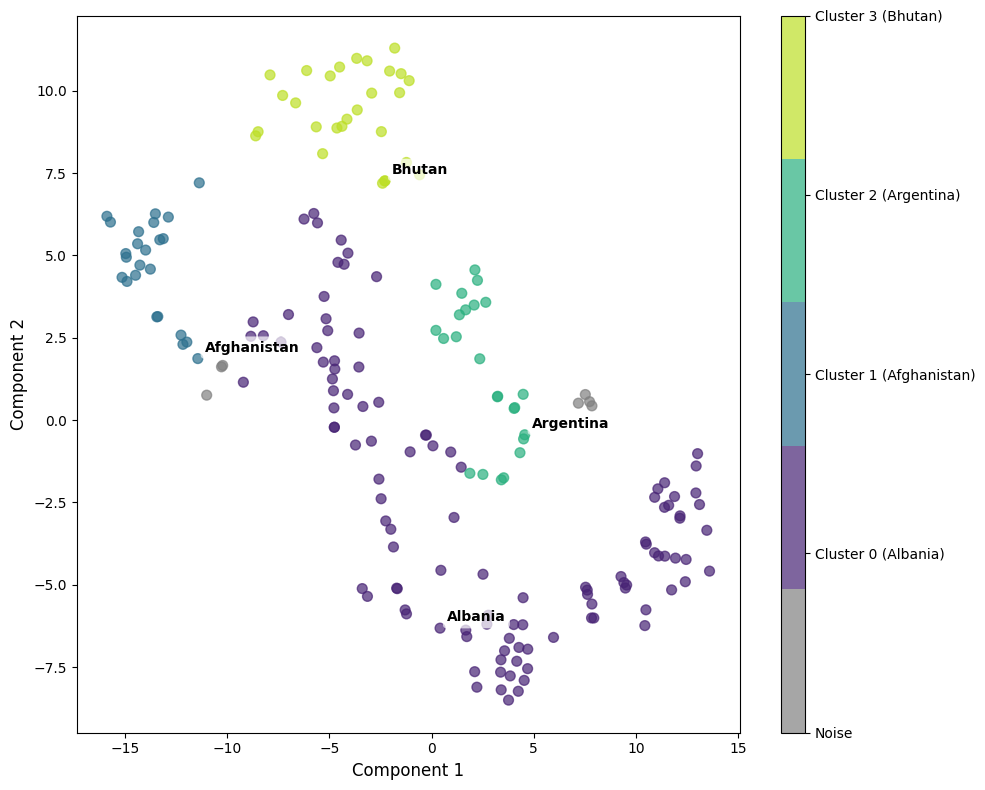

silhouette_score: 0.5426231026649475
davies_bouldin_score: 0.6328094708572557
-----------------------
Epsilon: 2.7142857142857144
Min Samples: 14
silhouette_score: 0.5426231026649475
davies_bouldin_score: 0.6328094708572557
Number of clusters:  6
Number of points in cluster 0: 41
['Algeria' 'Bahamas' 'Bangladesh' 'Belize' 'Benin' 'Cameroon'
 'Central African Republic' 'Chad' 'China' 'Comoros' "Cote d'Ivoire"
 'Cuba' "Democratic People's Republic of Korea" 'Dominican Republic'
 'Fiji' 'Gabon' 'Georgia' 'Guatemala' 'Guinea' 'Guyana' 'Israel' 'Jamaica'
 'Japan' 'Lebanon' 'Marshall Islands' 'Morocco' 'Mozambique' 'Nicaragua'
 'Nigeria' 'Paraguay' 'Republic of Moldova' 'South Africa' 'Tajikistan'
 'Timor-Leste' 'Tonga' 'Tunisia' 'Uganda' 'United States of America'
 'Uzbekistan' 'Zambia' 'Zimbabwe']

Number of points in cluster 1: 24
['Afghanistan' 'Andorra' 'Angola' 'Antigua and Barbuda' 'Barbados'
 'Bosnia and Herzegovina' 'Botswana' 'Dominica' 'Equatorial Guinea'
 'Grenada' 'Guinea-Bissau

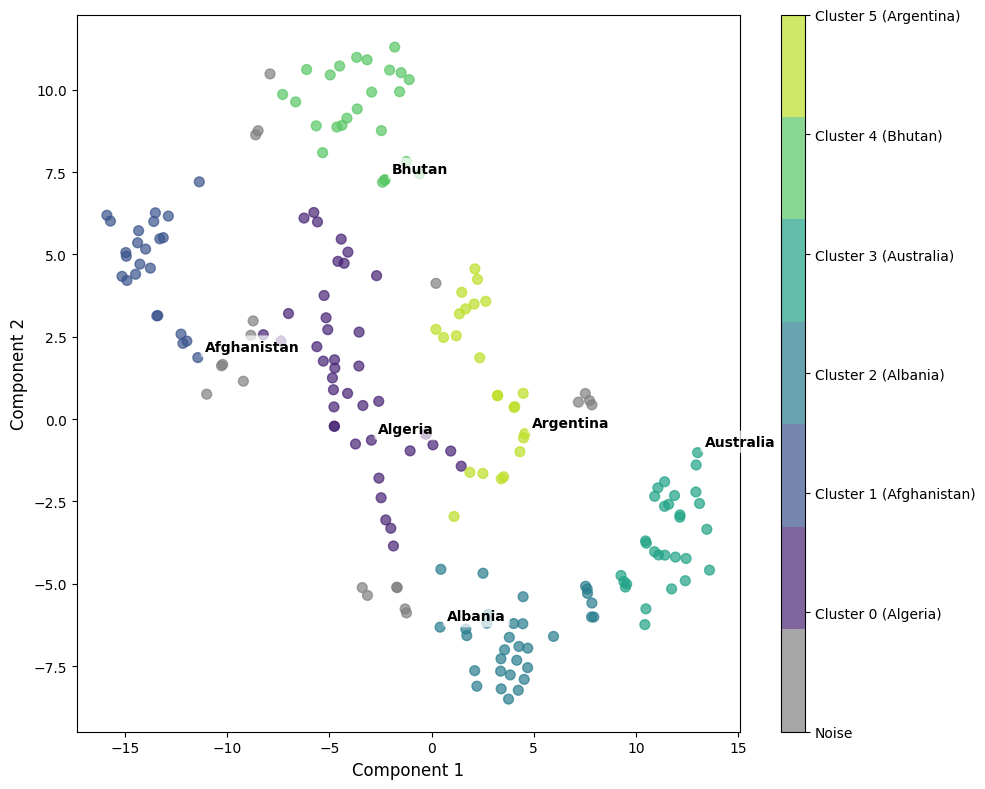

silhouette_score: 0.5928137898445129
davies_bouldin_score: 0.5486078358838435
-----------------------
Epsilon: 2.7142857142857144
Min Samples: 16
silhouette_score: 0.5928137898445129
davies_bouldin_score: 0.5486078358838435
Number of clusters:  6
Number of points in cluster 0: 36
['Algeria' 'Bahamas' 'Belize' 'Benin' 'Cameroon'
 'Central African Republic' 'Chad' 'China' 'Comoros' "Cote d'Ivoire"
 'Cuba' "Democratic People's Republic of Korea" 'Dominican Republic'
 'Fiji' 'Gabon' 'Georgia' 'Guatemala' 'Guyana' 'Israel' 'Jamaica' 'Japan'
 'Lebanon' 'Marshall Islands' 'Morocco' 'Mozambique' 'Nicaragua' 'Nigeria'
 'Tajikistan' 'Timor-Leste' 'Tonga' 'Tunisia' 'Uganda'
 'United States of America' 'Uzbekistan' 'Zambia' 'Zimbabwe']

Number of points in cluster 1: 24
['Afghanistan' 'Andorra' 'Angola' 'Antigua and Barbuda' 'Barbados'
 'Bosnia and Herzegovina' 'Botswana' 'Dominica' 'Equatorial Guinea'
 'Grenada' 'Guinea-Bissau' 'Haiti' 'Liberia' 'Mauritania'
 'Micronesia (Federated States of)' 'M

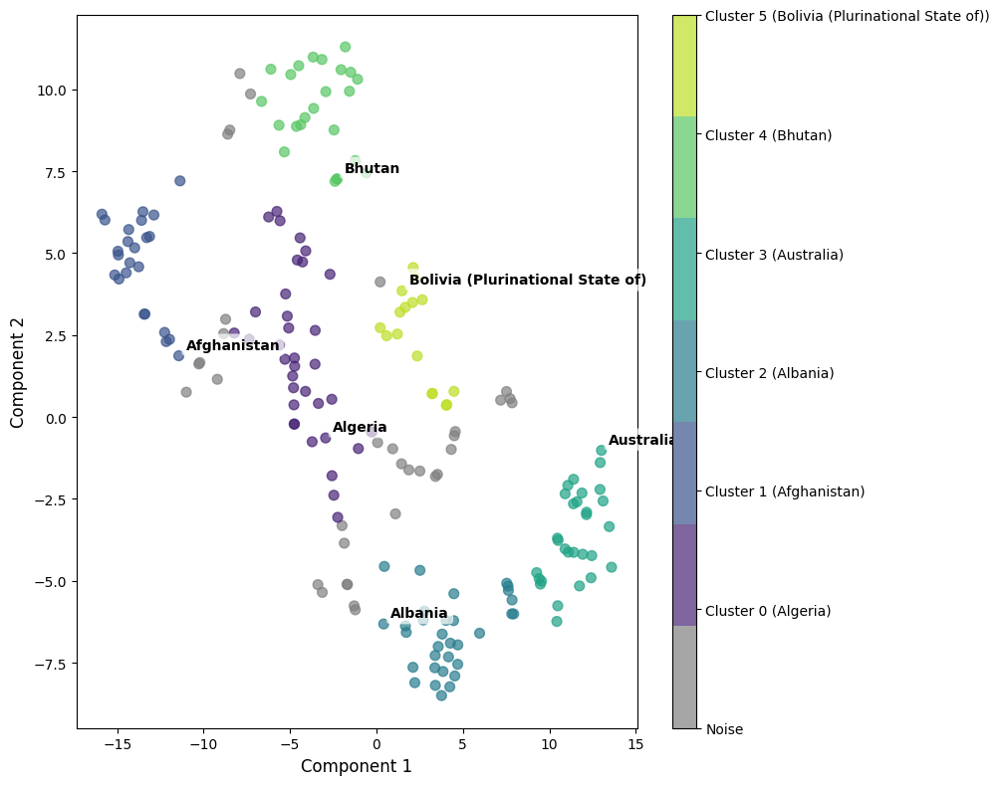

silhouette_score: 0.6216051578521729
davies_bouldin_score: 0.5037508753569687
-----------------------
Epsilon: 2.7142857142857144
Min Samples: 18
silhouette_score: 0.6216051578521729
davies_bouldin_score: 0.5037508753569687
Number of clusters:  5
Number of points in cluster 0: 21
['Andorra' 'Angola' 'Barbados' 'Bosnia and Herzegovina' 'Botswana'
 'Dominica' 'Equatorial Guinea' 'Grenada' 'Guinea-Bissau' 'Haiti'
 'Liberia' 'Mauritania' 'Micronesia (Federated States of)' 'Monaco'
 'Palau' 'Saint Kitts and Nevis' 'Saint Lucia'
 'Saint Vincent and the Grenadines' 'San Marino' 'Sierra Leone' 'Somalia']

Number of points in cluster 1: 32
['Albania' 'Armenia' 'Austria' 'Belarus' 'Bulgaria' 'Croatia' 'Cyprus'
 'Czechia' 'Estonia' 'Finland' 'Germany' 'Greece' 'Hungary' 'Iceland'
 'Italy' 'Kazakhstan' 'Kuwait' "Lao People's Democratic Republic"
 'Lithuania' 'Luxembourg' 'Maldives' 'Myanmar'
 'Netherlands (Kingdom of the)' 'Philippines' 'Poland' 'Portugal' 'Qatar'
 'Republic of Korea' 'Slovakia' '

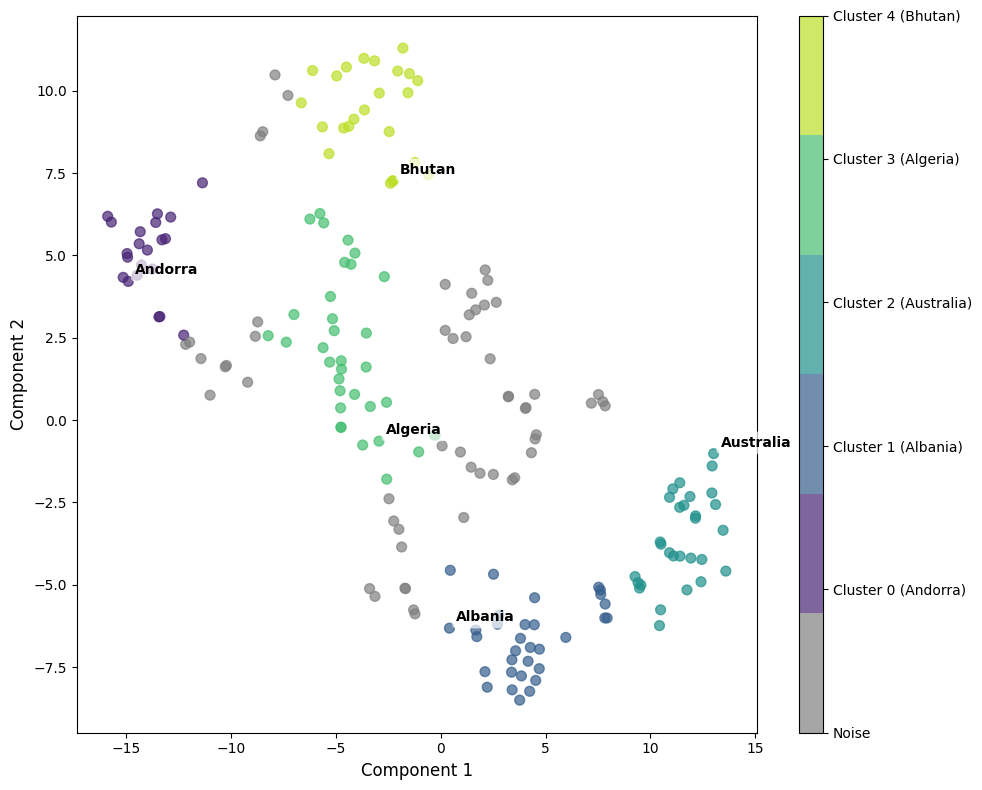

Score cannot be calculated, only one cluster found.
Score cannot be calculated, only one cluster found.
-----------------------
Epsilon: 3.142857142857143
Min Samples: 2
Score cannot be calculated, only one cluster found.
Score cannot be calculated, only one cluster found.
Number of clusters:  1
Number of points in cluster 0: 195
['Afghanistan' 'Albania' 'Algeria' 'Andorra' 'Angola'
 'Antigua and Barbuda' 'Argentina' 'Armenia' 'Australia' 'Austria'
 'Azerbaijan' 'Bahamas' 'Bahrain' 'Bangladesh' 'Barbados' 'Belarus'
 'Belgium' 'Belize' 'Benin' 'Bhutan' 'Bolivia (Plurinational State of)'
 'Bosnia and Herzegovina' 'Botswana' 'Brazil' 'Brunei Darussalam'
 'Bulgaria' 'Burkina Faso' 'Burundi' 'Cabo Verde' 'Cambodia' 'Cameroon'
 'Canada' 'Central African Republic' 'Chad' 'Chile' 'China' 'Colombia'
 'Comoros' 'Congo' 'Cook Islands' 'Costa Rica' "Cote d'Ivoire" 'Croatia'
 'Cuba' 'Cyprus' 'Czechia' "Democratic People's Republic of Korea"
 'Democratic Republic of the Congo' 'Denmark' 'Djibouti' '

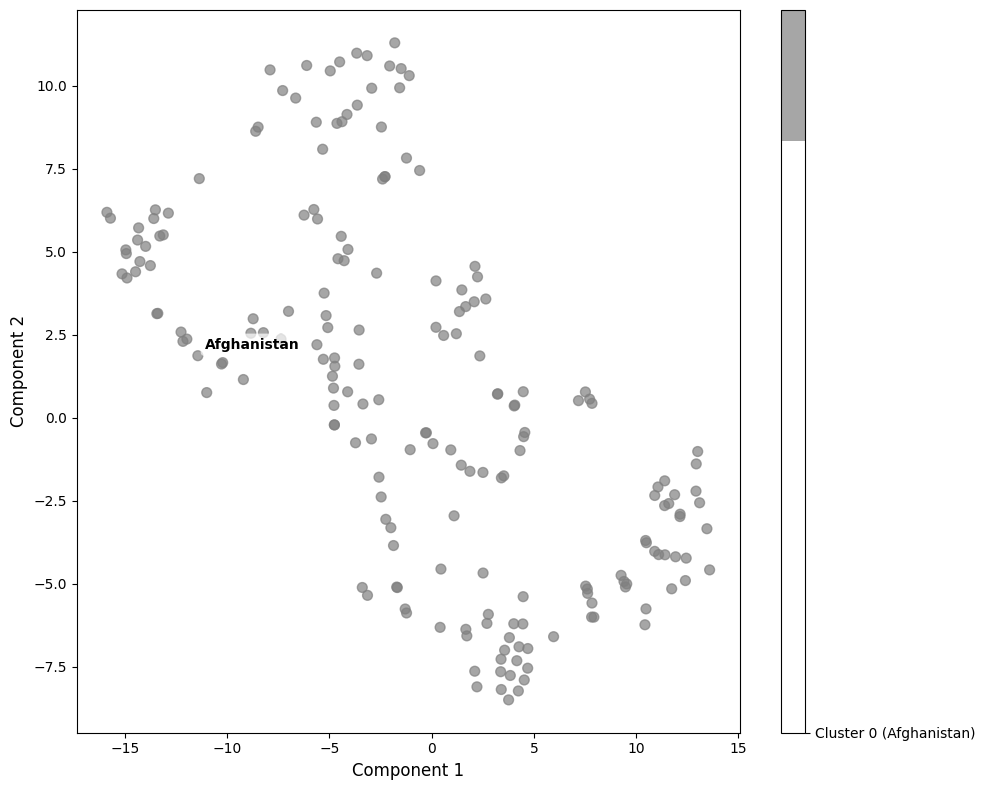

Score cannot be calculated, only one cluster found.
Score cannot be calculated, only one cluster found.
-----------------------
Epsilon: 3.142857142857143
Min Samples: 4
Score cannot be calculated, only one cluster found.
Score cannot be calculated, only one cluster found.
Number of clusters:  1
Number of points in cluster 0: 195
['Afghanistan' 'Albania' 'Algeria' 'Andorra' 'Angola'
 'Antigua and Barbuda' 'Argentina' 'Armenia' 'Australia' 'Austria'
 'Azerbaijan' 'Bahamas' 'Bahrain' 'Bangladesh' 'Barbados' 'Belarus'
 'Belgium' 'Belize' 'Benin' 'Bhutan' 'Bolivia (Plurinational State of)'
 'Bosnia and Herzegovina' 'Botswana' 'Brazil' 'Brunei Darussalam'
 'Bulgaria' 'Burkina Faso' 'Burundi' 'Cabo Verde' 'Cambodia' 'Cameroon'
 'Canada' 'Central African Republic' 'Chad' 'Chile' 'China' 'Colombia'
 'Comoros' 'Congo' 'Cook Islands' 'Costa Rica' "Cote d'Ivoire" 'Croatia'
 'Cuba' 'Cyprus' 'Czechia' "Democratic People's Republic of Korea"
 'Democratic Republic of the Congo' 'Denmark' 'Djibouti' '

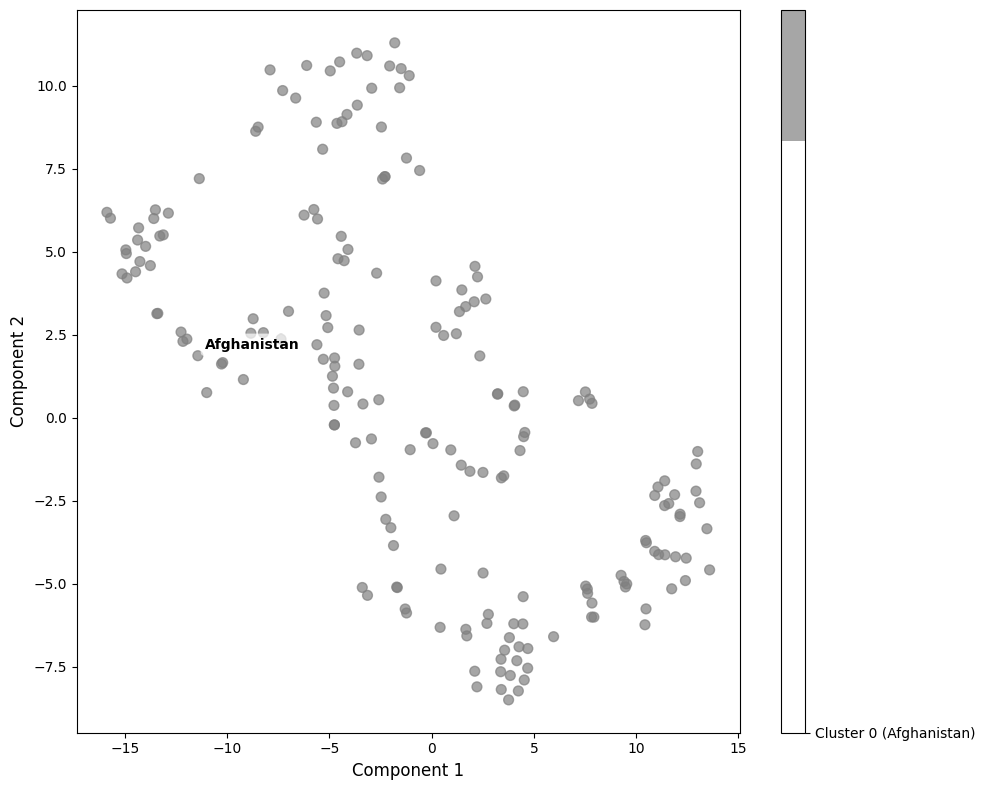

Score cannot be calculated, only one cluster found.
Score cannot be calculated, only one cluster found.
-----------------------
Epsilon: 3.142857142857143
Min Samples: 6
Score cannot be calculated, only one cluster found.
Score cannot be calculated, only one cluster found.
Number of clusters:  1
Number of points in cluster 0: 195
['Afghanistan' 'Albania' 'Algeria' 'Andorra' 'Angola'
 'Antigua and Barbuda' 'Argentina' 'Armenia' 'Australia' 'Austria'
 'Azerbaijan' 'Bahamas' 'Bahrain' 'Bangladesh' 'Barbados' 'Belarus'
 'Belgium' 'Belize' 'Benin' 'Bhutan' 'Bolivia (Plurinational State of)'
 'Bosnia and Herzegovina' 'Botswana' 'Brazil' 'Brunei Darussalam'
 'Bulgaria' 'Burkina Faso' 'Burundi' 'Cabo Verde' 'Cambodia' 'Cameroon'
 'Canada' 'Central African Republic' 'Chad' 'Chile' 'China' 'Colombia'
 'Comoros' 'Congo' 'Cook Islands' 'Costa Rica' "Cote d'Ivoire" 'Croatia'
 'Cuba' 'Cyprus' 'Czechia' "Democratic People's Republic of Korea"
 'Democratic Republic of the Congo' 'Denmark' 'Djibouti' '

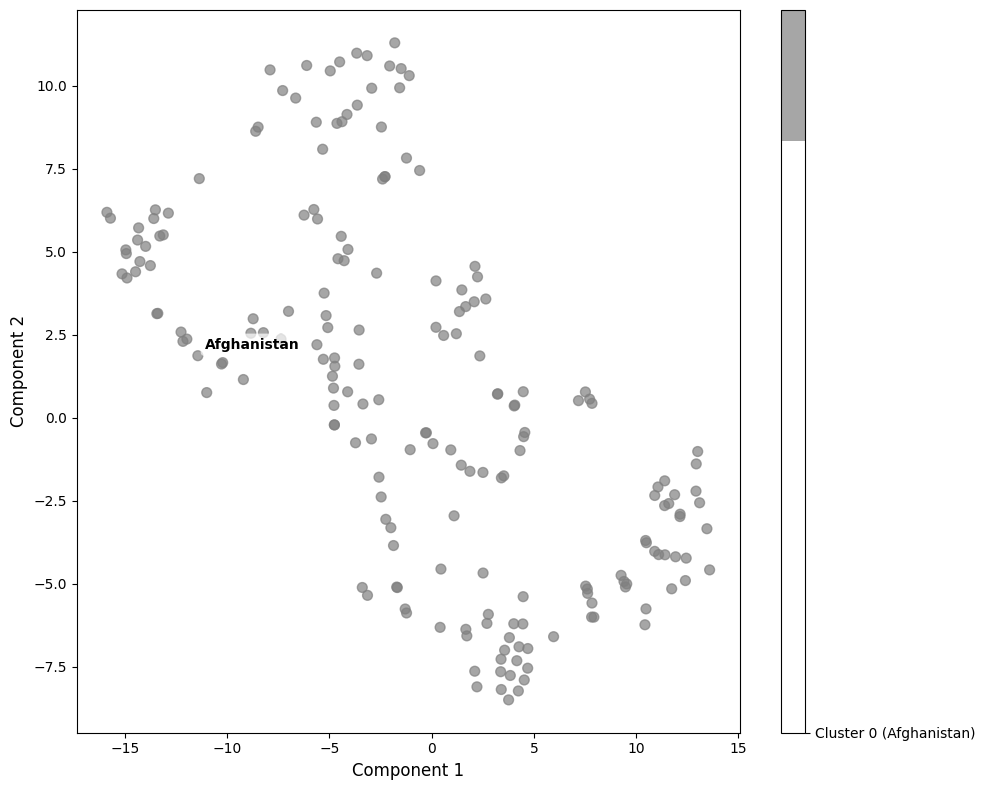

Score cannot be calculated, only one cluster found.
Score cannot be calculated, only one cluster found.
-----------------------
Epsilon: 3.142857142857143
Min Samples: 8
Score cannot be calculated, only one cluster found.
Score cannot be calculated, only one cluster found.
Number of clusters:  1
Number of points in cluster 0: 195
['Afghanistan' 'Albania' 'Algeria' 'Andorra' 'Angola'
 'Antigua and Barbuda' 'Argentina' 'Armenia' 'Australia' 'Austria'
 'Azerbaijan' 'Bahamas' 'Bahrain' 'Bangladesh' 'Barbados' 'Belarus'
 'Belgium' 'Belize' 'Benin' 'Bhutan' 'Bolivia (Plurinational State of)'
 'Bosnia and Herzegovina' 'Botswana' 'Brazil' 'Brunei Darussalam'
 'Bulgaria' 'Burkina Faso' 'Burundi' 'Cabo Verde' 'Cambodia' 'Cameroon'
 'Canada' 'Central African Republic' 'Chad' 'Chile' 'China' 'Colombia'
 'Comoros' 'Congo' 'Cook Islands' 'Costa Rica' "Cote d'Ivoire" 'Croatia'
 'Cuba' 'Cyprus' 'Czechia' "Democratic People's Republic of Korea"
 'Democratic Republic of the Congo' 'Denmark' 'Djibouti' '

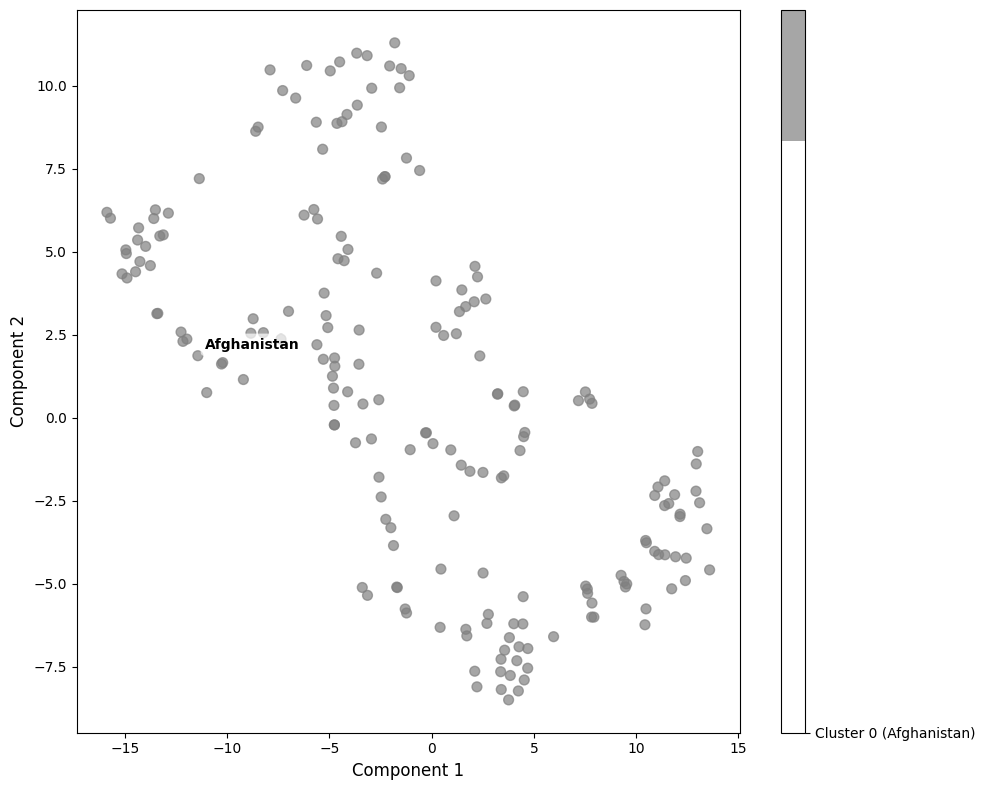

Score cannot be calculated, only one cluster found.
Score cannot be calculated, only one cluster found.
-----------------------
Epsilon: 3.142857142857143
Min Samples: 10
Score cannot be calculated, only one cluster found.
Score cannot be calculated, only one cluster found.
Number of clusters:  1
Number of points in cluster 0: 193
['Afghanistan' 'Albania' 'Algeria' 'Andorra' 'Angola'
 'Antigua and Barbuda' 'Argentina' 'Armenia' 'Australia' 'Austria'
 'Azerbaijan' 'Bahamas' 'Bangladesh' 'Barbados' 'Belarus' 'Belgium'
 'Belize' 'Benin' 'Bhutan' 'Bolivia (Plurinational State of)'
 'Bosnia and Herzegovina' 'Botswana' 'Brazil' 'Brunei Darussalam'
 'Bulgaria' 'Burkina Faso' 'Burundi' 'Cabo Verde' 'Cambodia' 'Cameroon'
 'Canada' 'Central African Republic' 'Chad' 'Chile' 'China' 'Colombia'
 'Comoros' 'Congo' 'Cook Islands' 'Costa Rica' "Cote d'Ivoire" 'Croatia'
 'Cuba' 'Cyprus' 'Czechia' "Democratic People's Republic of Korea"
 'Democratic Republic of the Congo' 'Denmark' 'Djibouti' 'Dominica'

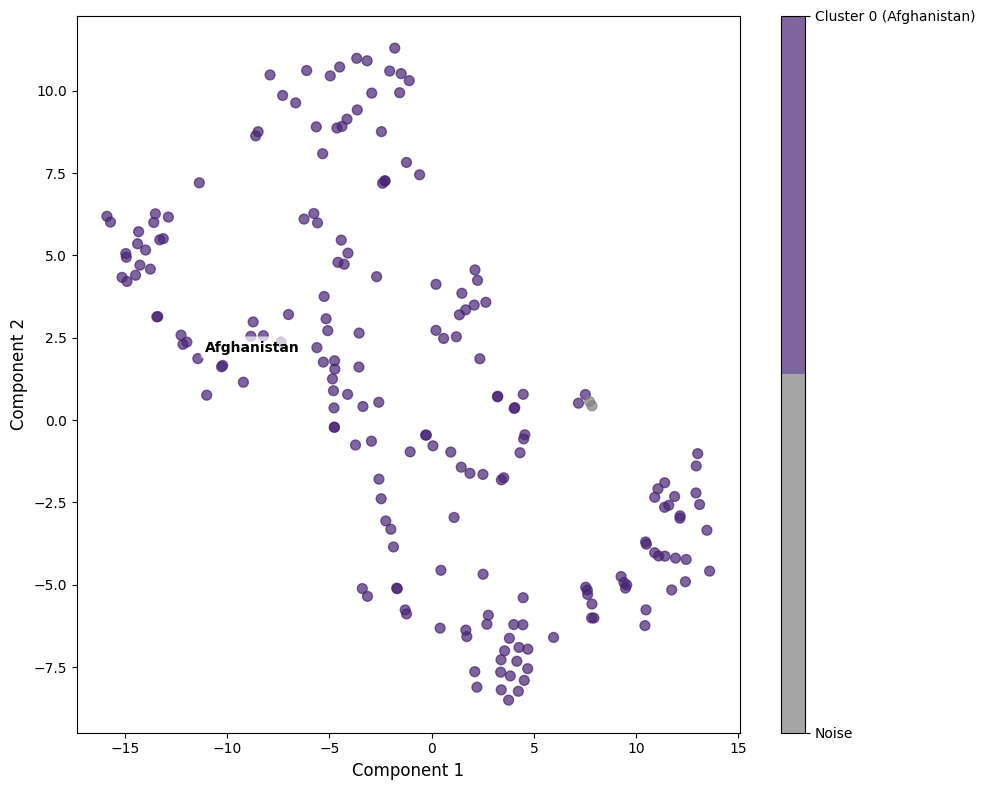

Score cannot be calculated, only one cluster found.
Score cannot be calculated, only one cluster found.
-----------------------
Epsilon: 3.142857142857143
Min Samples: 12
Score cannot be calculated, only one cluster found.
Score cannot be calculated, only one cluster found.
Number of clusters:  1
Number of points in cluster 0: 193
['Afghanistan' 'Albania' 'Algeria' 'Andorra' 'Angola'
 'Antigua and Barbuda' 'Argentina' 'Armenia' 'Australia' 'Austria'
 'Azerbaijan' 'Bahamas' 'Bangladesh' 'Barbados' 'Belarus' 'Belgium'
 'Belize' 'Benin' 'Bhutan' 'Bolivia (Plurinational State of)'
 'Bosnia and Herzegovina' 'Botswana' 'Brazil' 'Brunei Darussalam'
 'Bulgaria' 'Burkina Faso' 'Burundi' 'Cabo Verde' 'Cambodia' 'Cameroon'
 'Canada' 'Central African Republic' 'Chad' 'Chile' 'China' 'Colombia'
 'Comoros' 'Congo' 'Cook Islands' 'Costa Rica' "Cote d'Ivoire" 'Croatia'
 'Cuba' 'Cyprus' 'Czechia' "Democratic People's Republic of Korea"
 'Democratic Republic of the Congo' 'Denmark' 'Djibouti' 'Dominica'

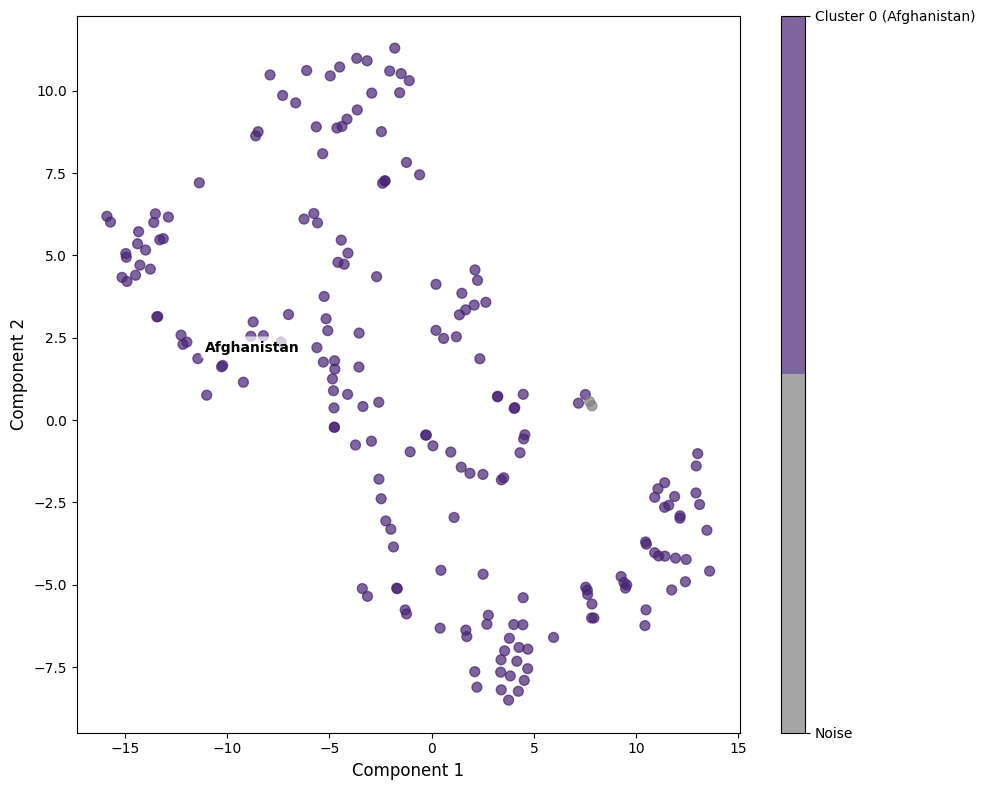

silhouette_score: 0.3541303277015686
davies_bouldin_score: 0.606778550308249
-----------------------
Epsilon: 3.142857142857143
Min Samples: 14
silhouette_score: 0.3541303277015686
davies_bouldin_score: 0.606778550308249
Number of clusters:  2
Number of points in cluster 0: 168
['Albania' 'Algeria' 'Argentina' 'Armenia' 'Australia' 'Austria'
 'Azerbaijan' 'Bahamas' 'Bangladesh' 'Belarus' 'Belgium' 'Belize' 'Benin'
 'Bhutan' 'Bolivia (Plurinational State of)' 'Brazil' 'Brunei Darussalam'
 'Bulgaria' 'Burkina Faso' 'Burundi' 'Cabo Verde' 'Cambodia' 'Cameroon'
 'Canada' 'Central African Republic' 'Chad' 'Chile' 'China' 'Colombia'
 'Comoros' 'Congo' 'Cook Islands' 'Costa Rica' "Cote d'Ivoire" 'Croatia'
 'Cuba' 'Cyprus' 'Czechia' "Democratic People's Republic of Korea"
 'Democratic Republic of the Congo' 'Denmark' 'Djibouti'
 'Dominican Republic' 'Ecuador' 'Egypt' 'El Salvador' 'Eritrea' 'Estonia'
 'Eswatini' 'Ethiopia' 'Fiji' 'Finland' 'France' 'Gabon' 'Gambia'
 'Georgia' 'Germany' 'Ghana'

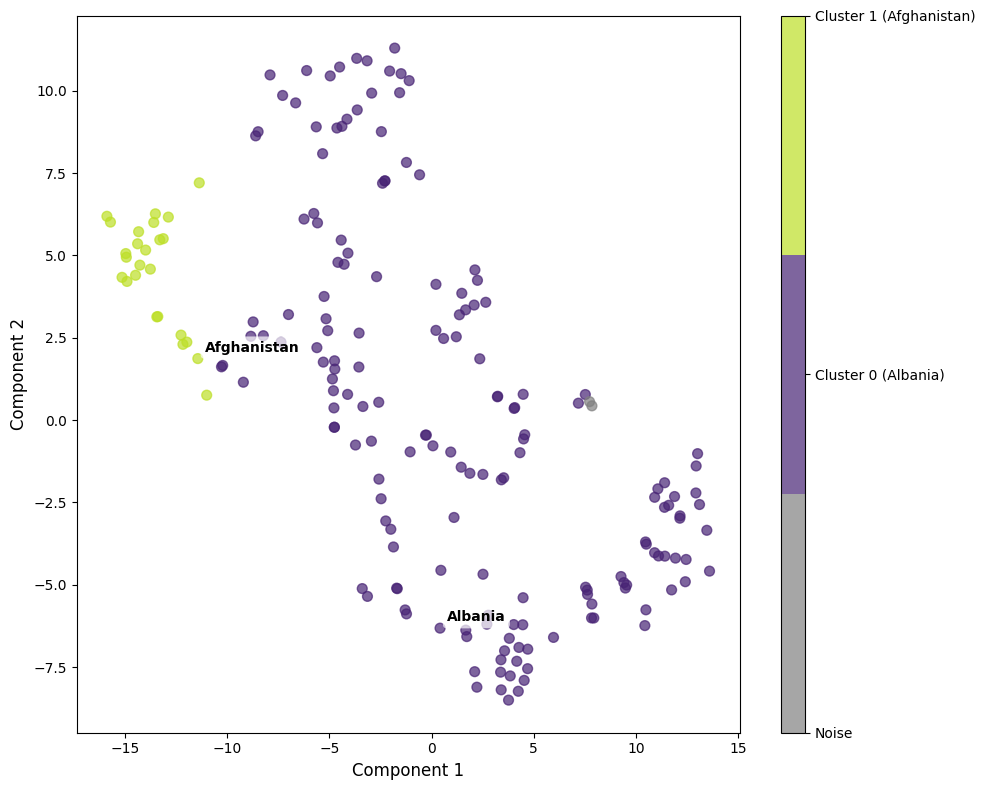

silhouette_score: 0.2808271050453186
davies_bouldin_score: 0.638589123697614
-----------------------
Epsilon: 3.142857142857143
Min Samples: 16
silhouette_score: 0.2808271050453186
davies_bouldin_score: 0.638589123697614
Number of clusters:  3
Number of points in cluster 0: 137
['Albania' 'Algeria' 'Argentina' 'Armenia' 'Austria' 'Azerbaijan'
 'Bahamas' 'Bangladesh' 'Belarus' 'Belize' 'Benin' 'Bhutan'
 'Bolivia (Plurinational State of)' 'Brunei Darussalam' 'Bulgaria'
 'Burkina Faso' 'Burundi' 'Cabo Verde' 'Cameroon'
 'Central African Republic' 'Chad' 'China' 'Comoros' 'Congo'
 'Cook Islands' 'Costa Rica' "Cote d'Ivoire" 'Croatia' 'Cuba' 'Cyprus'
 'Czechia' "Democratic People's Republic of Korea"
 'Democratic Republic of the Congo' 'Denmark' 'Dominican Republic'
 'Ecuador' 'El Salvador' 'Eritrea' 'Estonia' 'Eswatini' 'Ethiopia' 'Fiji'
 'Finland' 'Gabon' 'Gambia' 'Georgia' 'Germany' 'Ghana' 'Greece'
 'Guatemala' 'Guinea' 'Guyana' 'Honduras' 'Hungary' 'Iceland' 'India'
 'Indonesia' 'Iraq'

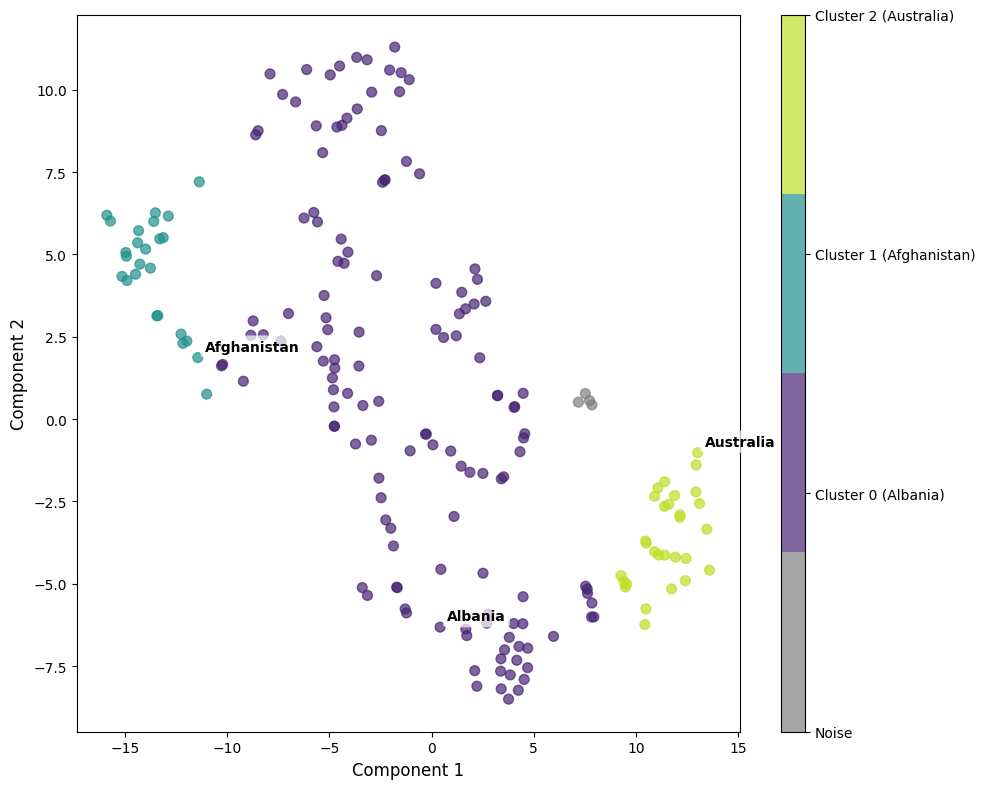

silhouette_score: 0.4867010712623596
davies_bouldin_score: 0.6516973813559227
-----------------------
Epsilon: 3.142857142857143
Min Samples: 18
silhouette_score: 0.4867010712623596
davies_bouldin_score: 0.6516973813559227
Number of clusters:  5
Number of points in cluster 0: 41
['Algeria' 'Bahamas' 'Belize' 'Benin' 'Cameroon'
 'Central African Republic' 'Chad' 'China' 'Comoros' 'Congo'
 "Cote d'Ivoire" 'Cuba' "Democratic People's Republic of Korea"
 'Dominican Republic' 'Fiji' 'Gabon' 'Georgia' 'Guatemala' 'Guinea'
 'Guyana' 'Israel' 'Jamaica' 'Japan' 'Lebanon' 'Marshall Islands'
 'Morocco' 'Mozambique' 'Nicaragua' 'Nigeria' 'Paraguay' 'Rwanda'
 'Sao Tome and Principe' 'Tajikistan' 'Timor-Leste' 'Tonga' 'Tunisia'
 'Uganda' 'United States of America' 'Uzbekistan' 'Zambia' 'Zimbabwe']

Number of points in cluster 1: 24
['Afghanistan' 'Andorra' 'Angola' 'Antigua and Barbuda' 'Barbados'
 'Bosnia and Herzegovina' 'Botswana' 'Dominica' 'Equatorial Guinea'
 'Grenada' 'Guinea-Bissau' 'Haiti' 

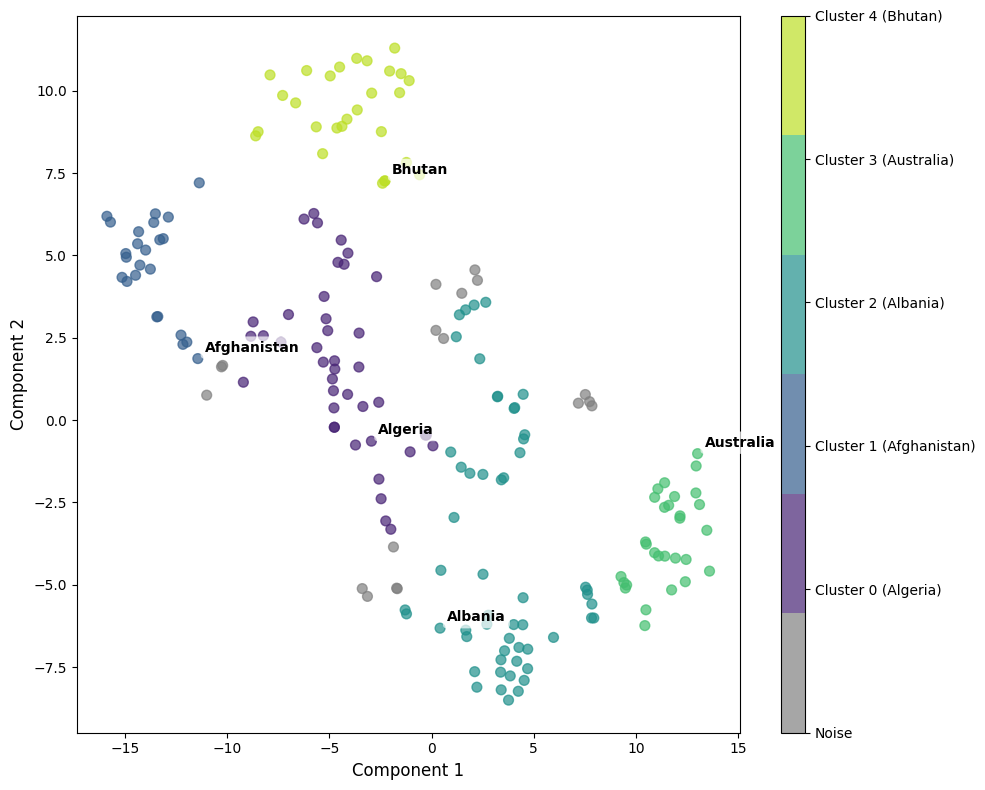

Score cannot be calculated, only one cluster found.
Score cannot be calculated, only one cluster found.
-----------------------
Epsilon: 3.571428571428571
Min Samples: 2
Score cannot be calculated, only one cluster found.
Score cannot be calculated, only one cluster found.
Number of clusters:  1
Number of points in cluster 0: 195
['Afghanistan' 'Albania' 'Algeria' 'Andorra' 'Angola'
 'Antigua and Barbuda' 'Argentina' 'Armenia' 'Australia' 'Austria'
 'Azerbaijan' 'Bahamas' 'Bahrain' 'Bangladesh' 'Barbados' 'Belarus'
 'Belgium' 'Belize' 'Benin' 'Bhutan' 'Bolivia (Plurinational State of)'
 'Bosnia and Herzegovina' 'Botswana' 'Brazil' 'Brunei Darussalam'
 'Bulgaria' 'Burkina Faso' 'Burundi' 'Cabo Verde' 'Cambodia' 'Cameroon'
 'Canada' 'Central African Republic' 'Chad' 'Chile' 'China' 'Colombia'
 'Comoros' 'Congo' 'Cook Islands' 'Costa Rica' "Cote d'Ivoire" 'Croatia'
 'Cuba' 'Cyprus' 'Czechia' "Democratic People's Republic of Korea"
 'Democratic Republic of the Congo' 'Denmark' 'Djibouti' '

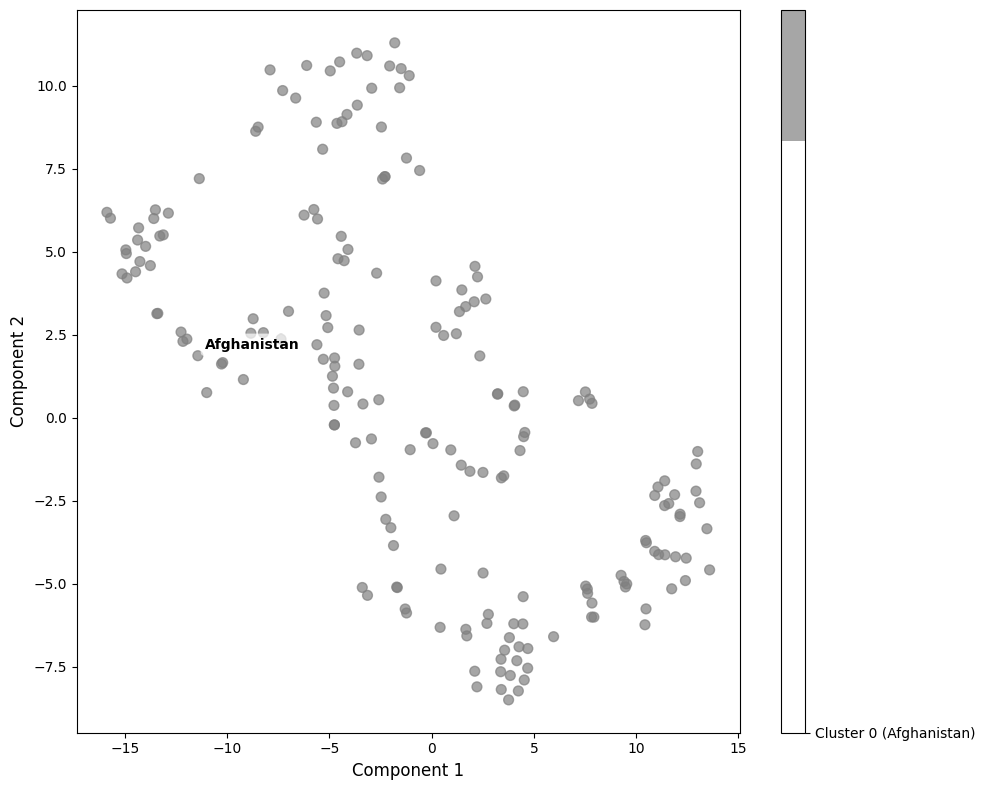

Score cannot be calculated, only one cluster found.
Score cannot be calculated, only one cluster found.
-----------------------
Epsilon: 3.571428571428571
Min Samples: 4
Score cannot be calculated, only one cluster found.
Score cannot be calculated, only one cluster found.
Number of clusters:  1
Number of points in cluster 0: 195
['Afghanistan' 'Albania' 'Algeria' 'Andorra' 'Angola'
 'Antigua and Barbuda' 'Argentina' 'Armenia' 'Australia' 'Austria'
 'Azerbaijan' 'Bahamas' 'Bahrain' 'Bangladesh' 'Barbados' 'Belarus'
 'Belgium' 'Belize' 'Benin' 'Bhutan' 'Bolivia (Plurinational State of)'
 'Bosnia and Herzegovina' 'Botswana' 'Brazil' 'Brunei Darussalam'
 'Bulgaria' 'Burkina Faso' 'Burundi' 'Cabo Verde' 'Cambodia' 'Cameroon'
 'Canada' 'Central African Republic' 'Chad' 'Chile' 'China' 'Colombia'
 'Comoros' 'Congo' 'Cook Islands' 'Costa Rica' "Cote d'Ivoire" 'Croatia'
 'Cuba' 'Cyprus' 'Czechia' "Democratic People's Republic of Korea"
 'Democratic Republic of the Congo' 'Denmark' 'Djibouti' '

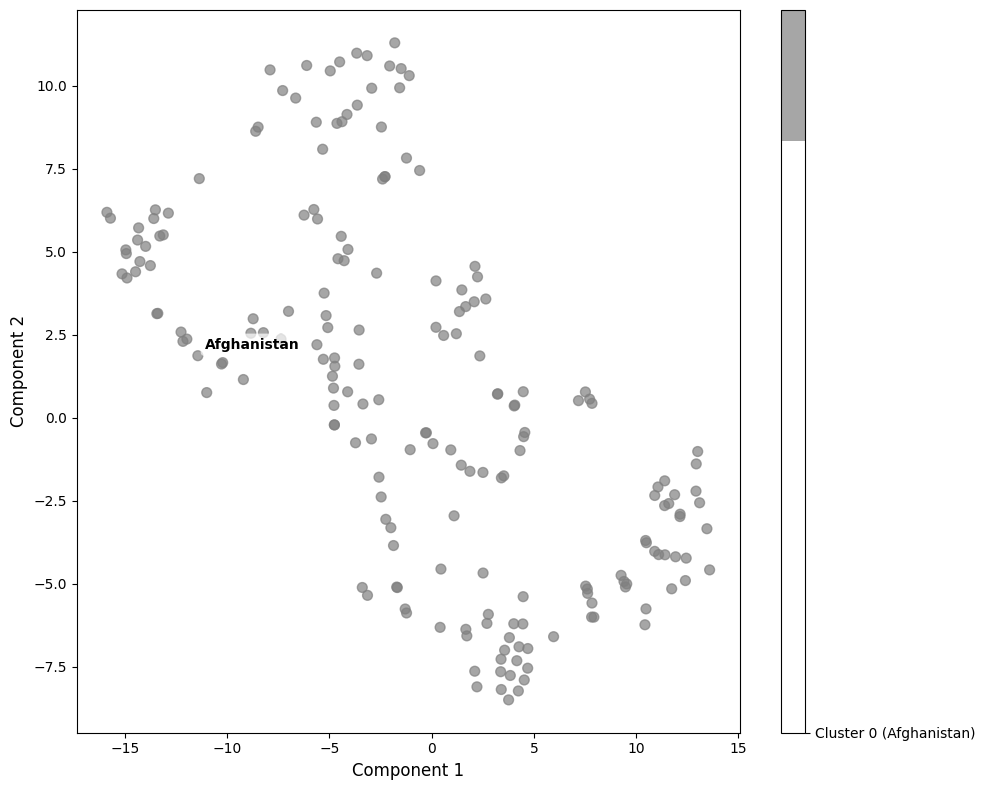

Score cannot be calculated, only one cluster found.
Score cannot be calculated, only one cluster found.
-----------------------
Epsilon: 3.571428571428571
Min Samples: 6
Score cannot be calculated, only one cluster found.
Score cannot be calculated, only one cluster found.
Number of clusters:  1
Number of points in cluster 0: 195
['Afghanistan' 'Albania' 'Algeria' 'Andorra' 'Angola'
 'Antigua and Barbuda' 'Argentina' 'Armenia' 'Australia' 'Austria'
 'Azerbaijan' 'Bahamas' 'Bahrain' 'Bangladesh' 'Barbados' 'Belarus'
 'Belgium' 'Belize' 'Benin' 'Bhutan' 'Bolivia (Plurinational State of)'
 'Bosnia and Herzegovina' 'Botswana' 'Brazil' 'Brunei Darussalam'
 'Bulgaria' 'Burkina Faso' 'Burundi' 'Cabo Verde' 'Cambodia' 'Cameroon'
 'Canada' 'Central African Republic' 'Chad' 'Chile' 'China' 'Colombia'
 'Comoros' 'Congo' 'Cook Islands' 'Costa Rica' "Cote d'Ivoire" 'Croatia'
 'Cuba' 'Cyprus' 'Czechia' "Democratic People's Republic of Korea"
 'Democratic Republic of the Congo' 'Denmark' 'Djibouti' '

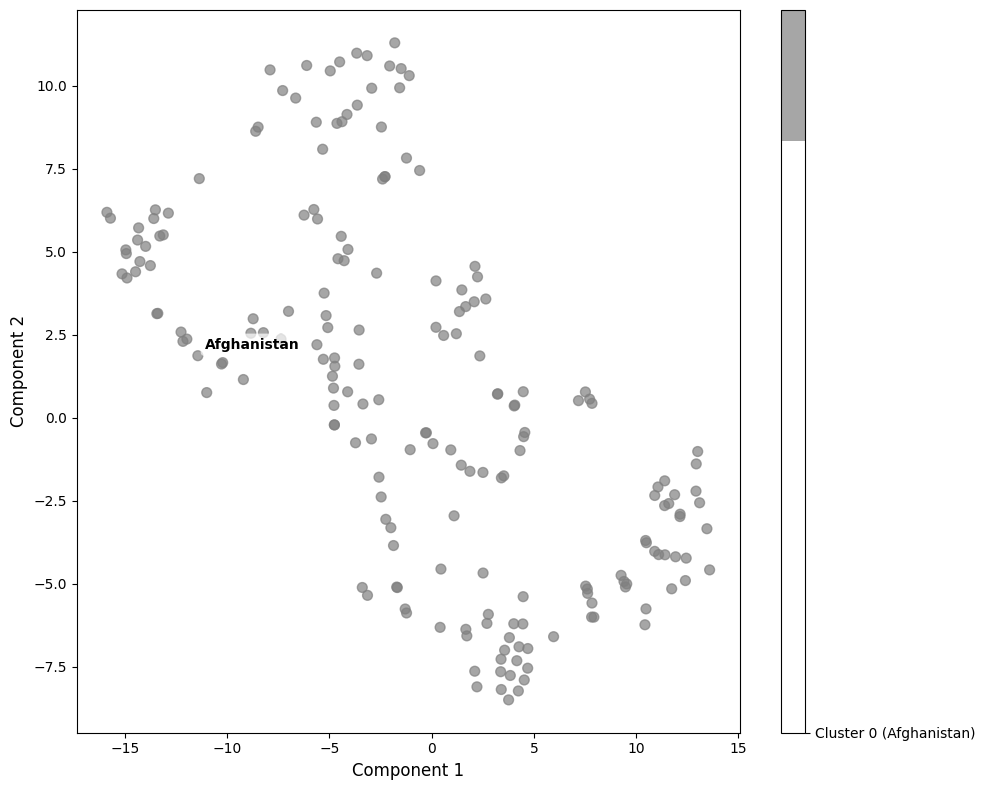

Score cannot be calculated, only one cluster found.
Score cannot be calculated, only one cluster found.
-----------------------
Epsilon: 3.571428571428571
Min Samples: 8
Score cannot be calculated, only one cluster found.
Score cannot be calculated, only one cluster found.
Number of clusters:  1
Number of points in cluster 0: 195
['Afghanistan' 'Albania' 'Algeria' 'Andorra' 'Angola'
 'Antigua and Barbuda' 'Argentina' 'Armenia' 'Australia' 'Austria'
 'Azerbaijan' 'Bahamas' 'Bahrain' 'Bangladesh' 'Barbados' 'Belarus'
 'Belgium' 'Belize' 'Benin' 'Bhutan' 'Bolivia (Plurinational State of)'
 'Bosnia and Herzegovina' 'Botswana' 'Brazil' 'Brunei Darussalam'
 'Bulgaria' 'Burkina Faso' 'Burundi' 'Cabo Verde' 'Cambodia' 'Cameroon'
 'Canada' 'Central African Republic' 'Chad' 'Chile' 'China' 'Colombia'
 'Comoros' 'Congo' 'Cook Islands' 'Costa Rica' "Cote d'Ivoire" 'Croatia'
 'Cuba' 'Cyprus' 'Czechia' "Democratic People's Republic of Korea"
 'Democratic Republic of the Congo' 'Denmark' 'Djibouti' '

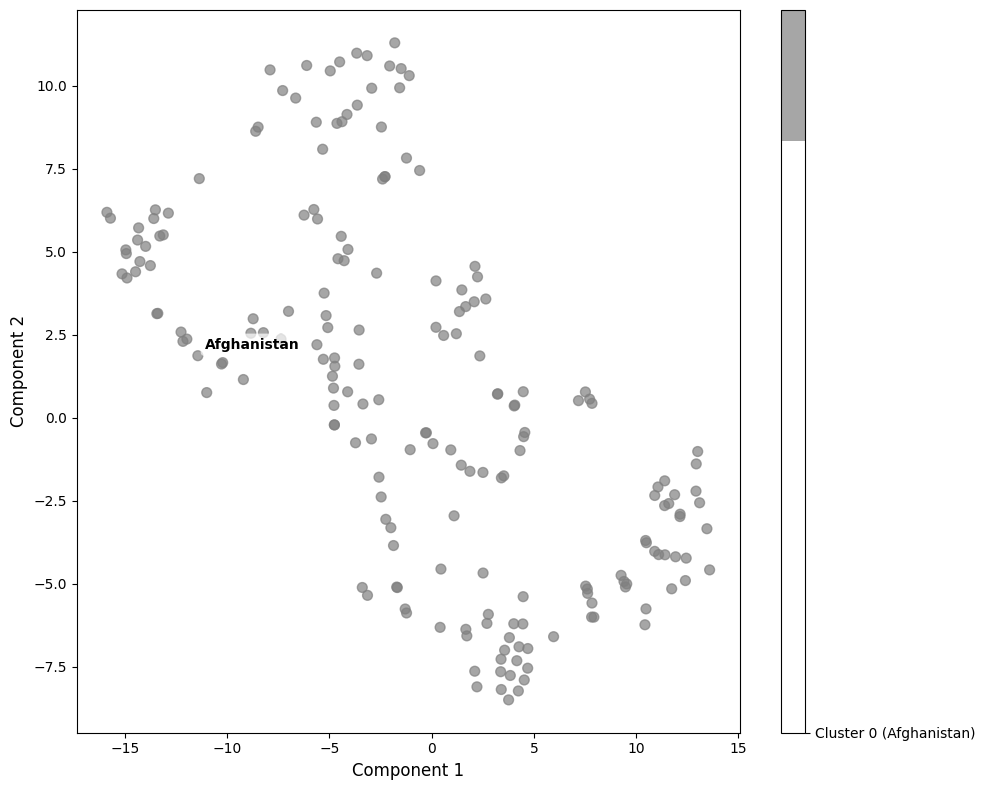

Score cannot be calculated, only one cluster found.
Score cannot be calculated, only one cluster found.
-----------------------
Epsilon: 3.571428571428571
Min Samples: 10
Score cannot be calculated, only one cluster found.
Score cannot be calculated, only one cluster found.
Number of clusters:  1
Number of points in cluster 0: 195
['Afghanistan' 'Albania' 'Algeria' 'Andorra' 'Angola'
 'Antigua and Barbuda' 'Argentina' 'Armenia' 'Australia' 'Austria'
 'Azerbaijan' 'Bahamas' 'Bahrain' 'Bangladesh' 'Barbados' 'Belarus'
 'Belgium' 'Belize' 'Benin' 'Bhutan' 'Bolivia (Plurinational State of)'
 'Bosnia and Herzegovina' 'Botswana' 'Brazil' 'Brunei Darussalam'
 'Bulgaria' 'Burkina Faso' 'Burundi' 'Cabo Verde' 'Cambodia' 'Cameroon'
 'Canada' 'Central African Republic' 'Chad' 'Chile' 'China' 'Colombia'
 'Comoros' 'Congo' 'Cook Islands' 'Costa Rica' "Cote d'Ivoire" 'Croatia'
 'Cuba' 'Cyprus' 'Czechia' "Democratic People's Republic of Korea"
 'Democratic Republic of the Congo' 'Denmark' 'Djibouti' 

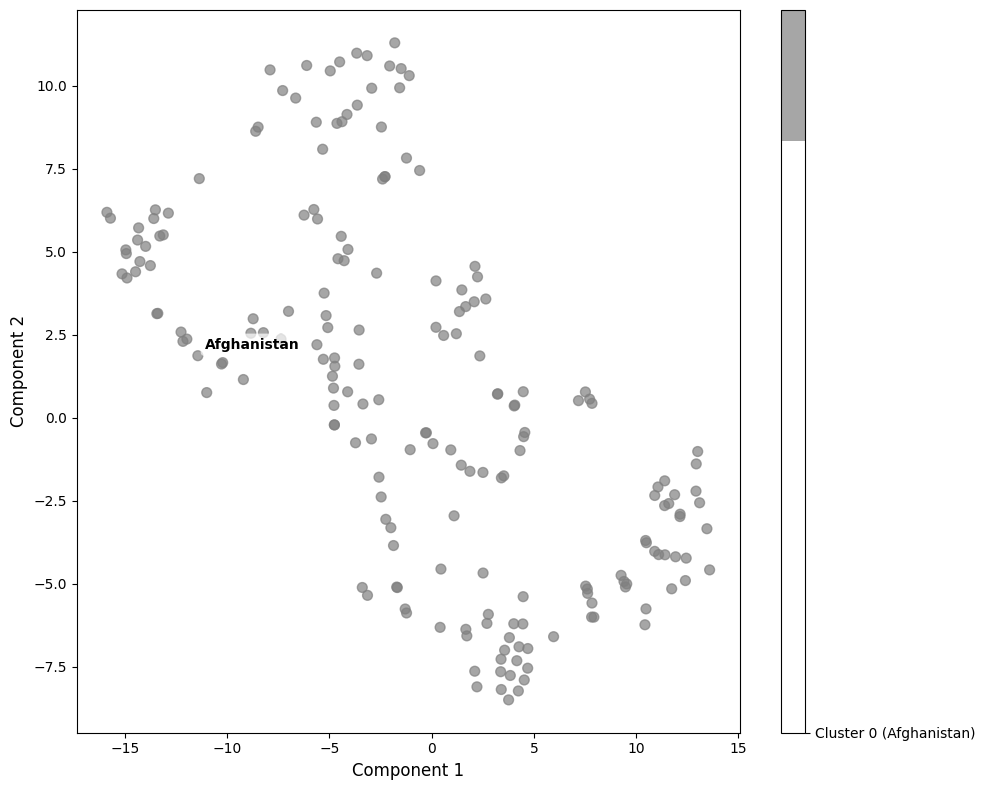

Score cannot be calculated, only one cluster found.
Score cannot be calculated, only one cluster found.
-----------------------
Epsilon: 3.571428571428571
Min Samples: 12
Score cannot be calculated, only one cluster found.
Score cannot be calculated, only one cluster found.
Number of clusters:  1
Number of points in cluster 0: 195
['Afghanistan' 'Albania' 'Algeria' 'Andorra' 'Angola'
 'Antigua and Barbuda' 'Argentina' 'Armenia' 'Australia' 'Austria'
 'Azerbaijan' 'Bahamas' 'Bahrain' 'Bangladesh' 'Barbados' 'Belarus'
 'Belgium' 'Belize' 'Benin' 'Bhutan' 'Bolivia (Plurinational State of)'
 'Bosnia and Herzegovina' 'Botswana' 'Brazil' 'Brunei Darussalam'
 'Bulgaria' 'Burkina Faso' 'Burundi' 'Cabo Verde' 'Cambodia' 'Cameroon'
 'Canada' 'Central African Republic' 'Chad' 'Chile' 'China' 'Colombia'
 'Comoros' 'Congo' 'Cook Islands' 'Costa Rica' "Cote d'Ivoire" 'Croatia'
 'Cuba' 'Cyprus' 'Czechia' "Democratic People's Republic of Korea"
 'Democratic Republic of the Congo' 'Denmark' 'Djibouti' 

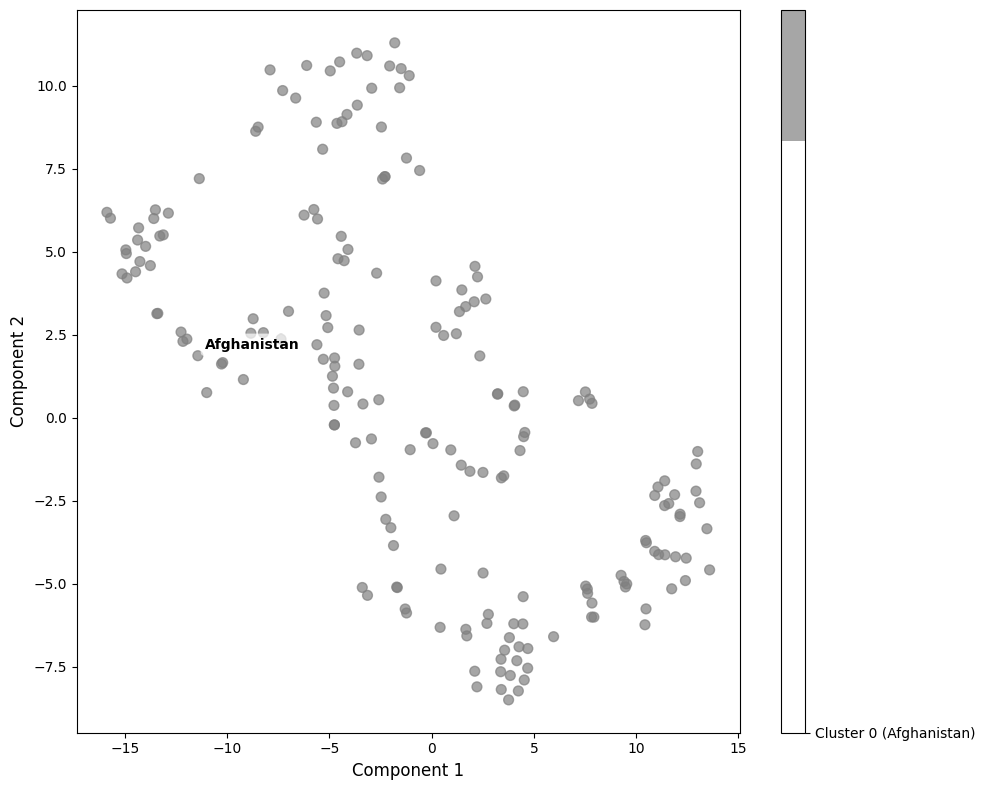

Score cannot be calculated, only one cluster found.
Score cannot be calculated, only one cluster found.
-----------------------
Epsilon: 3.571428571428571
Min Samples: 14
Score cannot be calculated, only one cluster found.
Score cannot be calculated, only one cluster found.
Number of clusters:  1
Number of points in cluster 0: 195
['Afghanistan' 'Albania' 'Algeria' 'Andorra' 'Angola'
 'Antigua and Barbuda' 'Argentina' 'Armenia' 'Australia' 'Austria'
 'Azerbaijan' 'Bahamas' 'Bahrain' 'Bangladesh' 'Barbados' 'Belarus'
 'Belgium' 'Belize' 'Benin' 'Bhutan' 'Bolivia (Plurinational State of)'
 'Bosnia and Herzegovina' 'Botswana' 'Brazil' 'Brunei Darussalam'
 'Bulgaria' 'Burkina Faso' 'Burundi' 'Cabo Verde' 'Cambodia' 'Cameroon'
 'Canada' 'Central African Republic' 'Chad' 'Chile' 'China' 'Colombia'
 'Comoros' 'Congo' 'Cook Islands' 'Costa Rica' "Cote d'Ivoire" 'Croatia'
 'Cuba' 'Cyprus' 'Czechia' "Democratic People's Republic of Korea"
 'Democratic Republic of the Congo' 'Denmark' 'Djibouti' 

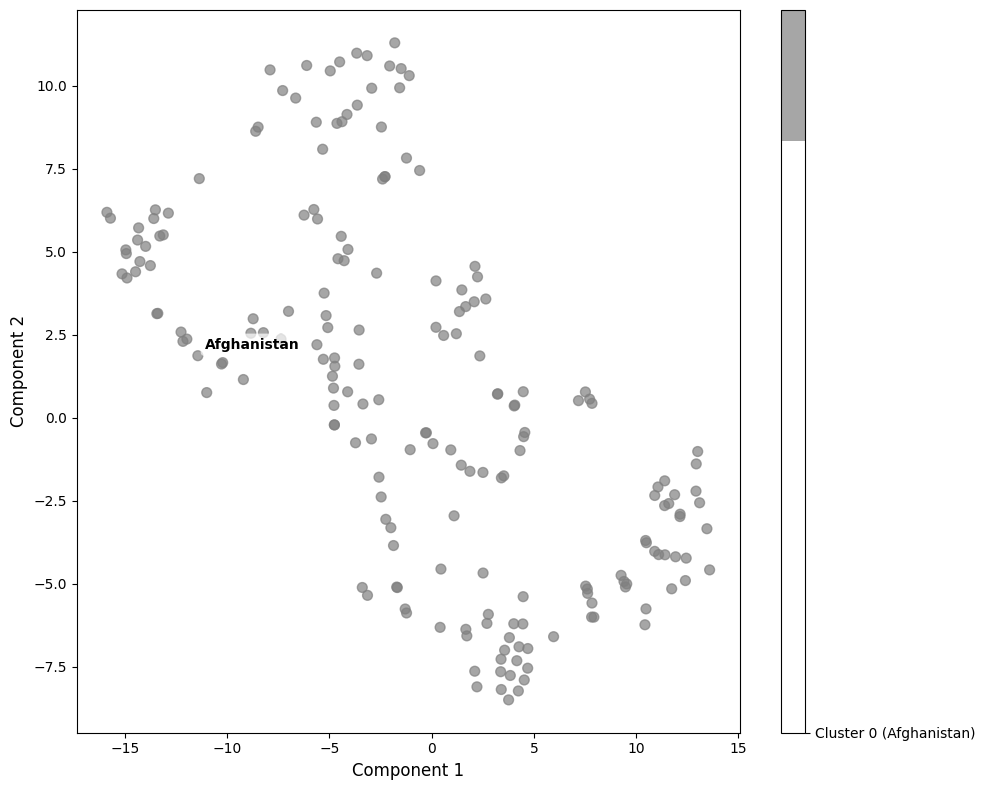

Score cannot be calculated, only one cluster found.
Score cannot be calculated, only one cluster found.
-----------------------
Epsilon: 3.571428571428571
Min Samples: 16
Score cannot be calculated, only one cluster found.
Score cannot be calculated, only one cluster found.
Number of clusters:  1
Number of points in cluster 0: 195
['Afghanistan' 'Albania' 'Algeria' 'Andorra' 'Angola'
 'Antigua and Barbuda' 'Argentina' 'Armenia' 'Australia' 'Austria'
 'Azerbaijan' 'Bahamas' 'Bahrain' 'Bangladesh' 'Barbados' 'Belarus'
 'Belgium' 'Belize' 'Benin' 'Bhutan' 'Bolivia (Plurinational State of)'
 'Bosnia and Herzegovina' 'Botswana' 'Brazil' 'Brunei Darussalam'
 'Bulgaria' 'Burkina Faso' 'Burundi' 'Cabo Verde' 'Cambodia' 'Cameroon'
 'Canada' 'Central African Republic' 'Chad' 'Chile' 'China' 'Colombia'
 'Comoros' 'Congo' 'Cook Islands' 'Costa Rica' "Cote d'Ivoire" 'Croatia'
 'Cuba' 'Cyprus' 'Czechia' "Democratic People's Republic of Korea"
 'Democratic Republic of the Congo' 'Denmark' 'Djibouti' 

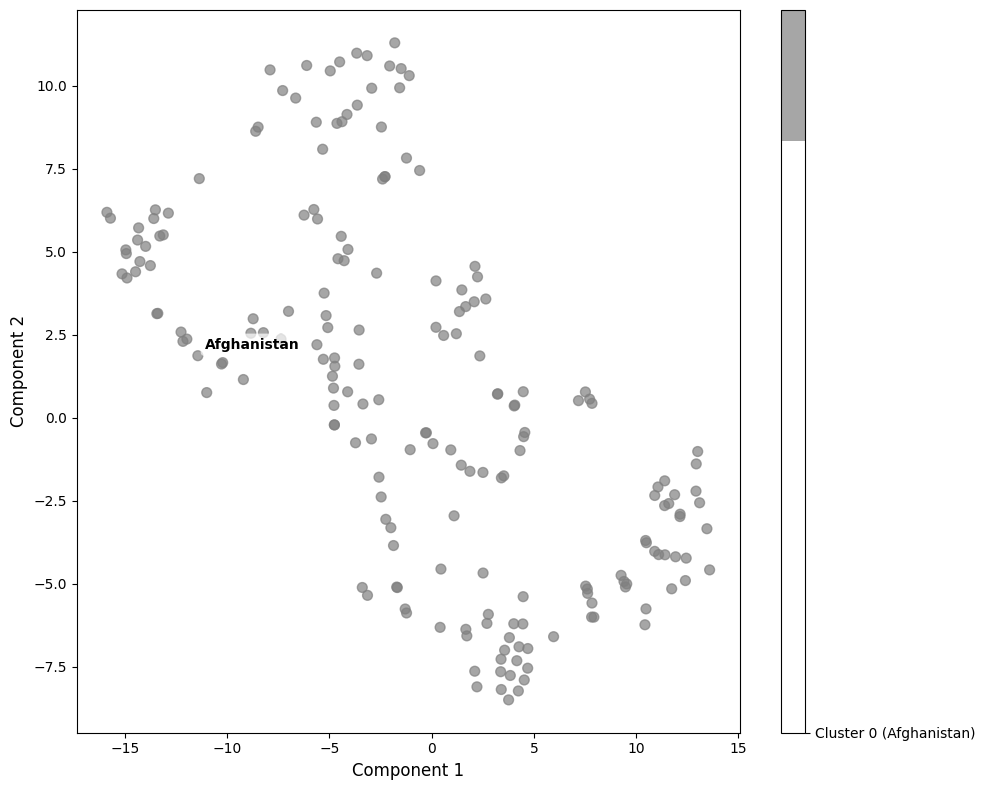

silhouette_score: 0.35618969798088074
davies_bouldin_score: 0.6032530270098077
-----------------------
Epsilon: 3.571428571428571
Min Samples: 18
silhouette_score: 0.35618969798088074
davies_bouldin_score: 0.6032530270098077
Number of clusters:  2
Number of points in cluster 0: 170
['Albania' 'Algeria' 'Argentina' 'Armenia' 'Australia' 'Austria'
 'Azerbaijan' 'Bahamas' 'Bahrain' 'Bangladesh' 'Belarus' 'Belgium'
 'Belize' 'Benin' 'Bhutan' 'Bolivia (Plurinational State of)' 'Brazil'
 'Brunei Darussalam' 'Bulgaria' 'Burkina Faso' 'Burundi' 'Cabo Verde'
 'Cambodia' 'Cameroon' 'Canada' 'Central African Republic' 'Chad' 'Chile'
 'China' 'Colombia' 'Comoros' 'Congo' 'Cook Islands' 'Costa Rica'
 "Cote d'Ivoire" 'Croatia' 'Cuba' 'Cyprus' 'Czechia'
 "Democratic People's Republic of Korea"
 'Democratic Republic of the Congo' 'Denmark' 'Djibouti'
 'Dominican Republic' 'Ecuador' 'Egypt' 'El Salvador' 'Eritrea' 'Estonia'
 'Eswatini' 'Ethiopia' 'Fiji' 'Finland' 'France' 'Gabon' 'Gambia'
 'Georgia' 'G

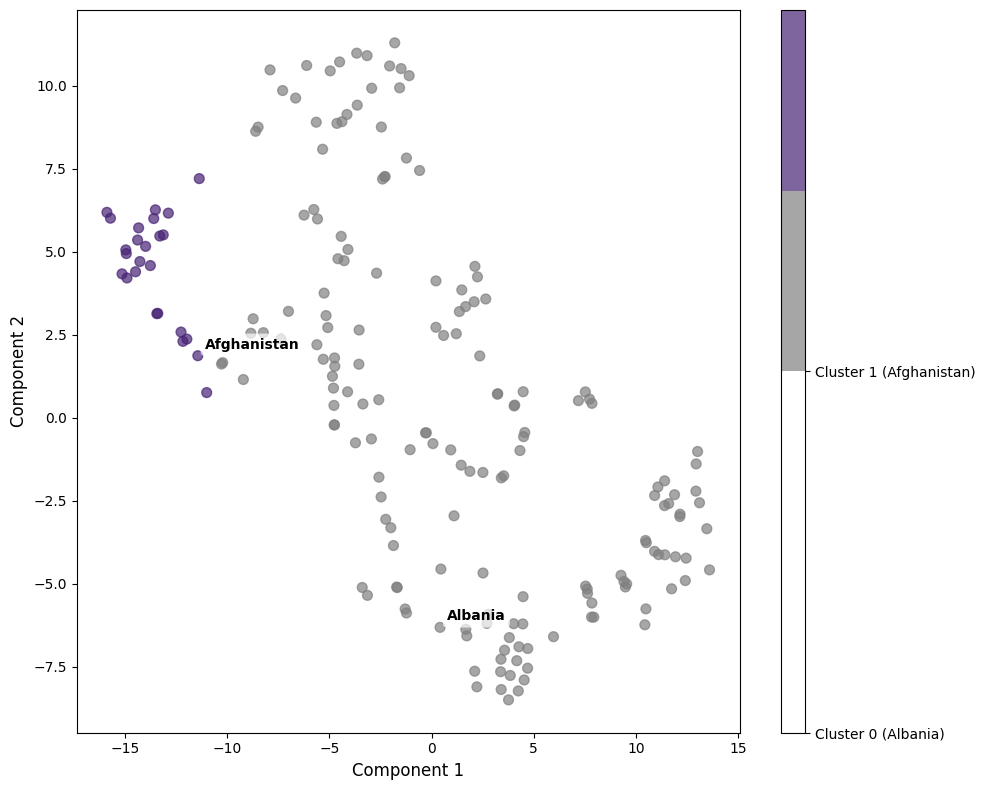

Score cannot be calculated, only one cluster found.
Score cannot be calculated, only one cluster found.
-----------------------
Epsilon: 4.0
Min Samples: 2
Score cannot be calculated, only one cluster found.
Score cannot be calculated, only one cluster found.
Number of clusters:  1
Number of points in cluster 0: 195
['Afghanistan' 'Albania' 'Algeria' 'Andorra' 'Angola'
 'Antigua and Barbuda' 'Argentina' 'Armenia' 'Australia' 'Austria'
 'Azerbaijan' 'Bahamas' 'Bahrain' 'Bangladesh' 'Barbados' 'Belarus'
 'Belgium' 'Belize' 'Benin' 'Bhutan' 'Bolivia (Plurinational State of)'
 'Bosnia and Herzegovina' 'Botswana' 'Brazil' 'Brunei Darussalam'
 'Bulgaria' 'Burkina Faso' 'Burundi' 'Cabo Verde' 'Cambodia' 'Cameroon'
 'Canada' 'Central African Republic' 'Chad' 'Chile' 'China' 'Colombia'
 'Comoros' 'Congo' 'Cook Islands' 'Costa Rica' "Cote d'Ivoire" 'Croatia'
 'Cuba' 'Cyprus' 'Czechia' "Democratic People's Republic of Korea"
 'Democratic Republic of the Congo' 'Denmark' 'Djibouti' 'Dominica'
 'Do

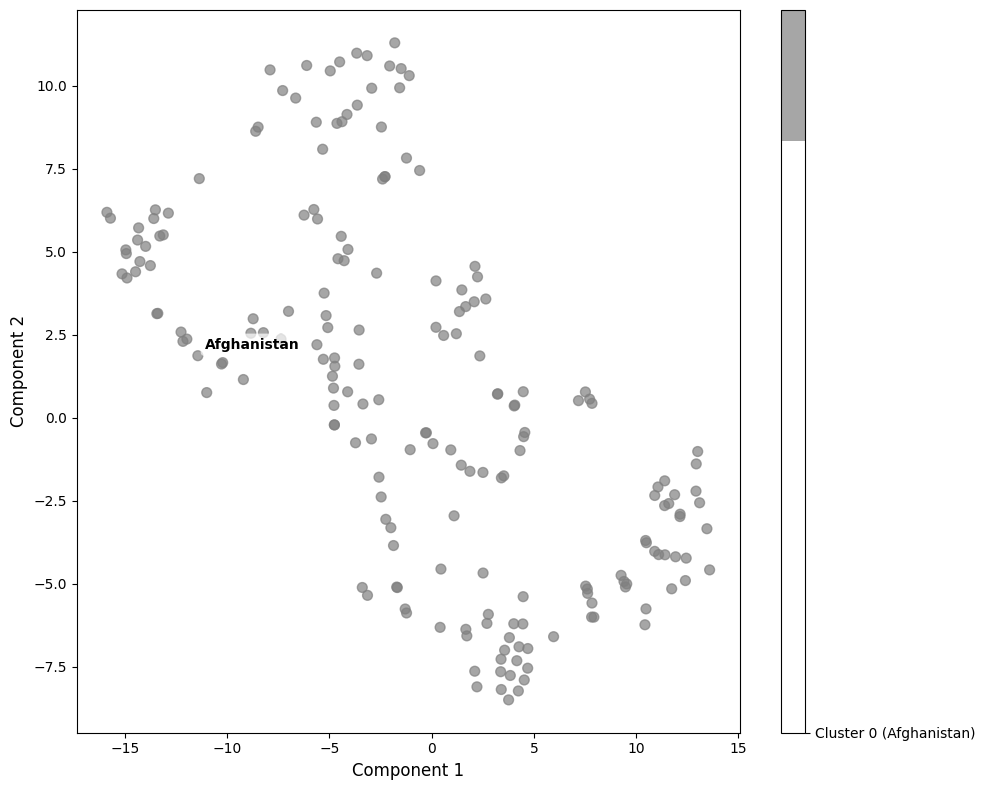

Score cannot be calculated, only one cluster found.
Score cannot be calculated, only one cluster found.
-----------------------
Epsilon: 4.0
Min Samples: 4
Score cannot be calculated, only one cluster found.
Score cannot be calculated, only one cluster found.
Number of clusters:  1
Number of points in cluster 0: 195
['Afghanistan' 'Albania' 'Algeria' 'Andorra' 'Angola'
 'Antigua and Barbuda' 'Argentina' 'Armenia' 'Australia' 'Austria'
 'Azerbaijan' 'Bahamas' 'Bahrain' 'Bangladesh' 'Barbados' 'Belarus'
 'Belgium' 'Belize' 'Benin' 'Bhutan' 'Bolivia (Plurinational State of)'
 'Bosnia and Herzegovina' 'Botswana' 'Brazil' 'Brunei Darussalam'
 'Bulgaria' 'Burkina Faso' 'Burundi' 'Cabo Verde' 'Cambodia' 'Cameroon'
 'Canada' 'Central African Republic' 'Chad' 'Chile' 'China' 'Colombia'
 'Comoros' 'Congo' 'Cook Islands' 'Costa Rica' "Cote d'Ivoire" 'Croatia'
 'Cuba' 'Cyprus' 'Czechia' "Democratic People's Republic of Korea"
 'Democratic Republic of the Congo' 'Denmark' 'Djibouti' 'Dominica'
 'Do

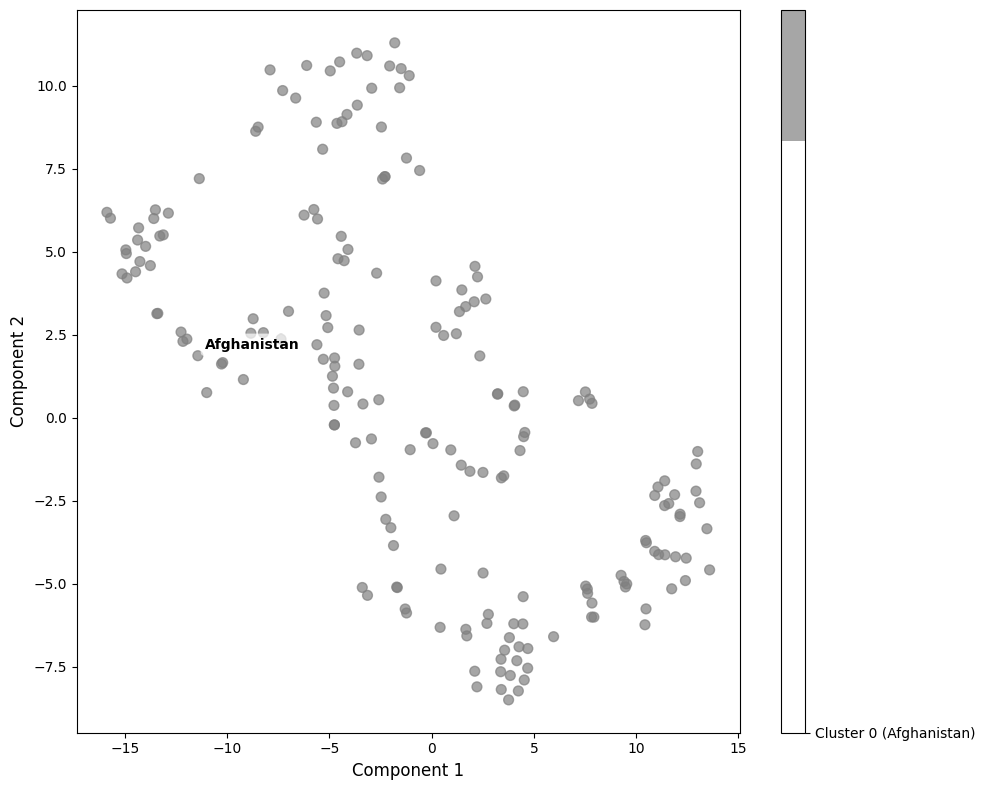

Score cannot be calculated, only one cluster found.
Score cannot be calculated, only one cluster found.
-----------------------
Epsilon: 4.0
Min Samples: 6
Score cannot be calculated, only one cluster found.
Score cannot be calculated, only one cluster found.
Number of clusters:  1
Number of points in cluster 0: 195
['Afghanistan' 'Albania' 'Algeria' 'Andorra' 'Angola'
 'Antigua and Barbuda' 'Argentina' 'Armenia' 'Australia' 'Austria'
 'Azerbaijan' 'Bahamas' 'Bahrain' 'Bangladesh' 'Barbados' 'Belarus'
 'Belgium' 'Belize' 'Benin' 'Bhutan' 'Bolivia (Plurinational State of)'
 'Bosnia and Herzegovina' 'Botswana' 'Brazil' 'Brunei Darussalam'
 'Bulgaria' 'Burkina Faso' 'Burundi' 'Cabo Verde' 'Cambodia' 'Cameroon'
 'Canada' 'Central African Republic' 'Chad' 'Chile' 'China' 'Colombia'
 'Comoros' 'Congo' 'Cook Islands' 'Costa Rica' "Cote d'Ivoire" 'Croatia'
 'Cuba' 'Cyprus' 'Czechia' "Democratic People's Republic of Korea"
 'Democratic Republic of the Congo' 'Denmark' 'Djibouti' 'Dominica'
 'Do

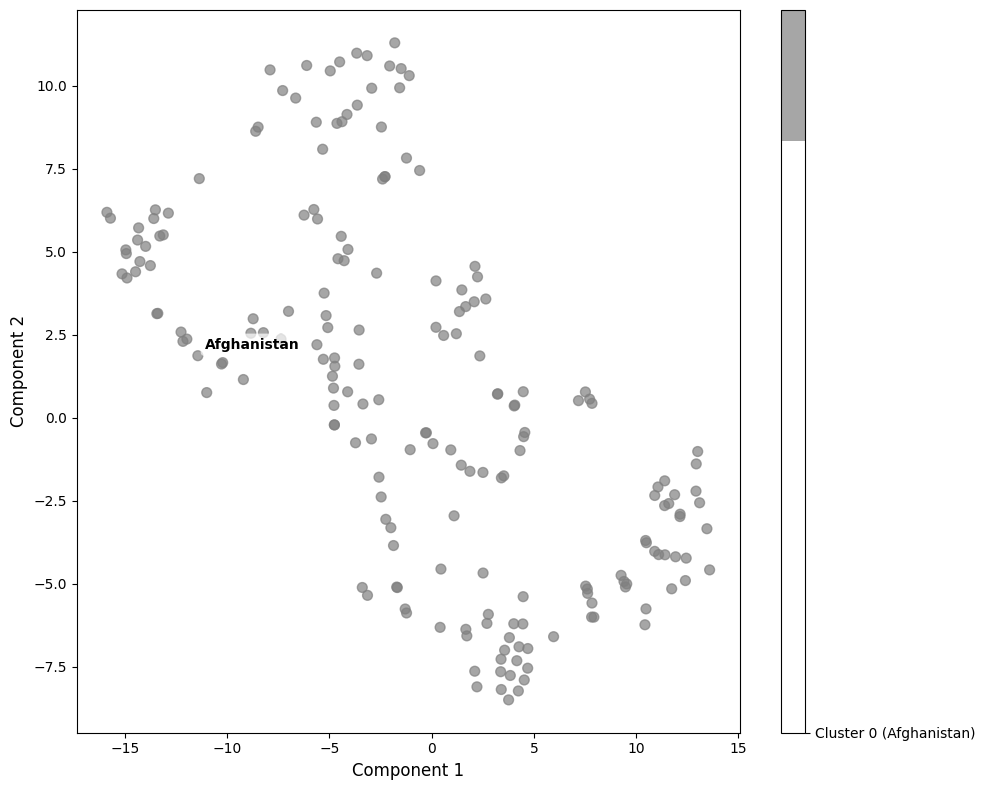

Score cannot be calculated, only one cluster found.
Score cannot be calculated, only one cluster found.
-----------------------
Epsilon: 4.0
Min Samples: 8
Score cannot be calculated, only one cluster found.
Score cannot be calculated, only one cluster found.
Number of clusters:  1
Number of points in cluster 0: 195
['Afghanistan' 'Albania' 'Algeria' 'Andorra' 'Angola'
 'Antigua and Barbuda' 'Argentina' 'Armenia' 'Australia' 'Austria'
 'Azerbaijan' 'Bahamas' 'Bahrain' 'Bangladesh' 'Barbados' 'Belarus'
 'Belgium' 'Belize' 'Benin' 'Bhutan' 'Bolivia (Plurinational State of)'
 'Bosnia and Herzegovina' 'Botswana' 'Brazil' 'Brunei Darussalam'
 'Bulgaria' 'Burkina Faso' 'Burundi' 'Cabo Verde' 'Cambodia' 'Cameroon'
 'Canada' 'Central African Republic' 'Chad' 'Chile' 'China' 'Colombia'
 'Comoros' 'Congo' 'Cook Islands' 'Costa Rica' "Cote d'Ivoire" 'Croatia'
 'Cuba' 'Cyprus' 'Czechia' "Democratic People's Republic of Korea"
 'Democratic Republic of the Congo' 'Denmark' 'Djibouti' 'Dominica'
 'Do

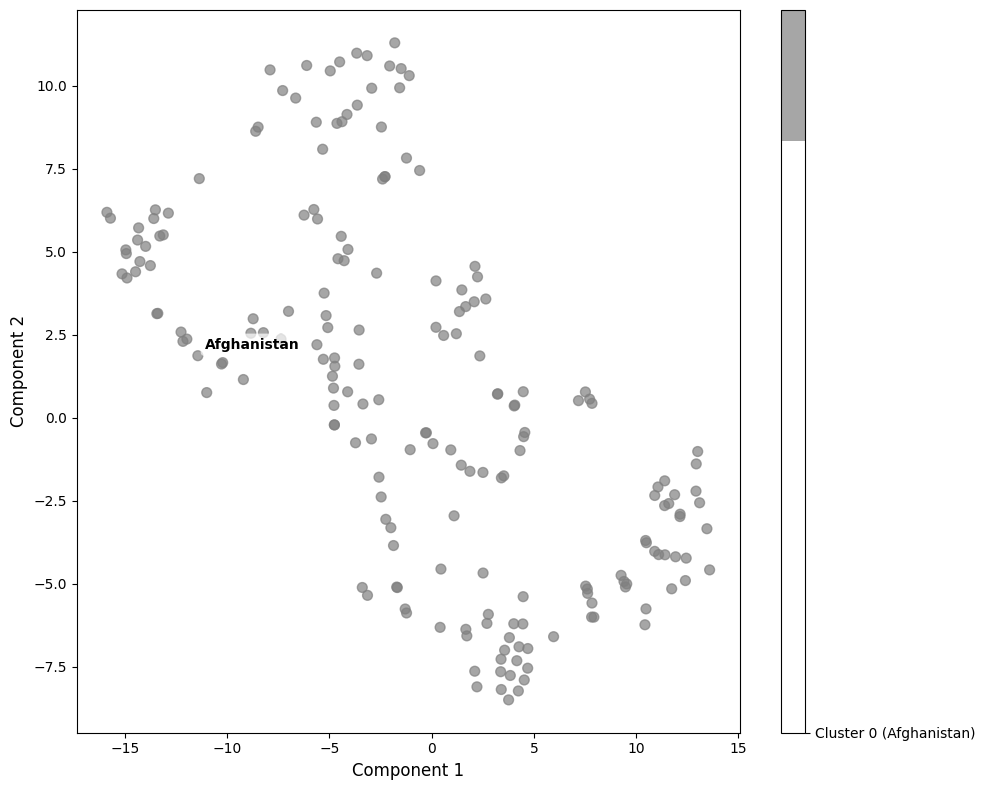

Score cannot be calculated, only one cluster found.
Score cannot be calculated, only one cluster found.
-----------------------
Epsilon: 4.0
Min Samples: 10
Score cannot be calculated, only one cluster found.
Score cannot be calculated, only one cluster found.
Number of clusters:  1
Number of points in cluster 0: 195
['Afghanistan' 'Albania' 'Algeria' 'Andorra' 'Angola'
 'Antigua and Barbuda' 'Argentina' 'Armenia' 'Australia' 'Austria'
 'Azerbaijan' 'Bahamas' 'Bahrain' 'Bangladesh' 'Barbados' 'Belarus'
 'Belgium' 'Belize' 'Benin' 'Bhutan' 'Bolivia (Plurinational State of)'
 'Bosnia and Herzegovina' 'Botswana' 'Brazil' 'Brunei Darussalam'
 'Bulgaria' 'Burkina Faso' 'Burundi' 'Cabo Verde' 'Cambodia' 'Cameroon'
 'Canada' 'Central African Republic' 'Chad' 'Chile' 'China' 'Colombia'
 'Comoros' 'Congo' 'Cook Islands' 'Costa Rica' "Cote d'Ivoire" 'Croatia'
 'Cuba' 'Cyprus' 'Czechia' "Democratic People's Republic of Korea"
 'Democratic Republic of the Congo' 'Denmark' 'Djibouti' 'Dominica'
 'D

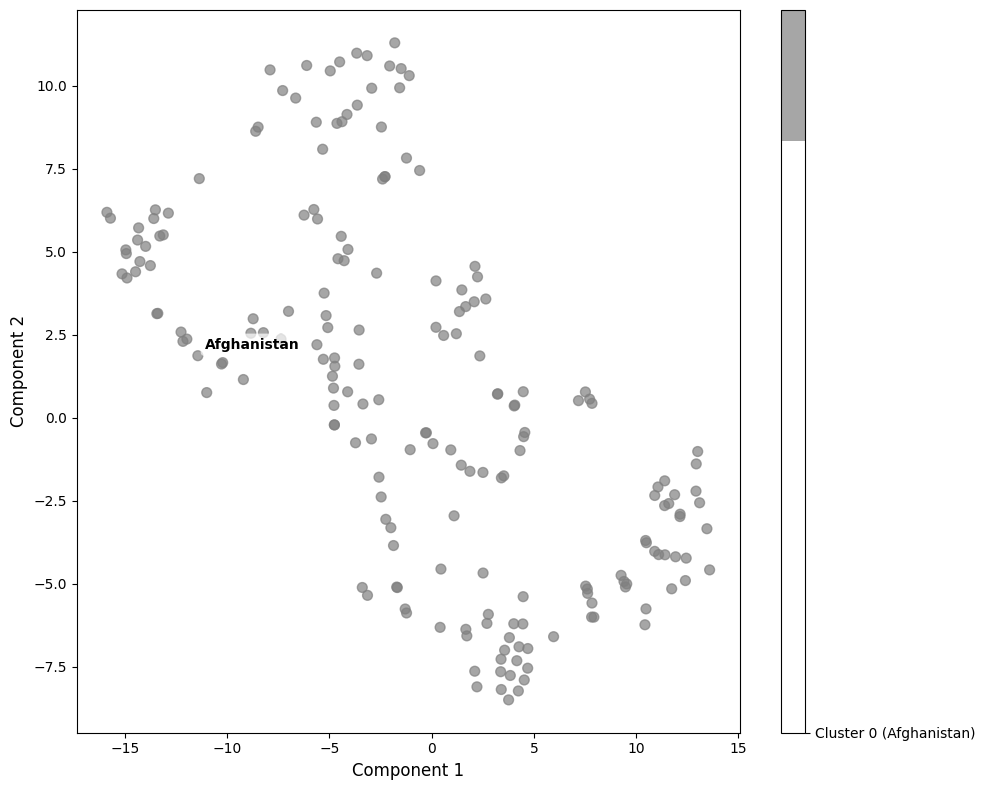

Score cannot be calculated, only one cluster found.
Score cannot be calculated, only one cluster found.
-----------------------
Epsilon: 4.0
Min Samples: 12
Score cannot be calculated, only one cluster found.
Score cannot be calculated, only one cluster found.
Number of clusters:  1
Number of points in cluster 0: 195
['Afghanistan' 'Albania' 'Algeria' 'Andorra' 'Angola'
 'Antigua and Barbuda' 'Argentina' 'Armenia' 'Australia' 'Austria'
 'Azerbaijan' 'Bahamas' 'Bahrain' 'Bangladesh' 'Barbados' 'Belarus'
 'Belgium' 'Belize' 'Benin' 'Bhutan' 'Bolivia (Plurinational State of)'
 'Bosnia and Herzegovina' 'Botswana' 'Brazil' 'Brunei Darussalam'
 'Bulgaria' 'Burkina Faso' 'Burundi' 'Cabo Verde' 'Cambodia' 'Cameroon'
 'Canada' 'Central African Republic' 'Chad' 'Chile' 'China' 'Colombia'
 'Comoros' 'Congo' 'Cook Islands' 'Costa Rica' "Cote d'Ivoire" 'Croatia'
 'Cuba' 'Cyprus' 'Czechia' "Democratic People's Republic of Korea"
 'Democratic Republic of the Congo' 'Denmark' 'Djibouti' 'Dominica'
 'D

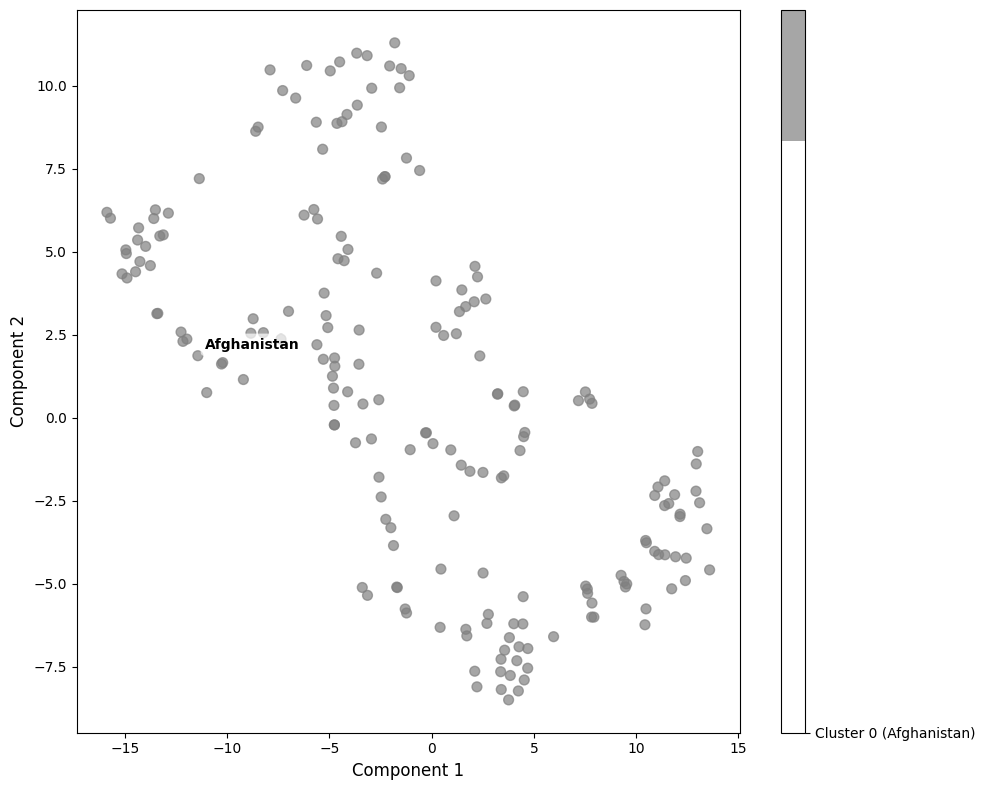

Score cannot be calculated, only one cluster found.
Score cannot be calculated, only one cluster found.
-----------------------
Epsilon: 4.0
Min Samples: 14
Score cannot be calculated, only one cluster found.
Score cannot be calculated, only one cluster found.
Number of clusters:  1
Number of points in cluster 0: 195
['Afghanistan' 'Albania' 'Algeria' 'Andorra' 'Angola'
 'Antigua and Barbuda' 'Argentina' 'Armenia' 'Australia' 'Austria'
 'Azerbaijan' 'Bahamas' 'Bahrain' 'Bangladesh' 'Barbados' 'Belarus'
 'Belgium' 'Belize' 'Benin' 'Bhutan' 'Bolivia (Plurinational State of)'
 'Bosnia and Herzegovina' 'Botswana' 'Brazil' 'Brunei Darussalam'
 'Bulgaria' 'Burkina Faso' 'Burundi' 'Cabo Verde' 'Cambodia' 'Cameroon'
 'Canada' 'Central African Republic' 'Chad' 'Chile' 'China' 'Colombia'
 'Comoros' 'Congo' 'Cook Islands' 'Costa Rica' "Cote d'Ivoire" 'Croatia'
 'Cuba' 'Cyprus' 'Czechia' "Democratic People's Republic of Korea"
 'Democratic Republic of the Congo' 'Denmark' 'Djibouti' 'Dominica'
 'D

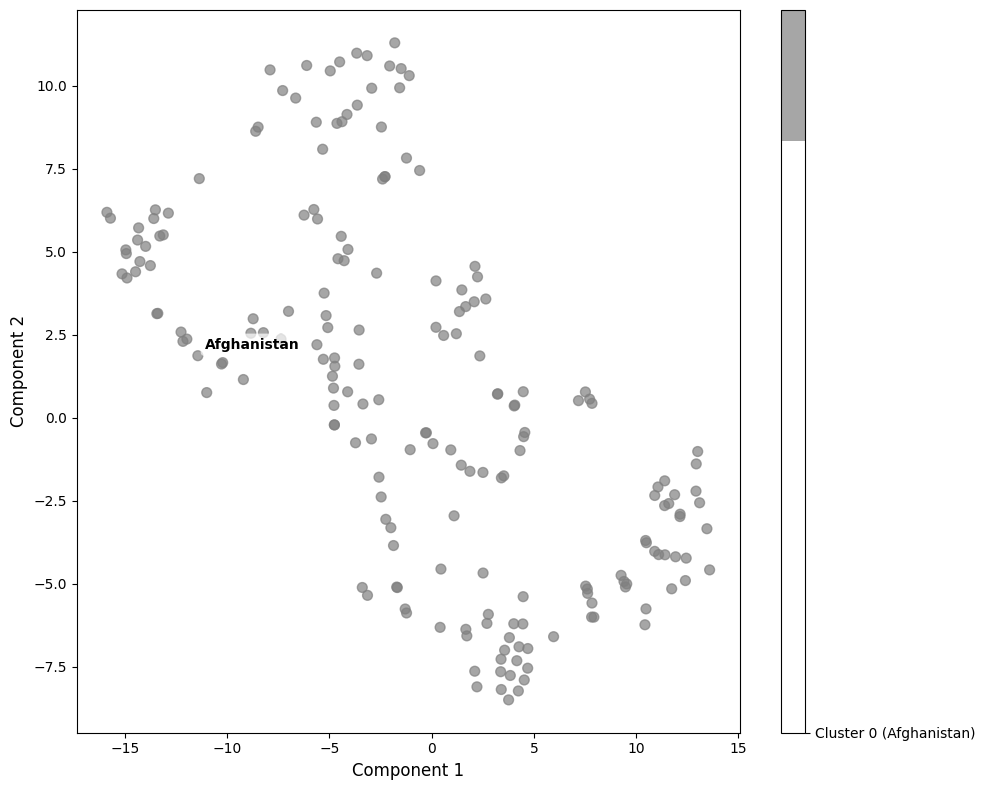

Score cannot be calculated, only one cluster found.
Score cannot be calculated, only one cluster found.
-----------------------
Epsilon: 4.0
Min Samples: 16
Score cannot be calculated, only one cluster found.
Score cannot be calculated, only one cluster found.
Number of clusters:  1
Number of points in cluster 0: 195
['Afghanistan' 'Albania' 'Algeria' 'Andorra' 'Angola'
 'Antigua and Barbuda' 'Argentina' 'Armenia' 'Australia' 'Austria'
 'Azerbaijan' 'Bahamas' 'Bahrain' 'Bangladesh' 'Barbados' 'Belarus'
 'Belgium' 'Belize' 'Benin' 'Bhutan' 'Bolivia (Plurinational State of)'
 'Bosnia and Herzegovina' 'Botswana' 'Brazil' 'Brunei Darussalam'
 'Bulgaria' 'Burkina Faso' 'Burundi' 'Cabo Verde' 'Cambodia' 'Cameroon'
 'Canada' 'Central African Republic' 'Chad' 'Chile' 'China' 'Colombia'
 'Comoros' 'Congo' 'Cook Islands' 'Costa Rica' "Cote d'Ivoire" 'Croatia'
 'Cuba' 'Cyprus' 'Czechia' "Democratic People's Republic of Korea"
 'Democratic Republic of the Congo' 'Denmark' 'Djibouti' 'Dominica'
 'D

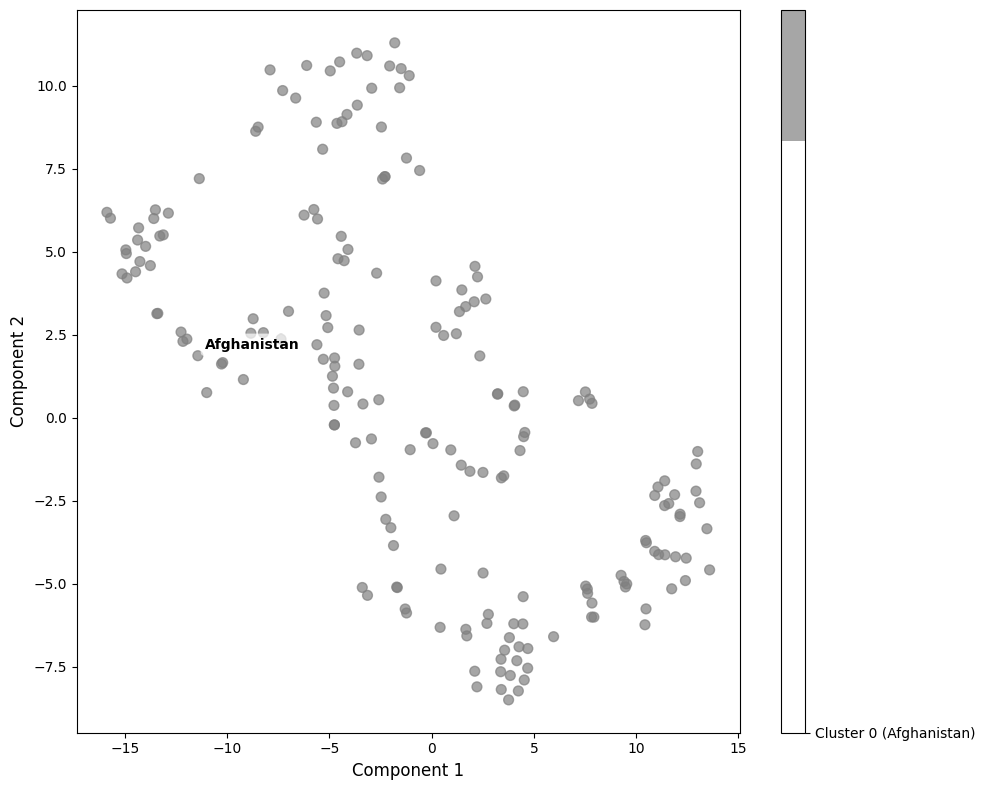

Score cannot be calculated, only one cluster found.
Score cannot be calculated, only one cluster found.
-----------------------
Epsilon: 4.0
Min Samples: 18
Score cannot be calculated, only one cluster found.
Score cannot be calculated, only one cluster found.
Number of clusters:  1
Number of points in cluster 0: 195
['Afghanistan' 'Albania' 'Algeria' 'Andorra' 'Angola'
 'Antigua and Barbuda' 'Argentina' 'Armenia' 'Australia' 'Austria'
 'Azerbaijan' 'Bahamas' 'Bahrain' 'Bangladesh' 'Barbados' 'Belarus'
 'Belgium' 'Belize' 'Benin' 'Bhutan' 'Bolivia (Plurinational State of)'
 'Bosnia and Herzegovina' 'Botswana' 'Brazil' 'Brunei Darussalam'
 'Bulgaria' 'Burkina Faso' 'Burundi' 'Cabo Verde' 'Cambodia' 'Cameroon'
 'Canada' 'Central African Republic' 'Chad' 'Chile' 'China' 'Colombia'
 'Comoros' 'Congo' 'Cook Islands' 'Costa Rica' "Cote d'Ivoire" 'Croatia'
 'Cuba' 'Cyprus' 'Czechia' "Democratic People's Republic of Korea"
 'Democratic Republic of the Congo' 'Denmark' 'Djibouti' 'Dominica'
 'D

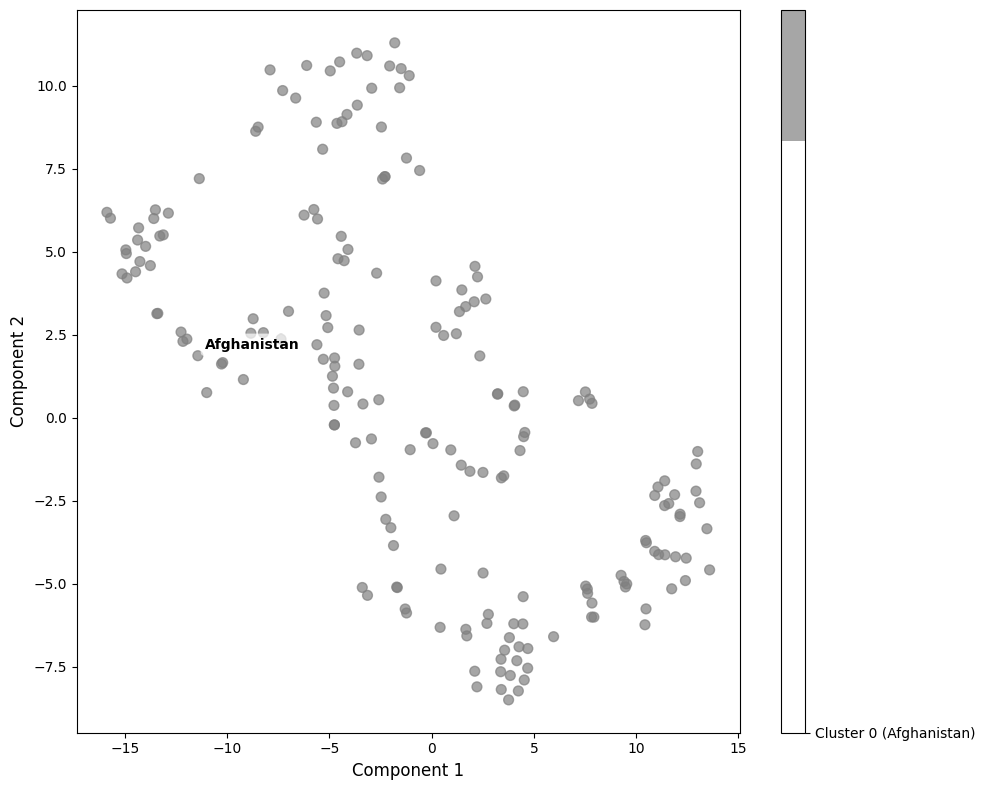

In [34]:
import numpy as np 
import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN

eps_list = np.linspace(1, 4, 8)
min_samples_list = np.arange(2, 20, 2)
score = np.zeros((len(eps_list), len(min_samples_list)))

result = pd.DataFrame(columns=['eps', 'min_samples', 'silhouette' ,'davies_bouldin'])

for eps in range(len(eps_list)):
    for min_samples in range(len(min_samples_list)):
        dbscan = DBSCAN(eps=eps_list[eps], min_samples=min_samples_list[min_samples])
        dbscan.fit(clustering_data)
        mask = dbscan.labels_ != -1
        data = clustering_data[mask]
        labels = dbscan.labels_[mask]
        combined_df['Cluster'] = dbscan.labels_
             
        silhouette = evaluate_clusters(silhouette_score, data, labels)
        davies_bouldin = evaluate_clusters(davies_bouldin_score, data, labels)
        result.loc[len(result)] = [eps_list[eps], min_samples_list[min_samples], silhouette, davies_bouldin]

        print("-----------------------")
        print(f"Epsilon: {eps_list[eps]}")
        print(f"Min Samples: {min_samples_list[min_samples]}")
        score[eps, min_samples] = evaluate_clusters(silhouette_score, data, labels)
        score[eps, min_samples] = evaluate_clusters(davies_bouldin_score, data, labels)
        print("Number of clusters: " ,len(np.unique(labels)))
        for label in np.unique(labels):
            print(f"Number of points in cluster {label}: {len(data[labels == label])}")
            representative_countries = np.array(combined_df.loc[combined_df['Cluster']==label, 'Location'])
            print(representative_countries)
            print()
        plot_clusters_2d(dbscan, clustering_data, combined_df, noise=True, pca=False)


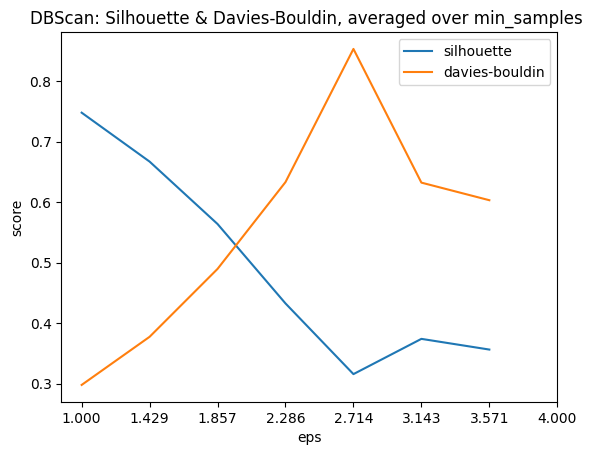

In [35]:
import matplotlib.pyplot as plt
sort = result.sort_values('eps', ascending=True)
eps = sort.groupby('eps').mean()
plt.plot(eps.index, eps['silhouette'])
plt.plot(eps.index, eps['davies_bouldin'])
plt.title('DBScan: Silhouette & Davies-Bouldin, averaged over min_samples ')
plt.legend(['silhouette', 'davies-bouldin'])
plt.xlabel('eps')
plt.ylabel('score')
plt.xticks(eps_list)
plt.show()

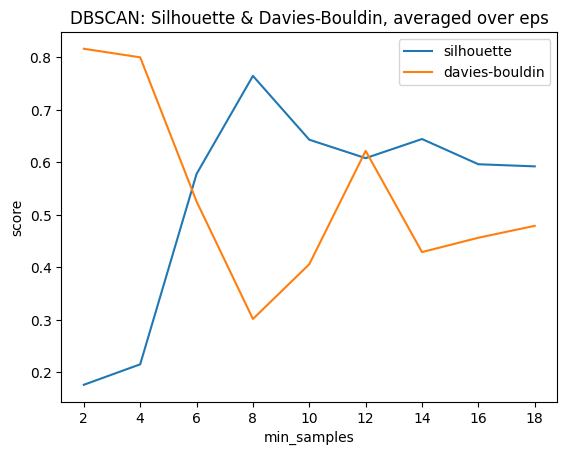

In [36]:
import matplotlib.pyplot as plt
sort = result.sort_values('min_samples', ascending=True)
min_samp = sort.groupby('min_samples').mean()
plt.plot(min_samp.index, min_samp['silhouette'])
plt.plot(min_samp.index, min_samp['davies_bouldin'])
plt.title('DBSCAN: Silhouette & Davies-Bouldin, averaged over eps')
plt.legend(['silhouette', 'davies-bouldin'])
plt.xlabel('min_samples')
plt.xticks(min_samples_list)
plt.ylabel('score')
plt.show()